# **Speed Printing with Hiearchical Forecasting V1.5**

In [293]:
#!pip install pyaf
!pip install darts

     |████████████████████████████████| 346 kB 14.2 MB/s 
     |████████████████████████████████| 792 kB 66.1 MB/s 
     |████████████████████████████████| 65 kB 3.4 MB/s 
     |████████████████████████████████| 172 kB 72.3 MB/s 
     |████████████████████████████████| 76 kB 4.2 MB/s 
     |████████████████████████████████| 527 kB 60.8 MB/s 
     |████████████████████████████████| 380 kB 67.0 MB/s 
     |████████████████████████████████| 49 kB 5.1 MB/s 
     |████████████████████████████████| 43 kB 1.8 MB/s 
     |████████████████████████████████| 397 kB 74.8 MB/s 
     |████████████████████████████████| 133 kB 71.8 MB/s 
     |████████████████████████████████| 952 kB 57.0 MB/s 
     |████████████████████████████████| 829 kB 60.2 MB/s 
     |████████████████████████████████| 596 kB 69.5 MB/s 
     |████████████████████████████████| 1.1 MB 73.9 MB/s 
     |████████████████████████████████| 271 kB 86.7 MB/s 
     |████████████████████████████████| 94 kB 2.7 MB/s 
     |██████████████████

# **Importing Libraries**

Python code in one module gains access to the code in another module by the process of importing it. The import statement is the most common way of invoking the import machinery, but it is not the only way. 

A Python library is a collection of related modules. It contains bundles of code that can be used repeatedly in different programs. It makes Python Programming simpler and convenient for the programmer.

In [1]:
import pandas as pd
import numpy as np
import statistics
import datetime
import calendar

import seaborn as sns 
import matplotlib.pyplot as plt
import matplotlib.ticker as ticker

import plotly.express as px
import plotly.graph_objects as go
from plotly.graph_objects import Layout
from plotly.subplots import make_subplots

from IPython.display import display_html,display,HTML
from itertools import chain,cycle

from pydrive.auth import GoogleAuth
from pydrive.drive import GoogleDrive
from google.colab import auth
from oauth2client.client import GoogleCredentials

import warnings
warnings.filterwarnings("ignore")

In [2]:
# remove the notebook root logger.\n",
import logging
logger = logging.getLogger()
logger.handlers = []

In [3]:
auth.authenticate_user()
gauth = GoogleAuth()
gauth.credentials = GoogleCredentials.get_application_default()
drive = GoogleDrive(gauth)

In [4]:
downloaded = drive.CreateFile({'id':"1qAL63DjGAndmf4FgN3J5F6CRcFoSAz21"})
downloaded.GetContentFile('2021_RDD_SPNP_1.csv')

# **Importing Data**
In any data analysis project, we seek to discover useful, actionable insights from a given set of data. If we’re lucky, this data may already be packaged for us; if not, we may need to collect it ourselves. Either way, once the data is stored, we will need to read it into a program to perform analysis.
The software package *pandas* is often used for this purpose. It is a powerful library that works with the Python programming language. Within pandas, the tool of choice to read in data files is the ubiquitous `read_csv `or `read_excel` function.

In [5]:
# import train and test data
df = pd.read_csv('2021_RDD_SPNP_1.csv',index_col=0)

In [6]:
# print the first eight rows of the dataset
df.head(8)

,Date,Week,Month,Day,Hour,Breakdown,MachineID,OrderID,JobName,NoJI,Cylinder,SLCL,NWA,OTS,MA,FILM,OP,TCL,LCL,SPEED,RunTime,Downtime
0,2021-01-01,1- W1,Jan,1,0:00,PF,PR01,NaN,NaN,NaN,NaN,0,0,0,0,NaN,0,0,0,0,0,1
1,2021-01-01,1- W1,Jan,1,0:01,US,PR01,NaN,NaN,NaN,NaN,0,0,0,0,NaN,0,0,0,0,0,1
2,2021-01-01,1- W1,Jan,1,0:02,US,PR01,NaN,NaN,NaN,NaN,0,0,0,0,NaN,0,0,0,0,0,1
3,2021-01-01,1- W1,Jan,1,0:03,US,PR01,NaN,NaN,NaN,NaN,0,0,0,0,NaN,0,0,0,0,0,1
4,2021-01-01,1- W1,Jan,1,0:04,US,PR01,NaN,NaN,NaN,NaN,0,0,0,0,NaN,0,0,0,0,0,1
5,2021-01-01,1- W1,Jan,1,0:05,US,PR01,NaN,NaN,NaN,NaN,0,0,0,0,NaN,0,0,0,0,0,1
6,2021-01-01,1- W1,Jan,1,0:06,US,PR01,NaN,NaN,NaN,NaN,0,0,0,0,NaN,0,0,0,0,0,1
7,2021-01-01,1- W1,Jan,1,0:07,US,PR01,NaN,NaN,NaN,NaN,0,0,0,0,NaN,0,0,0,0,0,1


In [7]:
# print how many rows and columns are in the dataset
print("The data has", len(df), "rows and", len(df.columns), "columns")

The data has 2929156 rows and 22 columns


In [8]:
# check data types of all columns
df.dtypes

Date          object
Week          object
Month         object
Day            int64
Hour          object
Breakdown     object
MachineID     object
OrderID       object
JobName       object
NoJI          object
Cylinder     float64
SLCL           int64
NWA            int64
OTS            int64
MA             int64
FILM          object
OP             int64
TCL            int64
LCL            int64
SPEED          int64
RunTime        int64
Downtime       int64
dtype: object

# **Data Prepraration**

Data preparation is the process of cleaning and transforming raw data prior to processing and analysis. It is an important step prior to processing and often involves reformatting data, making corrections to data and the combining of data sets to enrich data.

Data preparation is often a lengthy undertaking for data professionals or business users, but it is essential as a prerequisite to put data in context in order to turn it into insights and eliminate bias resulting from poor data quality.

For example, the data preparation process usually includes standardizing data formats, enriching source data, and/or removing outliers.

### **1. Changing data formats**

In [9]:
# change 'Date' data type to date
df['Date']= pd.to_datetime(df['Date'],format='%Y-%m-%d')
df.dtypes

Date         datetime64[ns]
Week                 object
Month                object
Day                   int64
Hour                 object
Breakdown            object
MachineID            object
OrderID              object
JobName              object
NoJI                 object
Cylinder            float64
SLCL                  int64
NWA                   int64
OTS                   int64
MA                    int64
FILM                 object
OP                    int64
TCL                   int64
LCL                   int64
SPEED                 int64
RunTime               int64
Downtime              int64
dtype: object

## **2. Dimensionality Reduction**

In [10]:
# delete unnecessary colums for EDA
df = df.drop(columns= ['JobName','NoJI','Cylinder','SLCL','MA','LCL','OTS'], axis=1)

# print the first 5 rows in dataset to check if the above columns have been deleted
df.head(8)

,Date,Week,Month,Day,Hour,Breakdown,MachineID,OrderID,NWA,FILM,OP,TCL,SPEED,RunTime,Downtime
0,2021-01-01,1- W1,Jan,1,0:00,PF,PR01,NaN,0,NaN,0,0,0,0,1
1,2021-01-01,1- W1,Jan,1,0:01,US,PR01,NaN,0,NaN,0,0,0,0,1
2,2021-01-01,1- W1,Jan,1,0:02,US,PR01,NaN,0,NaN,0,0,0,0,1
3,2021-01-01,1- W1,Jan,1,0:03,US,PR01,NaN,0,NaN,0,0,0,0,1
4,2021-01-01,1- W1,Jan,1,0:04,US,PR01,NaN,0,NaN,0,0,0,0,1
5,2021-01-01,1- W1,Jan,1,0:05,US,PR01,NaN,0,NaN,0,0,0,0,1
6,2021-01-01,1- W1,Jan,1,0:06,US,PR01,NaN,0,NaN,0,0,0,0,1
7,2021-01-01,1- W1,Jan,1,0:07,US,PR01,NaN,0,NaN,0,0,0,0,1


## **3. Handling missing values**

In [11]:
# check the percentage of missing values
def missing_values(data):
    total = data.isnull().sum()
    percent = data.isnull().mean()*100
    return pd.concat([total, percent], axis=1, keys=['Total', 'Percent'])
missing_values(df)

,Total,Percent
Date,0,0.000000
Week,0,0.000000
Month,0,0.000000
Day,0,0.000000
Hour,0,0.000000
Breakdown,0,0.000000
MachineID,0,0.000000
OrderID,217663,7.430912
NWA,0,0.000000
FILM,209651,7.157386


In [12]:
# replacing missing values in 'FILM' with OTHER
df['FILM'].fillna('OTHER', inplace = True)
df['OrderID'].fillna('NoOrderID', inplace = True)

# check if the missing values have been replaced
missing_values(df)

,Total,Percent
Date,0,0.0
Week,0,0.0
Month,0,0.0
Day,0,0.0
Hour,0,0.0
Breakdown,0,0.0
MachineID,0,0.0
OrderID,0,0.0
NWA,0,0.0
FILM,0,0.0


## **4. Removing negative data and duplicates**

In [13]:
# descriptive stats of the data, negative value on SPEED
df.describe().T

,count,mean,std,min,25%,50%,75%,max
Day,2929156.0,15.818634,8.852648,1.0,8.0,16.0,23.0,31.0
NWA,2929156.0,0.181236,0.385214,0.0,0.0,0.0,0.0,1.0
OP,2929156.0,234549.514092,331181.116755,0.0,27000.0,100000.0,290000.0,1908000.0
TCL,2929156.0,300.374819,131.700381,0.0,220.0,330.0,370.0,480.0
SPEED,2929156.0,207.430555,159.770196,-53.0,5.0,221.0,350.0,501.0
RunTime,2929156.0,0.592641,0.491343,0.0,0.0,1.0,1.0,1.0
Downtime,2929156.0,0.407359,0.491343,0.0,0.0,0.0,1.0,1.0


In [14]:
df[df['SPEED']<0]

,Date,Week,Month,Day,Hour,Breakdown,MachineID,OrderID,NWA,FILM,OP,TCL,SPEED,RunTime,Downtime
2127696,2021-09-13,9- W3,Sep,13,15:11,MQ,PR07,0344E-20,0,OPP,370000,400,-53,0,1
2127697,2021-09-13,9- W3,Sep,13,15:12,MQ,PR07,0344E-20,0,OPP,370000,400,-53,0,1


In [15]:
# removing outliers
df['SPEED'] = df['SPEED'].mask(df['SPEED'] < 0, 0)

df.describe().T

,count,mean,std,min,25%,50%,75%,max
Day,2929156.0,15.818634,8.852648,1.0,8.0,16.0,23.0,31.0
NWA,2929156.0,0.181236,0.385214,0.0,0.0,0.0,0.0,1.0
OP,2929156.0,234549.514092,331181.116755,0.0,27000.0,100000.0,290000.0,1908000.0
TCL,2929156.0,300.374819,131.700381,0.0,220.0,330.0,370.0,480.0
SPEED,2929156.0,207.430591,159.770143,0.0,5.0,221.0,350.0,501.0
RunTime,2929156.0,0.592641,0.491343,0.0,0.0,1.0,1.0,1.0
Downtime,2929156.0,0.407359,0.491343,0.0,0.0,0.0,1.0,1.0


In [16]:
# Selecting duplicate rows except first
# occurrence based on all columns
duplicate = df[df.duplicated(['Date','Hour','MachineID'],keep='last')]
 
# Print the resultant Dataframe
# print how many rows and columns are in the dataset
print("There are", len(duplicate), "duplicated data in the dataset or approx. "+str(round(100*len(duplicate)/len(df),2))+'%')
print("Duplicate Rows :")
 
# Print the resultant Dataframe
duplicate

There are 25750 duplicated data in the dataset or approx. 0.88%
Duplicate Rows :


,Date,Week,Month,Day,Hour,Breakdown,MachineID,OrderID,NWA,FILM,OP,TCL,SPEED,RunTime,Downtime
3484,2021-01-03,1- W1,Jan,3,10:34,CO1,PR01,55968-20,0,PET,48000,230,28,0,1
10141,2021-01-08,1- W2,Jan,8,3:00,MQ,PR01,55840-20,0,OPP,16000,180,181,0,1
14555,2021-01-11,1- W3,Jan,11,5:59,RUN,PR01,56112-20,1,NYL,560000,200,190,1,0
14557,2021-01-11,1- W3,Jan,11,6:00,RUN,PR01,55929-20,0,OPP,12000,180,190,1,0
14559,2021-01-11,1- W3,Jan,11,6:01,RUN,PR01,56112-20,1,NYL,560000,200,190,1,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2905957,2021-12-14,12- W3,Dec,14,16:36,RUN,PR07,61603-21,0,NYL,300000,370,410,1,0
2905959,2021-12-14,12- W3,Dec,14,16:37,RUN,PR07,61603-21,0,NYL,300000,370,410,1,0
2905961,2021-12-14,12- W3,Dec,14,16:38,RUN,PR07,61603-21,0,NYL,300000,370,410,1,0
2905963,2021-12-14,12- W3,Dec,14,16:39,RUN,PR07,61603-21,0,NYL,300000,370,410,1,0


In [17]:
df[((df['Date']=='2021-01-08')&(df['Hour']=='3:00'))&(df['MachineID']=='PR01')]

,Date,Week,Month,Day,Hour,Breakdown,MachineID,OrderID,NWA,FILM,OP,TCL,SPEED,RunTime,Downtime
10141,2021-01-08,1- W2,Jan,8,3:00,MQ,PR01,55840-20,0,OPP,16000,180,181,0,1
10142,2021-01-08,1- W2,Jan,8,3:00,RUN,PR01,55840-20,0,OPP,16000,180,181,1,0


In [18]:
# drop duplicates
df.drop_duplicates(['Date','Hour','MachineID'],inplace=True)
df.reset_index(inplace=True)
duplicate = df[df.duplicated(['Date','Hour','MachineID'])]
 
# Print the resultant Dataframe
# print how many rows and columns are in the dataset
print("There are", len(duplicate), "duplicated data in the dataset")

There are 0 duplicated data in the dataset


## **5. Subsetting Data**

In [19]:
# slice the BD Code 'RUN' for easy computing
run = df[df['Breakdown']=='RUN'].drop(columns=['Downtime'])
run['Month'] = run['Date'].dt.month

# print the dataset to check the slice
run.head()

,index,Date,Week,Month,Day,Hour,Breakdown,MachineID,OrderID,NWA,FILM,OP,TCL,SPEED,RunTime
1987,1987,2021-01-02,1- W1,1,2,9:23,RUN,PR01,55920-20,0,PET,12000,200,180,1
1988,1988,2021-01-02,1- W1,1,2,9:24,RUN,PR01,55920-20,0,PET,12000,200,180,1
1989,1989,2021-01-02,1- W1,1,2,9:25,RUN,PR01,55920-20,0,PET,12000,200,180,1
1990,1990,2021-01-02,1- W1,1,2,9:26,RUN,PR01,55920-20,1,PET,12000,200,181,1
1991,1991,2021-01-02,1- W1,1,2,9:27,RUN,PR01,55920-20,1,PET,12000,200,181,1


In [20]:
# slicing monthly runtime data per material
run_monthly = run.pivot_table(values='RunTime', index='Month', columns='FILM', fill_value=0, aggfunc=np.sum)
run_monthly = run_monthly.reset_index().rename_axis(None, axis=1)

# remove unnecessary materials
run_monthly = run_monthly.drop(columns=['BOP','CPP','LIT','OTHER'])

run_monthly

,Month,NYL,OPP,PET
0,1,20039,18672,100990
1,2,23677,16954,91562
2,3,24602,28527,102728
3,4,17999,27021,92457
4,5,14550,33122,75419
5,6,12689,25493,82802
6,7,17284,30441,88762
7,8,14531,36040,84381
8,9,16414,41390,90038
9,10,19051,33972,97394


In [21]:
# slicing weekly runtime data per material
run_weekly = run.pivot_table(values='RunTime', index='Date', columns='FILM', fill_value=0, aggfunc=np.sum)
run_weekly = run_weekly.resample('W-MON').sum()
run_weekly = run_weekly.reset_index().rename_axis(None, axis=1)

# remove unnecessary materials
run_weekly = run_weekly.drop(columns=['BOP','CPP','LIT','OTHER'])
run_weekly.head()

,Date,NYL,OPP,PET
0,2021-01-04,2320,276,10344
1,2021-01-11,3081,4381,23974
2,2021-01-18,6463,7960,21631
3,2021-01-25,4035,3665,26997
4,2021-02-01,4424,2390,21532


In [97]:
# slicing daily runtime data per material
run_daily = run.pivot_table(values='RunTime', index='Date', columns='FILM', fill_value=0, aggfunc=np.sum)
run_daily = run_daily.reset_index().rename_axis(None, axis=1)

# remove unnecessary materials
run_daily = run_daily.drop(columns=['BOP','CPP','LIT','OTHER'])
run_daily

,Date,NYL,OPP,PET
0,2021-01-02,65,178,3339
1,2021-01-03,1637,98,2844
2,2021-01-04,618,0,4161
3,2021-01-05,792,230,3188
4,2021-01-06,183,319,4128
...,...,...,...,...
354,2021-12-27,294,2932,1610
355,2021-12-28,384,962,3015
356,2021-12-29,1285,90,3314
357,2021-12-30,315,487,3765


In [23]:
# output per machine per film
op = run.pivot_table(values='SPEED',index=['Date','Month','MachineID','FILM'],aggfunc='mean').reset_index().rename_axis(None, axis=1)
op['SPEED'] = op['SPEED'].round(0).astype(int)
op['RunTime'] = run.groupby(['Date','MachineID','FILM'])['RunTime'].sum().reset_index().drop(columns=['Date','MachineID','FILM'])
op['Output'] = (op['RunTime'] * op['SPEED']).astype(int)
op.drop(op[(op['FILM']=='BOP')|(op['FILM']=='CPP')|(op['FILM']=='LIT')|(op['FILM']=='OTHER')].index, inplace=True)

op.head()

,Date,Month,MachineID,FILM,SPEED,RunTime,Output
1,2021-01-02,1,PR01,PET,212,493,104516
2,2021-01-02,1,PR02,OPP,178,178,31684
4,2021-01-02,1,PR02,PET,213,355,75615
5,2021-01-02,1,PR03,NYL,263,65,17095
7,2021-01-02,1,PR03,PET,308,454,139832


In [24]:
# slice the BD Code to not 'RUN' for easy computing
down = df[(df['Breakdown']!='RUN') & (df['Breakdown']!='OTS') & (df['Breakdown']!='PF')].drop(columns=['RunTime'])
down['Month'] = down['Date'].dt.month

# print the dataset to check the slice
down.head()

,index,Date,Week,Month,Day,Hour,Breakdown,MachineID,OrderID,NWA,FILM,OP,TCL,SPEED,Downtime
1,1,2021-01-01,1- W1,1,1,0:01,US,PR01,NoOrderID,0,OTHER,0,0,0,1
2,2,2021-01-01,1- W1,1,1,0:02,US,PR01,NoOrderID,0,OTHER,0,0,0,1
3,3,2021-01-01,1- W1,1,1,0:03,US,PR01,NoOrderID,0,OTHER,0,0,0,1
4,4,2021-01-01,1- W1,1,1,0:04,US,PR01,NoOrderID,0,OTHER,0,0,0,1
5,5,2021-01-01,1- W1,1,1,0:05,US,PR01,NoOrderID,0,OTHER,0,0,0,1


In [25]:
# slicing monthly downtime data per material
down_monthly = down.pivot_table(values='Downtime', index='Month', columns='FILM', fill_value=0, aggfunc=np.sum)
down_monthly = down_monthly.reset_index().rename_axis(None, axis=1)

# remove unnecessary materials
down_monthly = down_monthly.drop(columns=['BOP','CPP','LIT','OTHER'])
down_monthly.head()

,Month,NYL,OPP,PET
0,1,12962,8430,38471
1,2,13651,6514,32434
2,3,11183,10964,36234
3,4,10911,13409,37742
4,5,8287,10142,31405


In [26]:
# slicing weekly downtime data per material
down_weekly = down.pivot_table(values='Downtime', index='Date', columns='FILM', fill_value=0, aggfunc=np.sum)
down_weekly = down_weekly.resample('W-MON').sum()
down_weekly = down_weekly.reset_index().rename_axis(None, axis=1)

# remove unnecessary materials
down_weekly = down_weekly.drop(columns=['BOP','CPP','LIT','OTHER'])
down_weekly.head()

,Date,NYL,OPP,PET
0,2021-01-04,1235,395,4575
1,2021-01-11,1908,2120,11329
2,2021-01-18,3465,2757,7775
3,2021-01-25,3573,1851,7053
4,2021-02-01,3385,1307,9457


In [27]:
# slicing daily downtime data per material
down_daily = down.pivot_table(values='Downtime', index='Date', columns='FILM', fill_value=0, aggfunc=np.sum)
down_daily = down_daily.reset_index().rename_axis(None, axis=1)

# remove unnecessary materials
down_daily = down_daily.drop(columns=['BOP','CPP','LIT','OTHER'])
down_daily.head()

,Date,NYL,OPP,PET
0,2021-01-01,0,0,0
1,2021-01-02,113,213,1267
2,2021-01-03,632,182,1303
3,2021-01-04,490,0,2005
4,2021-01-05,358,401,1998


In [28]:
# slicing monthly runtime data per machine
rmc_monthly = run.pivot_table(values='RunTime', index='Month', columns='MachineID', fill_value=0, aggfunc=np.sum)
rmc_monthly = rmc_monthly.reset_index().rename_axis(None, axis=1)

rmc_monthly.head()

,Month,PR01,PR02,PR03,PR05,PR06,PR07
0,1,22408,19879,23387,28227,25366,24379
1,2,21672,18710,19291,27797,24546,27721
2,3,26631,19109,23290,32809,26663,34022
3,4,21493,20273,23176,31665,24551,20685
4,5,20795,17769,17269,29618,19388,23093


In [29]:
# slicing monthly downtime data per machine
dmc_monthly = down.pivot_table(values='Downtime', index='Month', columns='MachineID', fill_value=0, aggfunc=np.sum)
dmc_monthly = dmc_monthly.reset_index().rename_axis(None, axis=1)

dmc_monthly.head()

,Month,PR01,PR02,PR03,PR05,PR06,PR07
0,1,13749,16691,16040,10991,14125,7164
1,2,10558,13452,12407,7509,10477,7039
2,3,11801,13825,12849,7941,12088,8147
3,4,14022,16180,13637,8311,13541,5801
4,5,10976,16447,10696,7575,11754,9578


# **Exploratory Data Analysis**

Exploratory Data Analysis, or EDA, is an important step in any Data Analysis or Data Science project. EDA is the process of investigating the dataset to discover patterns, and anomalies (outliers), and form hypotheses based on our understanding of the dataset.

EDA involves generating summary statistics for numerical data in the dataset and creating various graphical representations to understand the data better. 

## **1. Descriptive Statistics**

### **All Data Descriptive Stats**

In [31]:
# descriptive stats of the data at 2021
df.describe().T

,count,mean,std,min,25%,50%,75%,max
index,2903406.0,1.467632e+06,844201.951327,0.0,737269.25,1468981.5,2199719.75,2929155.0
Day,2903406.0,1.577155e+01,8.825799,1.0,8.00,16.0,23.00,31.0
NWA,2903406.0,1.819560e-01,0.385808,0.0,0.00,0.0,0.00,1.0
OP,2903406.0,2.348272e+05,331308.267685,0.0,27000.00,100000.0,294000.00,1908000.0
TCL,2903406.0,3.007090e+02,131.592763,0.0,220.00,330.0,370.00,480.0
SPEED,2903406.0,2.075431e+02,159.828265,0.0,5.00,221.0,350.00,501.0
RunTime,2903406.0,5.937134e-01,0.491139,0.0,0.00,1.0,1.00,1.0
Downtime,2903406.0,4.062866e-01,0.491139,0.0,0.00,0.0,1.00,1.0


### **Runtime Data Descriptive Stats**

In [32]:
# descriptive stats of the data jan - dec 2021
run.describe().T

,count,mean,std,min,25%,50%,75%,max
index,1723791.0,1.460187e+06,848652.068597,1987.0,711758.5,1456909.0,2185374.5,2929057.0
Month,1723791.0,6.553615e+00,3.500800,1.0,3.0,7.0,10.0,12.0
Day,1723791.0,1.580040e+01,8.759275,1.0,8.0,16.0,23.0,31.0
NWA,1723791.0,3.064710e-01,0.461028,0.0,0.0,0.0,1.0,1.0
OP,1723791.0,2.998080e+05,358990.814888,0.0,60000.0,152000.0,384000.0,1908000.0
TCL,1723791.0,3.259786e+02,114.553447,0.0,230.0,340.0,400.0,480.0
SPEED,1723791.0,3.130160e+02,92.264360,0.0,223.0,329.0,380.0,501.0
RunTime,1723791.0,1.000000e+00,0.000000,1.0,1.0,1.0,1.0,1.0


### **Downtime Data Descriptive Stats**

In [33]:
# descriptive stats of the data jan - dec 2021
down.describe().T

,count,mean,std,min,25%,50%,75%,max
index,868690.0,1.454496e+06,836723.664697,1.0,759105.25,1461133.5,2210538.75,2929155.0
Month,868690.0,6.627957e+00,3.489766,1.0,4.00,7.0,10.00,12.0
Day,868690.0,1.530002e+01,8.811207,1.0,8.00,15.0,23.00,31.0
NWA,868690.0,0.000000e+00,0.000000,0.0,0.00,0.0,0.00,0.0
OP,868690.0,1.379080e+05,252996.860575,0.0,12000.00,40000.0,132000.00,1908000.0
TCL,868690.0,2.611638e+02,145.379550,0.0,200.00,230.0,350.00,480.0
SPEED,868690.0,3.149273e+01,70.230216,0.0,0.00,3.0,26.00,500.0
Downtime,868690.0,1.000000e+00,0.000000,1.0,1.00,1.0,1.00,1.0


In [34]:
# breakdown percentage of downtime data
down_all = df[df['Breakdown']!='RUN'].drop(columns=['RunTime'])
down_all['Month'] = down_all['Date'].dt.month
down_percent = down_all.pivot_table(values='Downtime',index='Breakdown',aggfunc='sum')
down_percent['Percent'] = round(100*down_percent['Downtime']/down_percent['Downtime'].sum(),2)
down_percent

,Downtime,Percent
Breakdown,,
BD,22132,1.88
CO,417,0.04
CO1,379427,32.17
CO2,100508,8.52
CO3,90994,7.71
MC,11525,0.98
MQ,185068,15.69
OTS,172802,14.65
PF,138123,11.71


In [35]:
# breakdown percentage of downtime data by machine
pd.set_option('display.max_rows', df.shape[0]+1)
down_percent = down_all.pivot_table(values='Downtime',index=['MachineID','Breakdown'],aggfunc='sum')
down_percent['Percent'] = down_percent.groupby(level=0).apply(lambda x: round(100 * x / float(x.sum()),2))
down_percent

Downtime  Percent
MachineID Breakdown                   
PR01      BD             5428     2.75
          CO1           77028    39.06
          CO2           17787     9.02
          CO3           17056     8.65
          MC             1685     0.85
          MQ            13308     6.75
          OTS           38890    19.72
          PF            11519     5.84
          PM             2942     1.49
          US            11569     5.87
PR02      BD             4714     1.82
          CO              417     0.16
          CO1           94751    36.50
          CO2           32737    12.61
          CO3           29830    11.49
          MC             3887     1.50
          MQ            18524     7.14
          OTS           50407    19.42
          PF             8657     3.34
          PM              959     0.37
          US            14679     5.66
PR03      BD             3586     1.53
          CO1           65482    28.02
          CO2           22781     9.75
          CO3           14989     6.41
          MC             3471     1.49
          MQ            39818    17.04
          OTS           35224    15.07
          PF            36591    15.66
          PM             4101     1.75
          US             7664     3.28
PR05      BD             5174     4.18
          CO1           31062    25.06
          CO2            6474     5.22
          CO3            5212     4.21
          MC              931     0.75
          MQ            47012    37.93
          OTS           10075     8.13
          PF             9313     7.51
          PM             2764     2.23
          US             5911     4.77
PR06      BD             1497     0.65
          CO1           70816    30.73
          CO2           13153     5.71
          CO3           12609     5.47
          MC             1262     0.55
          MQ            33009    14.32
          OTS           25529    11.08
          PF            56978    24.72
          PM             2273     0.99
          US            13321     5.78
PR07      BD             1733     1.29
          CO1           40288    29.90
          CO2            7576     5.62
          CO3           11298     8.38
          MC              289     0.21
          MQ            33397    24.78
          OTS           12677     9.41
          PF            15065    11.18
          PM             3476     2.58
          US             8960     6.65

### **Investigating Downtime Speed**

In [36]:
# maximum speed on all breakdown
down_speed_max = down_all.pivot_table(values=['SPEED','TCL'],index='Breakdown',aggfunc='max')
down_speed_max

,SPEED,TCL
Breakdown,,
BD,460,480
CO,230,230
CO1,500,480
CO2,460,480
CO3,480,480
MC,483,480
MQ,500,480
OTS,500,480
PF,500,480


In [37]:
# avg speed on all breakdown
down_speed_avg = round(down_all.pivot_table(values=['SPEED','TCL'],index='Breakdown',aggfunc='mean'),0).astype(int)
down_speed_avg

,SPEED,TCL
Breakdown,,
BD,25,251
CO,199,216
CO1,13,256
CO2,45,246
CO3,77,260
MC,36,246
MQ,50,324
OTS,58,235
PF,186,316


In [38]:
# avg speed on all breakdown by Machine
down_speed_avg = round(down_all.pivot_table(values=['SPEED','TCL'],index=['MachineID','Breakdown'],aggfunc='mean'),0).astype(int)
down_speed_avg

SPEED  TCL
MachineID Breakdown            
PR01      BD            16  195
          CO1            2  182
          CO2           37  185
          CO3           31  187
          MC            12  203
          MQ            17  200
          OTS           36  186
          PF            98  171
          PM             0  159
          US            11  133
PR02      BD            26  131
          CO           199  216
          CO1           20  182
          CO2           57  181
          CO3          111  182
          MC            49  158
          MQ            73  193
          OTS           74  184
          PF           107  173
          PM             4  204
          US            21  140
PR03      BD            14  304
          CO1           16  264
          CO2           31  264
          CO3           38  272
          MC            25  293
          MQ            24  292
          OTS           57  265
          PF           198  290
          PM             4  258
          US            14  157
PR05      BD            35  298
          CO1           18  280
          CO2           51  295
          CO3          119  278
          MC            42  282
          MQ            57  316
          OTS           95  293
          PF           211  264
          PM             4  260
          US            13  121
PR06      BD            29  352
          CO1           11  338
          CO2           42  347
          CO3           69  366
          MC            29  371
          MQ            54  377
          OTS           40  279
          PF           212  369
          PM             1  328
          US             3  106
PR07      BD            36  416
          CO1           11  398
          CO2           48  401
          CO3           95  434
          MC           154  460
          MQ            67  442
          OTS           69  372
          PF           155  408
          PM             3  279
          US             4  202

**PF and OTS**

In [39]:
# monthly avg speed on OTS and PF by Machine
down_speed_avg = round(down_all[(down_all.Breakdown=='PF')|(down_all.Breakdown=='OTS')].pivot_table(values=['SPEED','TCL'],index=['Month','MachineID','Breakdown'],aggfunc='mean'),0).astype(int)
down_speed_avg

SPEED  TCL
Month MachineID Breakdown            
1     PR01      OTS           22  201
                PF           111  177
      PR02      OTS           76  173
                PF           173  177
      PR03      OTS           28  232
                PF           181  264
      PR05      OTS           71  242
                PF           236  244
      PR06      OTS           33  155
                PF           161  311
      PR07      OTS           89  312
                PF           230  385
2     PR01      OTS           30  186
                PF            71  125
      PR02      OTS           71  201
                PF           115  182
      PR03      OTS           60  297
                PF           105  247
      PR05      OTS           69  347
                PF           218  288
      PR06      OTS           48  160
                PF           151  346
      PR07      OTS           36  480
                PF           133  423
3     PR01      OTS           26  196
                PF            77  166
      PR02      OTS           73  185
                PF            92  168
      PR03      OTS          104  225
                PF            69  246
      PR05      OTS           66  338
                PF           147  258
      PR06      OTS           39  252
                PF            79  347
      PR07      OTS          254  480
                PF            99  408
4     PR01      OTS           47  166
                PF            81  133
      PR02      OTS           75  176
                PF            83  176
      PR03      OTS           64  278
                PF            72  264
      PR05      OTS          126  260
                PF           120  252
      PR06      OTS           68  375
                PF            91  304
      PR07      PF            97  396
5     PR01      OTS           36  195
                PF            74  142
      PR02      OTS           75  180
                PF            80  149
      PR03      OTS           45  273
                PF           213  294
      PR05      OTS          117  348
                PF           179  248
      PR06      OTS           34  358
                PF           113  377
      PR07      OTS          111  390
                PF            99  379
6     PR01      OTS           36  199
                PF            92  154
      PR02      OTS           75  180
                PF            86  162
      PR03      OTS           46  296
                PF           261  304
      PR05      OTS          117  323
                PF           126  273
      PR06      OTS           17  177
                PF            54  377
      PR07      OTS           66  413
                PF            79  418
7     PR01      OTS           30  164
                PF            84  149
      PR02      OTS           75  155
                PF            76  138
      PR03      OTS           39  262
                PF           159  294
      PR05      OTS          105  250
                PF           142  238
      PR06      OTS           32  296
                PF            76  322
      PR07      OTS           25  227
                PF            73  393
8     PR01      OTS           34  200
                PF           129  181
      PR02      OTS           71  208
                PF           121  160
      PR03      OTS           39  276
                PF            80  270
      PR05      OTS          114  259
                PF           286  273
      PR06      OTS           50  295
                PF           231  352
      PR07      OTS           45  273
                PF           217  408
9     PR01      OTS           52  164
                PF            71  206
      PR02      OTS           74  179
                PF            30  217
      PR03      OTS           66  261
                PF            41  253
      PR05      OTS           69  277
                PF           304  339
      PR06      OTS           43  411

In [40]:
# percentage of downtime with speed > 50
down_50 = down_all[((down_all.Breakdown!='MQ') & (down_all.Breakdown!='US')) & (down_all.SPEED>50)]['Downtime'].sum()
percent = 100*down_50/down_all['Downtime'].sum()
print('Percentage of Downtime with SPEED more than 50 MPM (excluding MQ and US):',round(percent,2),'%')

Percentage of Downtime with SPEED more than 50 MPM (excluding MQ and US): 19.57 %


In [41]:
# all pf percentage with speed more than 50 MPM in a year
pf = down_all[(down_all.Breakdown=='PF')]['Downtime'].sum()
percent = 100*pf/down_all['Downtime'].sum()
print('PF Percentage Jan to Dec 2021:',round(percent,2),'%')

PF Percentage Jan to Dec 2021: 11.71 %


In [42]:
# pf percentage per month
for i in range(1,13):
  pf = down_all[(down_all.Breakdown=='PF') & (down_all.Month==i)]['Downtime'].sum()
  percent = 100*pf/down_all[down_all.Month==1]['Downtime'].sum()
  print('PF Percentage', calendar.month_name[i] ,'2021:',round(percent,2),'%')

PF Percentage January 2021: 12.12 %
PF Percentage February 2021: 7.45 %
PF Percentage March 2021: 5.23 %
PF Percentage April 2021: 5.18 %
PF Percentage May 2021: 7.72 %
PF Percentage June 2021: 24.45 %
PF Percentage July 2021: 6.45 %
PF Percentage August 2021: 14.57 %
PF Percentage September 2021: 12.11 %
PF Percentage October 2021: 22.23 %
PF Percentage November 2021: 9.95 %
PF Percentage December 2021: 9.87 %


In [43]:
# pf percentage per machine
list = [1, 2, 3, 5,6,7]
length = len(list)
for i in range(length):
  pf = down_all[(down_all.Breakdown=='PF') & (down_all.MachineID=='PR0'+str(list[i]))]['Downtime'].sum()
  percent = 100*pf/down_all[down_all.MachineID=='PR0'+str(list[i])]['Downtime'].sum()
  print('PF Percentage PR0'+str(list[i])+':',round(percent,2),'%')

PF Percentage PR01: 5.84 %
PF Percentage PR02: 3.34 %
PF Percentage PR03: 15.66 %
PF Percentage PR05: 7.51 %
PF Percentage PR06: 24.72 %
PF Percentage PR07: 11.18 %


In [44]:
# pf percentage with speed more than 50 MPM in a year
pf = down_all[(down_all.Breakdown=='PF') & (down_all.SPEED>50)]['Downtime'].sum()
percent = 100*pf/down_all['Downtime'].sum()
print('Percentage of PF with Speed more than 50 MPM:',round(percent,2),'%')

Percentage of PF with Speed more than 50 MPM: 6.89 %


In [45]:
# pf percentage with Speed more than 50 MPM per month
for i in range(1,13):
  pf = down_all[((down_all.Breakdown=='PF') & (down_all.Month==i)) & (down_all.SPEED>50)]['Downtime'].sum()
  percent = 100*pf/down_all[down_all.Month==1]['Downtime'].sum()
  print('PF Percentage with Speed more than 50 MPM', calendar.month_name[i] ,'2021:',round(percent,2),'%')

PF Percentage with Speed more than 50 MPM January 2021: 7.43 %
PF Percentage with Speed more than 50 MPM February 2021: 3.36 %
PF Percentage with Speed more than 50 MPM March 2021: 1.65 %
PF Percentage with Speed more than 50 MPM April 2021: 1.7 %
PF Percentage with Speed more than 50 MPM May 2021: 4.58 %
PF Percentage with Speed more than 50 MPM June 2021: 20.31 %
PF Percentage with Speed more than 50 MPM July 2021: 2.59 %
PF Percentage with Speed more than 50 MPM August 2021: 8.29 %
PF Percentage with Speed more than 50 MPM September 2021: 6.34 %
PF Percentage with Speed more than 50 MPM October 2021: 12.8 %
PF Percentage with Speed more than 50 MPM November 2021: 6.07 %
PF Percentage with Speed more than 50 MPM December 2021: 5.7 %


In [46]:
# pf percentage with Speed more than 50 MPM per machine
list = [1, 2, 3, 5,6,7]
length = len(list)
for i in range(length):
  pf = down_all[((down_all.Breakdown=='PF') & (down_all.MachineID=='PR0'+str(list[i]))) & (down_all.SPEED>50)]['Downtime'].sum()
  percent = 100*pf/down_all[down_all.MachineID=='PR0'+str(list[i])]['Downtime'].sum()
  print('PF Percentage with Speed more than 50 MPM PR0'+str(list[i])+':',round(percent,2),'%')

PF Percentage with Speed more than 50 MPM PR01: 2.76 %
PF Percentage with Speed more than 50 MPM PR02: 1.82 %
PF Percentage with Speed more than 50 MPM PR03: 11.53 %
PF Percentage with Speed more than 50 MPM PR05: 4.78 %
PF Percentage with Speed more than 50 MPM PR06: 14.08 %
PF Percentage with Speed more than 50 MPM PR07: 4.29 %


In [47]:
# pf percentage with speed more than 50 MPM in a year
OTS = down_all[(down_all.Breakdown=='OTS') & (down_all.SPEED>50)]['Downtime'].sum()
percent = 100*OTS/down_all['Downtime'].sum()
print('Percentage of OTS with Speed more than 50 MPM:',round(percent,2),'%')

Percentage of OTS with Speed more than 50 MPM: 4.59 %


In [48]:
# pf percentage with speed more than 50 MPM in a year
OTS = down_all[(down_all.Breakdown=='OTS') & (down_all.SPEED>50)]['Downtime'].sum()
percent = 100*OTS/down_all['Downtime'].sum()
print('Percentage of OTS with Speed more than 50 MPM:',round(percent,2),'%')

Percentage of OTS with Speed more than 50 MPM: 4.59 %


In [49]:
# OTS percentage per month
for i in range(1,13):
  OTS = down_all[((down_all.Breakdown=='OTS') & (down_all.Month==i)) & (down_all.SPEED>50)]['Downtime'].sum()
  percent = 100*OTS/down_all[down_all.Month==i]['Downtime'].sum()
  print('OTS Percentage', calendar.month_name[i] ,'2021:',round(percent,2),'%')

OTS Percentage January 2021: 2.56 %
OTS Percentage February 2021: 4.62 %
OTS Percentage March 2021: 7.19 %
OTS Percentage April 2021: 4.21 %
OTS Percentage May 2021: 4.55 %
OTS Percentage June 2021: 3.73 %
OTS Percentage July 2021: 4.67 %
OTS Percentage August 2021: 4.51 %
OTS Percentage September 2021: 5.32 %
OTS Percentage October 2021: 3.83 %
OTS Percentage November 2021: 5.25 %
OTS Percentage December 2021: 5.07 %


In [50]:
# OTS percentage per machine
list = [1, 2, 3, 5,6,7]
length = len(list)
for i in range(length):
  OTS = down_all[((down_all.Breakdown=='OTS') & (down_all.MachineID=='PR0'+str(list[i]))) & (down_all.SPEED>50)]['Downtime'].sum()
  percent = 100*OTS/down_all[down_all.MachineID=='PR0'+str(list[i])]['Downtime'].sum()
  print('OTS Percentage PR0'+str(list[i])+':',round(percent,2),'%')

OTS Percentage PR01: 3.98 %
OTS Percentage PR02: 9.34 %
OTS Percentage PR03: 4.15 %
OTS Percentage PR05: 3.71 %
OTS Percentage PR06: 2.03 %
OTS Percentage PR07: 2.29 %


### **Investigating RunTime Speed**

In [51]:
# maximum speed on all material
run_speed_max = run.pivot_table(values=['SPEED','TCL'],index='FILM',aggfunc='max')
run_speed_max

,SPEED,TCL
FILM,,
BOP,320,0
CPP,221,0
LIT,180,0
NYL,480,370
OPP,430,400
OTHER,500,0
PET,501,480


In [52]:
# avg speed on all material
run_speed_avg = round(run.pivot_table(values=['SPEED','TCL'],index='FILM',aggfunc='mean'),0).astype(int)
run_speed_avg

,SPEED,TCL
FILM,,
BOP,282,0
CPP,183,0
LIT,106,0
NYL,282,281
OPP,269,279
OTHER,304,0
PET,334,364


In [53]:
# monthly avg speed on all material
run_speed_avg = round(run.pivot_table(values=['SPEED','TCL'],index=['Month','FILM'],aggfunc='mean'),0).astype(int)
run_speed_avg

SPEED  TCL
Month FILM             
1     CPP      194    0
      NYL      264  261
      OPP      253  222
      OTHER    306    0
      PET      341  370
2     CPP      214    0
      NYL      282  285
      OPP      264  270
      OTHER    326    0
      PET      342  373
3     CPP      177    0
      NYL      283  272
      OPP      286  284
      OTHER    298    0
      PET      355  377
4     CPP      189    0
      NYL      264  266
      OPP      255  276
      OTHER    291    0
      PET      339  361
5     CPP      175    0
      NYL      309  311
      OPP      281  290
      OTHER    307    0
      PET      333  362
6     CPP      183    0
      NYL      250  257
      OPP      279  287
      OTHER    293    0
      PET      327  361
7     CPP      171    0
      NYL      285  299
      OPP      254  277
      OTHER    304    0
      PET      324  370
8     NYL      302  306
      OPP      256  277
      OTHER    288    0
      PET      320  362
9     CPP      180    0
      NYL      304  306
      OPP      260  278
      OTHER    303    0
      PET      321  355
10    CPP      187    0
      NYL      268  265
      OPP      279  296
      OTHER    200    0
      PET      321  353
11    BOP      287    0
      CPP      173    0
      LIT      118    0
      NYL      271  260
      OPP      273  276
      OTHER    329    0
      PET      344  369
12    BOP      171    0
      LIT       98    0
      NYL      300  295
      OPP      287  291
      OTHER    318    0
      PET      331  355

In [54]:
# avg speed on all machine
run_speed_avg = round(run.pivot_table(values=['SPEED','TCL'],index='MachineID',aggfunc='mean'),0).astype(int)
run_speed_avg

,SPEED,TCL
MachineID,,
PR01,213,209
PR02,207,211
PR03,278,307
PR05,344,336
PR06,379,399
PR07,417,458


In [55]:
# monthly avg speed on all material per machine
run_speed_avg = round(run.pivot_table(values=['SPEED','TCL'],index=['MachineID','FILM'],aggfunc='mean'),0).astype(int)
run_speed_avg

SPEED  TCL
MachineID FILM             
PR01      CPP      183    0
          LIT      100    0
          NYL      210  196
          OPP      209  217
          OTHER    213    0
          PET      221  227
PR02      BOP      169    0
          CPP      180    0
          NYL      209  193
          OPP      192  210
          OTHER    205    0
          PET      211  221
PR03      BOP      296    0
          LIT      106    0
          NYL      267  272
          OPP      262  318
          OTHER    265    0
          PET      284  327
PR05      NYL      305  289
          OPP      331  340
          OTHER    332    0
          PET      352  350
PR06      NYL      356  366
          OPP      281  153
          OTHER    358    0
          PET      408  476
PR07      NYL      346  370
          OPP      350  395
          OTHER    407    0
          PET      427  480

In [56]:
# monthly avg speed on all machine
run_speed_avg = round(run.pivot_table(values=['SPEED','TCL'],index=['Month','MachineID'],aggfunc='mean'),0).astype(int)
run_speed_avg

SPEED  TCL
Month MachineID            
1     PR01         219  208
      PR02         215  207
      PR03         283  311
      PR05         352  339
      PR06         371  386
      PR07         432  463
2     PR01         223  202
      PR02         212  212
      PR03         283  298
      PR05         349  324
      PR06         380  410
      PR07         420  444
3     PR01         224  202
      PR02         210  205
      PR03         283  298
      PR05         355  336
      PR06         392  398
      PR07         436  461
4     PR01         216  202
      PR02         211  209
      PR03         282  312
      PR05         358  340
      PR06         391  393
      PR07         379  453
5     PR01         212  207
      PR02         208  213
      PR03         276  310
      PR05         359  334
      PR06         393  404
      PR07         403  443
6     PR01         206  203
      PR02         207  210
      PR03         254  314
      PR05         347  338
      PR06         371  412
      PR07         411  449
7     PR01         199  204
      PR02         204  211
      PR03         260  310
      PR05         334  340
      PR06         365  401
      PR07         403  449
8     PR01         209  211
      PR02         194  213
      PR03         264  311
      PR05         331  334
      PR06         362  368
      PR07         403  454
9     PR01         206  218
      PR02         204  208
      PR03         279  309
      PR05         342  332
      PR06         357  377
      PR07         400  455
10    PR01         212  216
      PR02         208  215
      PR03         276  310
      PR05         337  346
      PR06         401  440
      PR07         405  461
11    PR01         214  214
      PR02         207  212
      PR03         278  288
      PR05         336  336
      PR06         392  412
      PR07         450  478
12    PR01         217  218
      PR02         206  213
      PR03         294  312
      PR05         334  336
      PR06         380  400
      PR07         437  471

### **Box Plot**
A Box Plot is also known as Whisker plot is created to display the summary of the set of data values having properties like minimum, first quartile, median, third quartile and maximum. In the box plot, a box is created from the first quartile to the third quartile, a vertical line is also there which goes through the box at the median. The dot in a box plot is an identification mark for an outlier.

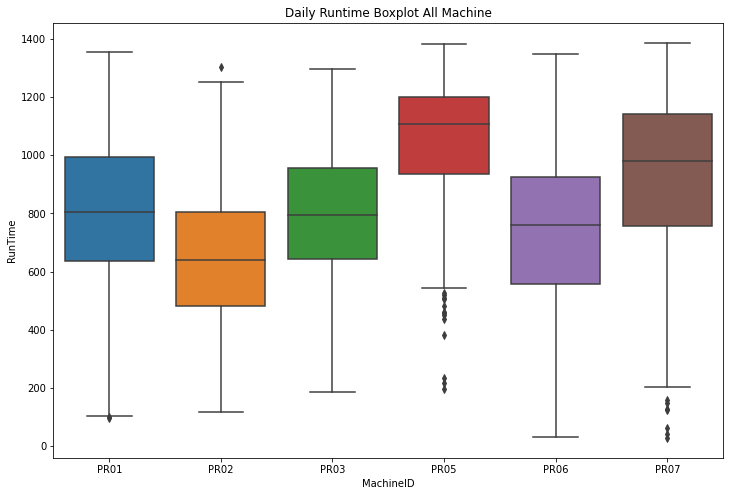

In [57]:
pd.reset_option("display.max_rows")
# plot daily runtime boxplot per machine
box_run = run.pivot_table(values='RunTime', index=['Date','MachineID'], fill_value=0, aggfunc=np.sum).reset_index()

plt.figure(figsize=(12,8))
sns.boxplot(x=box_run['MachineID'], y=box_run['RunTime'], data=box_run, orient="v")
plt.title('Daily Runtime Boxplot All Machine')
plt.show()

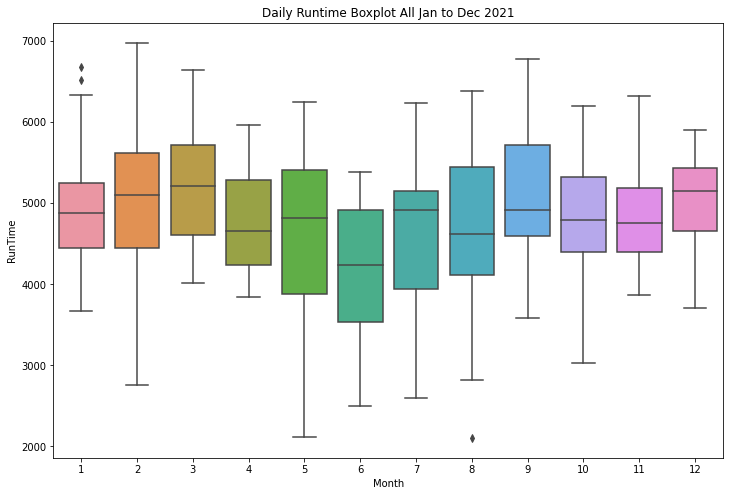

In [58]:
# plot daily runtime boxplot per Jan to Dec 2021
box_run = run.pivot_table(values='RunTime', index=['Date','Month'], fill_value=0, aggfunc=np.sum).reset_index()

plt.figure(figsize=(12,8))
sns.boxplot(x=box_run['Month'], y=box_run['RunTime'], data=box_run, orient="v")
plt.title('Daily Runtime Boxplot All Jan to Dec 2021')
plt.show()

### **Distribution**

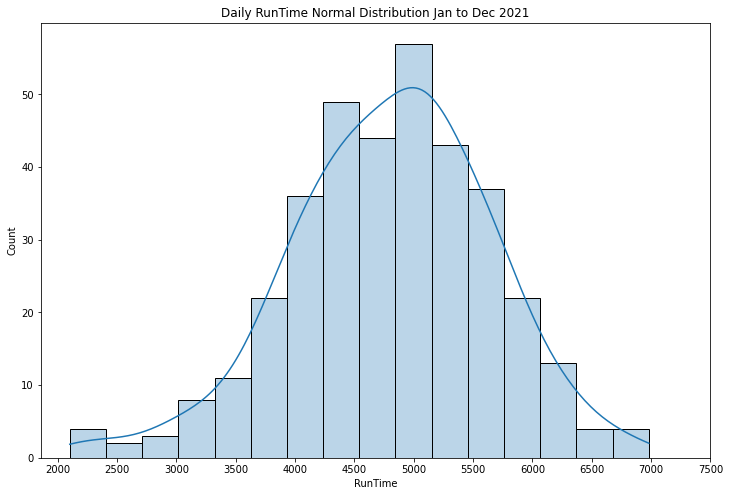

In [59]:
# plot daily RunTime distribution
dist_run = run.pivot_table(values='RunTime', index='Date', fill_value=0, aggfunc=np.sum)

fig, ax = plt.subplots(figsize=(12,8))
sns.histplot(dist_run['RunTime'], ax = ax,kde=True,alpha=0.3)
ax.set_title('Daily RunTime Normal Distribution Jan to Dec 2021')
ax.set_xticks([2000,2500,3000,3500,4000,4500,5000,5500,6000,6500,7000,7500])
plt.show()

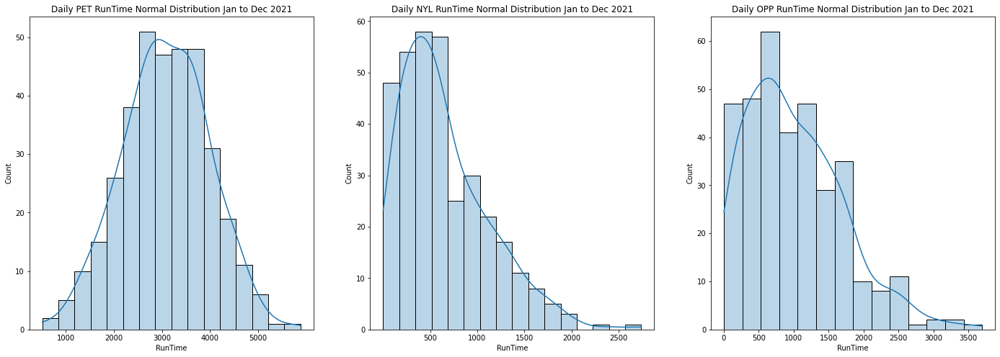

In [261]:
# plotting Speed normal dist per material
dist_pet = run[run['FILM']=='PET'].pivot_table(values='RunTime', index='Date', fill_value=0, aggfunc=np.sum)
dist_nyl = run[run['FILM']=='NYL'].pivot_table(values='RunTime', index='Date', fill_value=0, aggfunc=np.sum)
dist_opp = run[run['FILM']=='OPP'].pivot_table(values='RunTime', index='Date', fill_value=0, aggfunc=np.sum)

f, axarr = plt.subplots(nrows=1,ncols=3,figsize=(24, 8))
# plot material PET
sns.histplot(dist_pet['RunTime'], ax = axarr[0],kde=True,alpha=0.3)
axarr[0].set_title('Daily PET RunTime Normal Distribution Jan to Dec 2021')
axarr[0].set_xticks(np.arange(start=1000,stop=6000,step=1000))

# plot material NYL
sns.histplot(dist_nyl['RunTime'], ax = axarr[1],kde=True,alpha=0.3)
axarr[1].set_title('Daily NYL RunTime Normal Distribution Jan to Dec 2021')
axarr[1].set_xticks([500,1000,1500,2000,2500])

# plot material OPP
sns.histplot(dist_opp['RunTime'], ax = axarr[2],kde=True,alpha=0.3)
axarr[2].set_title('Daily OPP RunTime Normal Distribution Jan to Dec 2021')
axarr[2].set_xticks([0,500,1000,1500,2000,2500,3000,3500])

plt.show()

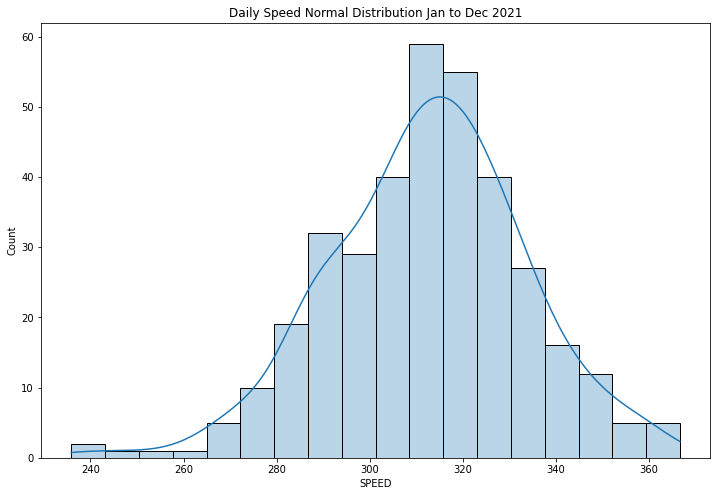

In [61]:
# plot daily speed distribution
dist_run = run.pivot_table(values='SPEED', index='Date', fill_value=0, aggfunc=np.mean)

fig, ax = plt.subplots(figsize=(12,8))
sns.histplot(dist_run['SPEED'], ax = ax,kde=True,alpha=0.3)
ax.set_title('Daily Speed Normal Distribution Jan to Dec 2021')
plt.show()

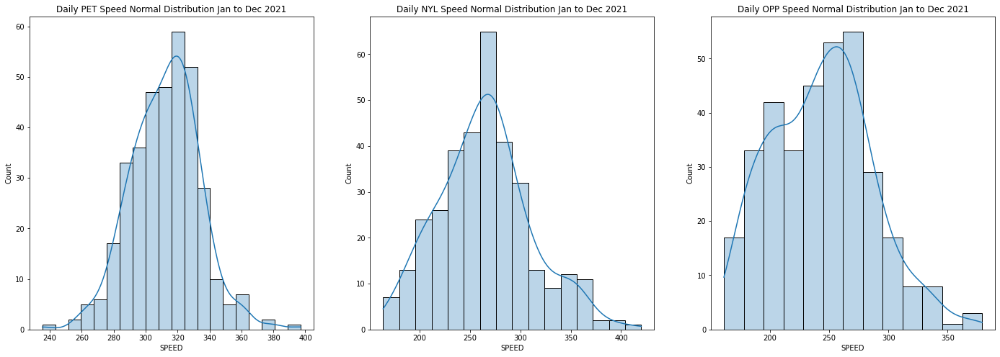

In [62]:
# plotting Speed normal dist per material
dist_pet = op[op['FILM']=='PET'].pivot_table(values='SPEED', index='Date', fill_value=0, aggfunc=np.mean)
dist_nyl = op[op['FILM']=='NYL'].pivot_table(values='SPEED', index='Date', fill_value=0, aggfunc=np.mean)
dist_opp = op[op['FILM']=='OPP'].pivot_table(values='SPEED', index='Date', fill_value=0, aggfunc=np.mean)

f, axarr = plt.subplots(nrows=1,ncols=3,figsize=(24, 8))
# plot material PET
sns.histplot(dist_pet['SPEED'], ax = axarr[0],kde=True,alpha=0.3)
axarr[0].set_title('Daily PET Speed Normal Distribution Jan to Dec 2021')

# plot material NYL
sns.histplot(dist_nyl['SPEED'], ax = axarr[1],kde=True,alpha=0.3)
axarr[1].set_title('Daily NYL Speed Normal Distribution Jan to Dec 2021')

# plot material OPP
sns.histplot(dist_opp['SPEED'], ax = axarr[2],kde=True,alpha=0.3)
axarr[2].set_title('Daily OPP Speed Normal Distribution Jan to Dec 2021')

plt.show()

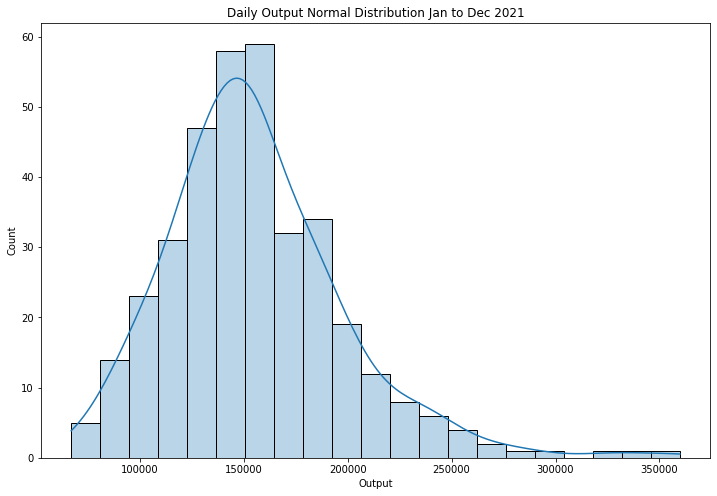

In [63]:
# plot daily output distribution
dist_op = op.pivot_table(values='Output', index='Date', fill_value=0, aggfunc=np.mean)

fig, ax = plt.subplots(figsize=(12,8))
sns.histplot(dist_op['Output'], ax = ax,kde=True,alpha=0.3)
ax.set_title('Daily Output Normal Distribution Jan to Dec 2021')
ax.set_xlabel('Output')
plt.show()

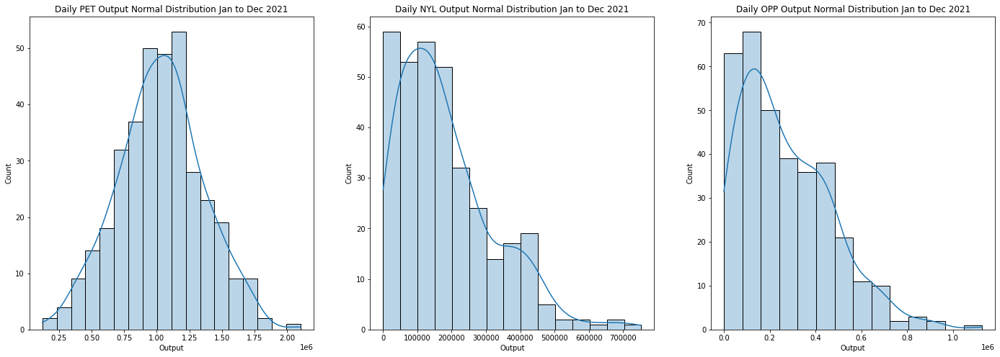

In [64]:
# plotting output normal dist per material
dist_pet = op[op['FILM']=='PET'].pivot_table(values='Output', index='Date', fill_value=0, aggfunc=np.sum)
dist_nyl = op[op['FILM']=='NYL'].pivot_table(values='Output', index='Date', fill_value=0, aggfunc=np.sum)
dist_opp = op[op['FILM']=='OPP'].pivot_table(values='Output', index='Date', fill_value=0, aggfunc=np.sum)

f, axarr = plt.subplots(nrows=1,ncols=3,figsize=(24, 8))
# plot material PET
sns.histplot(dist_pet['Output'], ax = axarr[0],kde=True,alpha=0.3)
axarr[0].set_title('Daily PET Output Normal Distribution Jan to Dec 2021')

# plot material NYL
sns.histplot(dist_nyl['Output'], ax = axarr[1],kde=True,alpha=0.3)
axarr[1].set_title('Daily NYL Output Normal Distribution Jan to Dec 2021')

# plot material OPP
sns.histplot(dist_opp['Output'], ax = axarr[2],kde=True,alpha=0.3)
axarr[2].set_title('Daily OPP Output Normal Distribution Jan to Dec 2021')

plt.show()

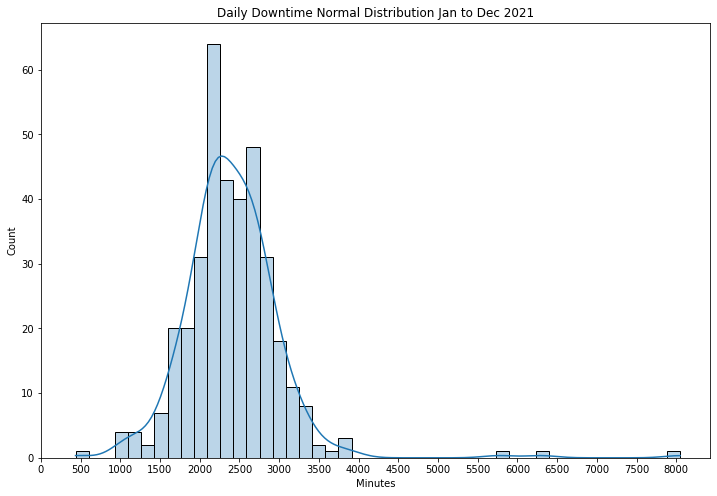

In [65]:
# plot daily Downtime distribution
dist_down = down.pivot_table(values='Downtime', index='Date', fill_value=0, aggfunc=np.sum)

fig, ax = plt.subplots(figsize=(12,8))
sns.histplot(dist_down['Downtime'], ax = ax,kde=True,alpha=0.3)
ax.set_title('Daily Downtime Normal Distribution Jan to Dec 2021')
ax.set_xlabel('Minutes')
ax.set_xticks([0,500,1000,1500,2000,2500,3000,3500,4000,4500,5000,5500,6000,6500,7000,7500,8000])
plt.show()

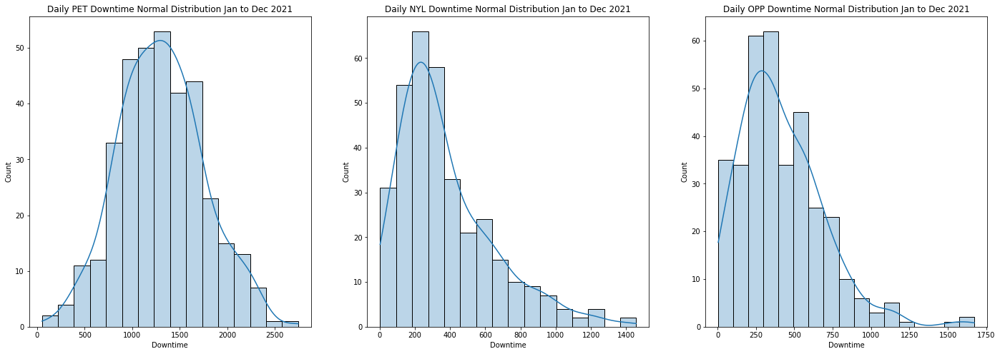

In [66]:
# plotting Downtime normal dist per material
dist_pet = down[down['FILM']=='PET'].pivot_table(values='Downtime', index='Date', fill_value=0, aggfunc=np.sum)
dist_nyl = down[down['FILM']=='NYL'].pivot_table(values='Downtime', index='Date', fill_value=0, aggfunc=np.sum)
dist_opp = down[down['FILM']=='OPP'].pivot_table(values='Downtime', index='Date', fill_value=0, aggfunc=np.sum)

f, axarr = plt.subplots(nrows=1,ncols=3,figsize=(24, 8))
# plot material PET
sns.histplot(dist_pet['Downtime'], ax = axarr[0],kde=True,alpha=0.3)
axarr[0].set_title('Daily PET Downtime Normal Distribution Jan to Dec 2021')

# plot material NYL
sns.histplot(dist_nyl['Downtime'], ax = axarr[1],kde=True,alpha=0.3)
axarr[1].set_title('Daily NYL Downtime Normal Distribution Jan to Dec 2021')

# plot material OPP
sns.histplot(dist_opp['Downtime'], ax = axarr[2],kde=True,alpha=0.3)
axarr[2].set_title('Daily OPP Downtime Normal Distribution Jan to Dec 2021')

plt.show()

## **2. Runtime, Speed and TCL by Material**

### **Per Machine**

In [67]:
# data material PET
mc_pet = run[run['FILM']=='PET'].pivot_table(values=['SPEED','TCL'],index='MachineID').reset_index()
mc_pet['SPEED'] = np.ceil(mc_pet['SPEED']).astype(int)
mc_pet['TCL'] = np.ceil(mc_pet['TCL']).astype(int)

mc_pet['RunTime'] = run[run['FILM']=='PET'].pivot_table(values='RunTime',index='MachineID',aggfunc='sum').reset_index().drop(columns=['MachineID'])
mc_pet['Output'] = mc_pet['SPEED'] * mc_pet['RunTime']

# data material NYL
mc_nyl = run[(run['FILM']=='NYL')].pivot_table(values=['SPEED','TCL'],index='MachineID').reset_index()
mc_nyl['SPEED'] = np.ceil(mc_nyl['SPEED']).astype(int) #round-up to whole number
mc_nyl['TCL'] = np.ceil(mc_nyl['TCL']).astype(int)

mc_nyl['RunTime'] = run[run['FILM']=='NYL'].pivot_table(values='RunTime',index='MachineID',aggfunc='sum').reset_index().drop(columns=['MachineID'])
mc_nyl['Output'] = mc_nyl['SPEED'] * mc_nyl['RunTime']

# material OPP
mc_opp = run[(run['FILM']=='OPP')].pivot_table(values=['SPEED','TCL'],index='MachineID').reset_index()
mc_opp['SPEED'] = np.ceil(mc_opp['SPEED']).astype(int)
mc_opp['TCL'] = np.ceil(mc_opp['TCL']).astype(int)

mc_opp['RunTime'] = run[run['FILM']=='OPP'].pivot_table(values='RunTime',index='MachineID',aggfunc='sum').reset_index().drop(columns=['MachineID'])
mc_opp['Output'] = mc_opp['SPEED'] * mc_opp['RunTime']

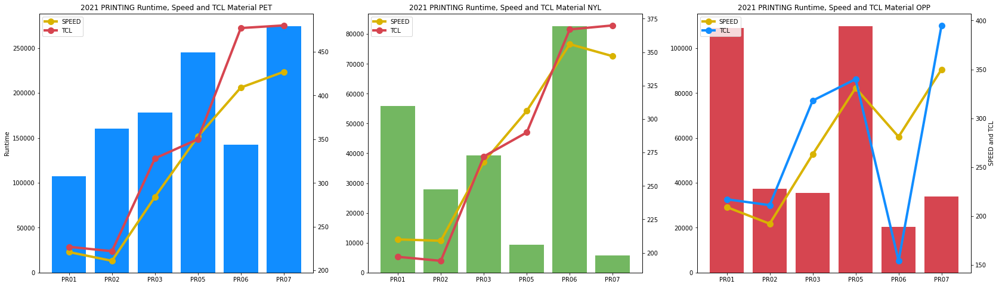

In [68]:
# plotting RunTime, TCL, and Speed per material
f, axarr = plt.subplots(nrows=1,ncols=3,figsize=(28, 8))

# plot material PET
plt.sca(axarr[0]);
plt.bar(mc_pet['MachineID'],mc_pet['RunTime'], color='#118dff')
plt.ylabel('Runtime')

ax2 = axarr[0].twinx()
line1, = ax2.plot(mc_pet['MachineID'],mc_pet['SPEED'],color= "#d9b300",linewidth=4, marker='o', markersize=10, label='SPEED')
line2, = ax2.plot(mc_pet['MachineID'],mc_pet['TCL'],color= "#d64550",linewidth=4, marker='o', markersize=10, label='TCL')
ax2.legend()
plt.title('2021 PRINTING Runtime, Speed and TCL Material PET')

# plot material NYL
plt.sca(axarr[1]);
plt.bar(mc_nyl['MachineID'],mc_nyl['RunTime'],color='#73b761')

ax2 = axarr[1].twinx()
line1, = ax2.plot(mc_nyl['MachineID'],mc_nyl['SPEED'],color= "#d9b300",linewidth=4, marker='o', markersize=10, label='SPEED')
line2, = ax2.plot(mc_nyl['MachineID'],mc_nyl['TCL'],color= "#d64550",linewidth=4, marker='o', markersize=10, label='TCL')
ax2.legend()

plt.title('2021 PRINTING Runtime, Speed and TCL Material NYL')

# plot material OPP
plt.sca(axarr[2]);
plt.bar(mc_opp['MachineID'],mc_opp['RunTime'],color='#d64550')

ax2 = axarr[2].twinx()
line1, = ax2.plot(mc_opp['MachineID'],mc_opp['SPEED'],color= "#d9b300",linewidth=4, marker='o', markersize=10, label='SPEED')
line2, = ax2.plot(mc_opp['MachineID'],mc_opp['TCL'],color= "#118dff",linewidth=4, marker='o', markersize=10, label='TCL')
ax2.set_ylabel('SPEED and TCL')
ax2.legend()

plt.title('2021 PRINTING Runtime, Speed and TCL Material OPP')
plt.show()

### **Monthly**

In [69]:
# data material PET
month_pet = run[run['FILM']=='PET'].pivot_table(values=['SPEED','TCL'],index='Month').reset_index()
month_pet['SPEED'] = np.ceil(month_pet['SPEED']).astype(int)
month_pet['TCL'] = np.ceil(month_pet['TCL']).astype(int)
month_pet['RunTime'] = run[run['FILM']=='PET'].pivot_table(values='RunTime',index='Month',aggfunc='sum').reset_index().drop(columns=['Month'])

# data material NYL
month_nyl = run[(run['FILM']=='NYL')].pivot_table(values=['SPEED','TCL'],index='Month').reset_index()
month_nyl['SPEED'] = np.ceil(month_nyl['SPEED']).astype(int) #round-up to whole number
month_nyl['TCL'] = np.ceil(month_nyl['TCL']).astype(int)
month_nyl['RunTime'] = run[run['FILM']=='NYL'].pivot_table(values='RunTime',index='Month',aggfunc='sum').reset_index().drop(columns=['Month'])

# material OPP
month_opp = run[(run['FILM']=='OPP')].pivot_table(values=['SPEED','TCL'],index='Month').reset_index()
month_opp['SPEED'] = np.ceil(month_opp['SPEED']).astype(int)
month_opp['TCL'] = np.ceil(month_opp['TCL']).astype(int)
month_opp['RunTime'] = run[run['FILM']=='OPP'].pivot_table(values='RunTime',index='Month',aggfunc='sum').reset_index().drop(columns=['Month'])


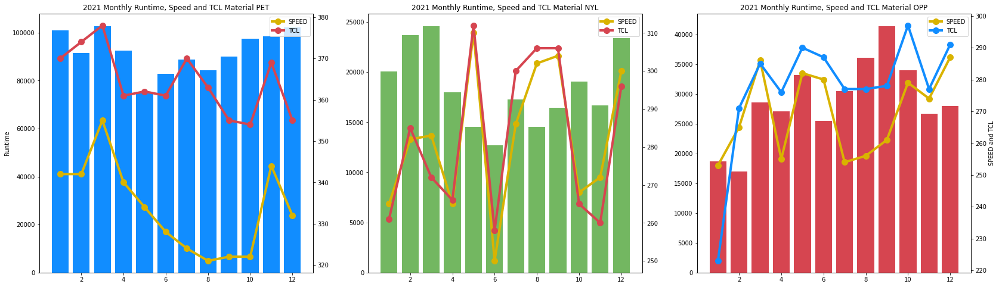

In [70]:
# plotting RunTime, TCL, and Speed per material
f, axarr = plt.subplots(nrows=1,ncols=3,figsize=(28, 8))

# plot material PET
plt.sca(axarr[0]);
plt.bar(month_pet['Month'],month_pet['RunTime'], color='#118dff')
plt.ylabel('Runtime')

ax2 = axarr[0].twinx()
line1, = ax2.plot(month_pet['Month'],month_pet['SPEED'],color= "#d9b300",linewidth=4, marker='o', markersize=10, label='SPEED')
line2, = ax2.plot(month_pet['Month'],month_pet['TCL'],color= "#d64550",linewidth=4, marker='o', markersize=10, label='TCL')
ax2.legend()
plt.title('2021 Monthly Runtime, Speed and TCL Material PET')

# plot material NYL
plt.sca(axarr[1]);
plt.bar(month_nyl['Month'],month_nyl['RunTime'],color='#73b761')

ax2 = axarr[1].twinx()
line1, = ax2.plot(month_nyl['Month'],month_nyl['SPEED'],color= "#d9b300",linewidth=4, marker='o', markersize=10, label='SPEED')
line2, = ax2.plot(month_nyl['Month'],month_nyl['TCL'],color= "#d64550",linewidth=4, marker='o', markersize=10, label='TCL')
ax2.legend()

plt.title('2021 Monthly Runtime, Speed and TCL Material NYL')

# plot material OPP
plt.sca(axarr[2]);
plt.bar(month_opp['Month'],month_opp['RunTime'],color='#d64550')

ax2 = axarr[2].twinx()
line1, = ax2.plot(month_opp['Month'],month_opp['SPEED'],color= "#d9b300",linewidth=4, marker='o', markersize=10, label='SPEED')
line2, = ax2.plot(month_opp['Month'],month_opp['TCL'],color= "#118dff",linewidth=4, marker='o', markersize=10, label='TCL')
ax2.set_ylabel('SPEED and TCL')
ax2.legend()

plt.title('2021 Monthly Runtime, Speed and TCL Material OPP')

plt.show()

### **Monthly for PR01**

In [71]:
# data material PET PR01
month_pet = run[(run['FILM']=='PET')&(run['MachineID']=='PR01')].pivot_table(values=['SPEED','TCL'],index='Month').reset_index()
month_pet['SPEED'] = np.ceil(month_pet['SPEED']).astype(int)
month_pet['TCL'] = np.ceil(month_pet['TCL']).astype(int)
month_pet['RunTime'] = run[(run['FILM']=='PET')&(run['MachineID']=='PR01')].pivot_table(values='RunTime',index='Month',aggfunc='sum').reset_index().drop(columns=['Month'])

# data material NYL PR01
month_nyl = run[(run['FILM']=='NYL')&(run['MachineID']=='PR01')].pivot_table(values=['SPEED','TCL'],index='Month').reset_index()
month_nyl['SPEED'] = np.ceil(month_nyl['SPEED']).astype(int) #round-up to whole number
month_nyl['TCL'] = np.ceil(month_nyl['TCL']).astype(int)
month_nyl['RunTime'] = run[(run['FILM']=='NYL')&(run['MachineID']=='PR01')].pivot_table(values='RunTime',index='Month',aggfunc='sum').reset_index().drop(columns=['Month'])

# material OPP PR01
month_opp = run[(run['FILM']=='OPP')&(run['MachineID']=='PR01')].pivot_table(values=['SPEED','TCL'],index='Month').reset_index()
month_opp['SPEED'] = np.ceil(month_opp['SPEED']).astype(int)
month_opp['TCL'] = np.ceil(month_opp['TCL']).astype(int)
month_opp['RunTime'] = run[(run['FILM']=='OPP')&(run['MachineID']=='PR01')].pivot_table(values='RunTime',index='Month',aggfunc='sum').reset_index().drop(columns=['Month'])

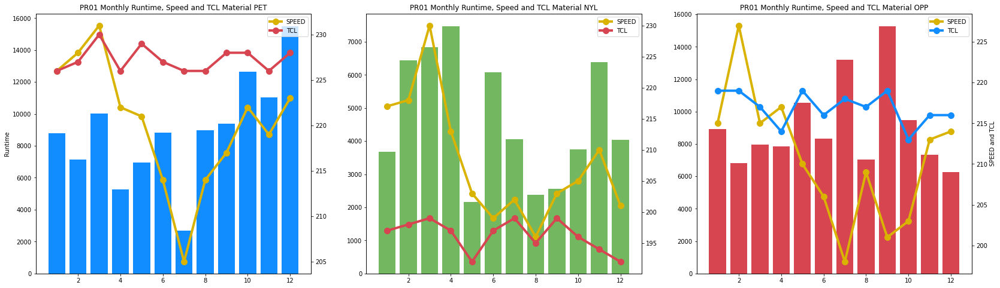

In [72]:
# plotting RunTime, TCL, and Speed per material
f, axarr = plt.subplots(nrows=1,ncols=3,figsize=(28, 8))

# plot material PET
plt.sca(axarr[0]);
plt.bar(month_pet['Month'],month_pet['RunTime'], color='#118dff')
plt.ylabel('Runtime')

ax2 = axarr[0].twinx()
line1, = ax2.plot(month_pet['Month'],month_pet['SPEED'],color= "#d9b300",linewidth=4, marker='o', markersize=10, label='SPEED')
line2, = ax2.plot(month_pet['Month'],month_pet['TCL'],color= "#d64550",linewidth=4, marker='o', markersize=10, label='TCL')
ax2.legend()
plt.title('PR01 Monthly Runtime, Speed and TCL Material PET')

# plot material NYL
plt.sca(axarr[1]);
plt.bar(month_nyl['Month'],month_nyl['RunTime'],color='#73b761')

ax2 = axarr[1].twinx()
line1, = ax2.plot(month_nyl['Month'],month_nyl['SPEED'],color= "#d9b300",linewidth=4, marker='o', markersize=10, label='SPEED')
line2, = ax2.plot(month_nyl['Month'],month_nyl['TCL'],color= "#d64550",linewidth=4, marker='o', markersize=10, label='TCL')
ax2.legend()

plt.title('PR01 Monthly Runtime, Speed and TCL Material NYL')

# plot material OPP
plt.sca(axarr[2]);
plt.bar(month_opp['Month'],month_opp['RunTime'],color='#d64550')

ax2 = axarr[2].twinx()
line1, = ax2.plot(month_opp['Month'],month_opp['SPEED'],color= "#d9b300",linewidth=4, marker='o', markersize=10, label='SPEED')
line2, = ax2.plot(month_opp['Month'],month_opp['TCL'],color= "#118dff",linewidth=4, marker='o', markersize=10, label='TCL')
ax2.set_ylabel('SPEED and TCL')
ax2.legend()

plt.title('PR01 Monthly Runtime, Speed and TCL Material OPP')

plt.show()

### **Monthly for PR02**

In [73]:
# data material PET PR02
month_pet = run[(run['FILM']=='PET')&(run['MachineID']=='PR02')].pivot_table(values=['SPEED','TCL'],index='Month').reset_index()
month_pet['SPEED'] = np.ceil(month_pet['SPEED']).astype(int)
month_pet['TCL'] = np.ceil(month_pet['TCL']).astype(int)
month_pet['RunTime'] = run[(run['FILM']=='PET')&(run['MachineID']=='PR02')].pivot_table(values='RunTime',index='Month',aggfunc='sum').reset_index().drop(columns=['Month'])

# data material NYL PR02
month_nyl = run[(run['FILM']=='NYL')&(run['MachineID']=='PR02')].pivot_table(values=['SPEED','TCL'],index='Month').reset_index()
month_nyl['SPEED'] = np.ceil(month_nyl['SPEED']).astype(int) #round-up to whole number
month_nyl['TCL'] = np.ceil(month_nyl['TCL']).astype(int)
month_nyl['RunTime'] = run[(run['FILM']=='NYL')&(run['MachineID']=='PR02')].pivot_table(values='RunTime',index='Month',aggfunc='sum').reset_index().drop(columns=['Month'])

# material OPP PR02
month_opp = run[(run['FILM']=='OPP')&(run['MachineID']=='PR02')].pivot_table(values=['SPEED','TCL'],index='Month').reset_index()
month_opp['SPEED'] = np.ceil(month_opp['SPEED']).astype(int)
month_opp['TCL'] = np.ceil(month_opp['TCL']).astype(int)
month_opp['RunTime'] = run[(run['FILM']=='OPP')&(run['MachineID']=='PR02')].pivot_table(values='RunTime',index='Month',aggfunc='sum').reset_index().drop(columns=['Month'])

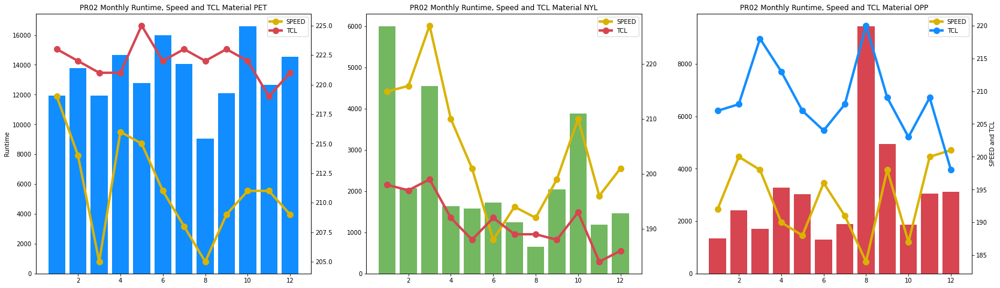

In [74]:
# plotting RunTime, TCL, and Speed per material
f, axarr = plt.subplots(nrows=1,ncols=3,figsize=(28, 8))

# plot material PET
plt.sca(axarr[0]);
plt.bar(month_pet['Month'],month_pet['RunTime'], color='#118dff')
plt.ylabel('Runtime')

ax2 = axarr[0].twinx()
line1, = ax2.plot(month_pet['Month'],month_pet['SPEED'],color= "#d9b300",linewidth=4, marker='o', markersize=10, label='SPEED')
line2, = ax2.plot(month_pet['Month'],month_pet['TCL'],color= "#d64550",linewidth=4, marker='o', markersize=10, label='TCL')
ax2.legend()
plt.title('PR02 Monthly Runtime, Speed and TCL Material PET')

# plot material NYL
plt.sca(axarr[1]);
plt.bar(month_nyl['Month'],month_nyl['RunTime'],color='#73b761')

ax2 = axarr[1].twinx()
line1, = ax2.plot(month_nyl['Month'],month_nyl['SPEED'],color= "#d9b300",linewidth=4, marker='o', markersize=10, label='SPEED')
line2, = ax2.plot(month_nyl['Month'],month_nyl['TCL'],color= "#d64550",linewidth=4, marker='o', markersize=10, label='TCL')
ax2.legend()

plt.title('PR02 Monthly Runtime, Speed and TCL Material NYL')

# plot material OPP
plt.sca(axarr[2]);
plt.bar(month_opp['Month'],month_opp['RunTime'],color='#d64550')

ax2 = axarr[2].twinx()
line1, = ax2.plot(month_opp['Month'],month_opp['SPEED'],color= "#d9b300",linewidth=4, marker='o', markersize=10, label='SPEED')
line2, = ax2.plot(month_opp['Month'],month_opp['TCL'],color= "#118dff",linewidth=4, marker='o', markersize=10, label='TCL')
ax2.set_ylabel('SPEED and TCL')
ax2.legend()

plt.title('PR02 Monthly Runtime, Speed and TCL Material OPP')

plt.show()

### **Monthly for PR03**

In [75]:
# data material PET PR03
month_pet = run[(run['FILM']=='PET')&(run['MachineID']=='PR03')].pivot_table(values=['SPEED','TCL'],index='Month').reset_index()
month_pet['SPEED'] = np.ceil(month_pet['SPEED']).astype(int)
month_pet['TCL'] = np.ceil(month_pet['TCL']).astype(int)
month_pet['RunTime'] = run[(run['FILM']=='PET')&(run['MachineID']=='PR03')].pivot_table(values='RunTime',index='Month',aggfunc='sum').reset_index().drop(columns=['Month'])

# data material NYL PR03
month_nyl = run[(run['FILM']=='NYL')&(run['MachineID']=='PR03')].pivot_table(values=['SPEED','TCL'],index='Month').reset_index()
month_nyl['SPEED'] = np.ceil(month_nyl['SPEED']).astype(int) #round-up to whole number
month_nyl['TCL'] = np.ceil(month_nyl['TCL']).astype(int)
month_nyl['RunTime'] = run[(run['FILM']=='NYL')&(run['MachineID']=='PR03')].pivot_table(values='RunTime',index='Month',aggfunc='sum').reset_index().drop(columns=['Month'])

# material OPP PR03
month_opp = run[(run['FILM']=='OPP')&(run['MachineID']=='PR03')].pivot_table(values=['SPEED','TCL'],index='Month').reset_index()
month_opp['SPEED'] = np.ceil(month_opp['SPEED']).astype(int)
month_opp['TCL'] = np.ceil(month_opp['TCL']).astype(int)
month_opp['RunTime'] = run[(run['FILM']=='OPP')&(run['MachineID']=='PR03')].pivot_table(values='RunTime',index='Month',aggfunc='sum').reset_index().drop(columns=['Month'])

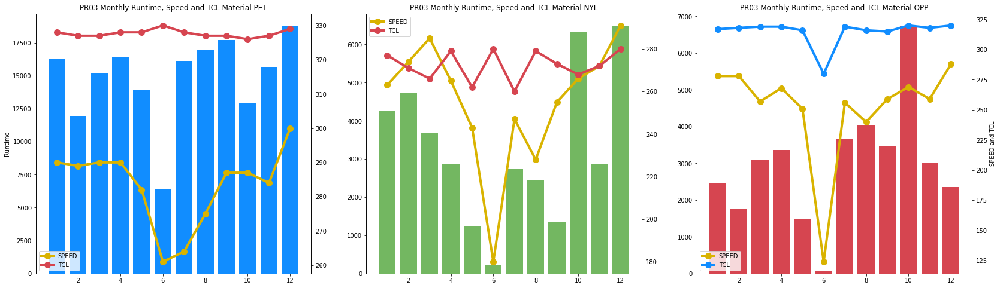

In [76]:
# plotting RunTime, TCL, and Speed per material
f, axarr = plt.subplots(nrows=1,ncols=3,figsize=(28, 8))

# plot material PET
plt.sca(axarr[0]);
plt.bar(month_pet['Month'],month_pet['RunTime'], color='#118dff')
plt.ylabel('Runtime')

ax2 = axarr[0].twinx()
line1, = ax2.plot(month_pet['Month'],month_pet['SPEED'],color= "#d9b300",linewidth=4, marker='o', markersize=10, label='SPEED')
line2, = ax2.plot(month_pet['Month'],month_pet['TCL'],color= "#d64550",linewidth=4, marker='o', markersize=10, label='TCL')
ax2.legend()
plt.title('PR03 Monthly Runtime, Speed and TCL Material PET')

# plot material NYL
plt.sca(axarr[1]);
plt.bar(month_nyl['Month'],month_nyl['RunTime'],color='#73b761')

ax2 = axarr[1].twinx()
line1, = ax2.plot(month_nyl['Month'],month_nyl['SPEED'],color= "#d9b300",linewidth=4, marker='o', markersize=10, label='SPEED')
line2, = ax2.plot(month_nyl['Month'],month_nyl['TCL'],color= "#d64550",linewidth=4, marker='o', markersize=10, label='TCL')
ax2.legend()

plt.title('PR03 Monthly Runtime, Speed and TCL Material NYL')

# plot material OPP
plt.sca(axarr[2]);
plt.bar(month_opp['Month'],month_opp['RunTime'],color='#d64550')

ax2 = axarr[2].twinx()
line1, = ax2.plot(month_opp['Month'],month_opp['SPEED'],color= "#d9b300",linewidth=4, marker='o', markersize=10, label='SPEED')
line2, = ax2.plot(month_opp['Month'],month_opp['TCL'],color= "#118dff",linewidth=4, marker='o', markersize=10, label='TCL')
ax2.set_ylabel('SPEED and TCL')
ax2.legend()

plt.title('PR03 Monthly Runtime, Speed and TCL Material OPP')

plt.show()

### **Monthly for PR05**

In [77]:
# data material PET PR05
month_pet = run[(run['FILM']=='PET')&(run['MachineID']=='PR05')].pivot_table(values=['SPEED','TCL'],index='Month').reset_index()
month_pet['SPEED'] = np.ceil(month_pet['SPEED']).astype(int)
month_pet['TCL'] = np.ceil(month_pet['TCL']).astype(int)
month_pet['RunTime'] = run[(run['FILM']=='PET')&(run['MachineID']=='PR05')].pivot_table(values='RunTime',index='Month',aggfunc='sum').reset_index().drop(columns=['Month'])

# data material NYL PR05
month_nyl = run[(run['FILM']=='NYL')&(run['MachineID']=='PR05')].pivot_table(values=['SPEED','TCL'],index='Month').reset_index()
month_nyl['SPEED'] = np.ceil(month_nyl['SPEED']).astype(int) #round-up to whole number
month_nyl['TCL'] = np.ceil(month_nyl['TCL']).astype(int)
month_nyl['RunTime'] = run[(run['FILM']=='NYL')&(run['MachineID']=='PR05')].pivot_table(values='RunTime',index='Month',aggfunc='sum').reset_index().drop(columns=['Month'])

# material OPP PR05
month_opp = run[(run['FILM']=='OPP')&(run['MachineID']=='PR05')].pivot_table(values=['SPEED','TCL'],index='Month').reset_index()
month_opp['SPEED'] = np.ceil(month_opp['SPEED']).astype(int)
month_opp['TCL'] = np.ceil(month_opp['TCL']).astype(int)
month_opp['RunTime'] = run[(run['FILM']=='OPP')&(run['MachineID']=='PR05')].pivot_table(values='RunTime',index='Month',aggfunc='sum').reset_index().drop(columns=['Month'])

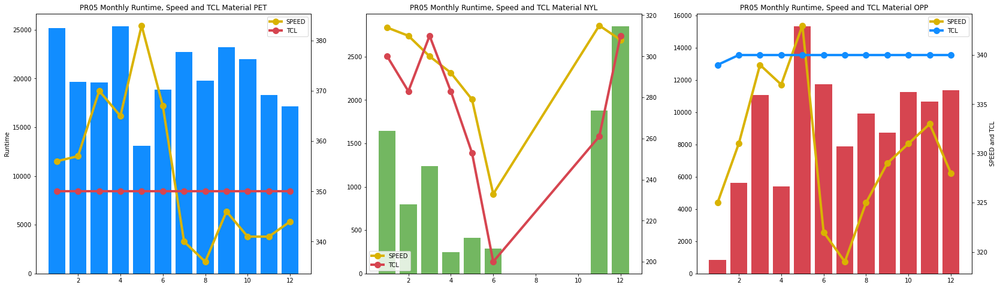

In [78]:
# plotting RunTime, TCL, and Speed per material
f, axarr = plt.subplots(nrows=1,ncols=3,figsize=(28, 8))

# plot material PET
plt.sca(axarr[0]);
plt.bar(month_pet['Month'],month_pet['RunTime'], color='#118dff')
plt.ylabel('Runtime')

ax2 = axarr[0].twinx()
line1, = ax2.plot(month_pet['Month'],month_pet['SPEED'],color= "#d9b300",linewidth=4, marker='o', markersize=10, label='SPEED')
line2, = ax2.plot(month_pet['Month'],month_pet['TCL'],color= "#d64550",linewidth=4, marker='o', markersize=10, label='TCL')
ax2.legend()
plt.title('PR05 Monthly Runtime, Speed and TCL Material PET')

# plot material NYL
plt.sca(axarr[1]);
plt.bar(month_nyl['Month'],month_nyl['RunTime'],color='#73b761')

ax2 = axarr[1].twinx()
line1, = ax2.plot(month_nyl['Month'],month_nyl['SPEED'],color= "#d9b300",linewidth=4, marker='o', markersize=10, label='SPEED')
line2, = ax2.plot(month_nyl['Month'],month_nyl['TCL'],color= "#d64550",linewidth=4, marker='o', markersize=10, label='TCL')
ax2.legend()

plt.title('PR05 Monthly Runtime, Speed and TCL Material NYL')

# plot material OPP
plt.sca(axarr[2]);
plt.bar(month_opp['Month'],month_opp['RunTime'],color='#d64550')

ax2 = axarr[2].twinx()
line1, = ax2.plot(month_opp['Month'],month_opp['SPEED'],color= "#d9b300",linewidth=4, marker='o', markersize=10, label='SPEED')
line2, = ax2.plot(month_opp['Month'],month_opp['TCL'],color= "#118dff",linewidth=4, marker='o', markersize=10, label='TCL')
ax2.set_ylabel('SPEED and TCL')
ax2.legend()

plt.title('PR05 Monthly Runtime, Speed and TCL Material OPP')

plt.show()

### **Monthly for PR06**

In [79]:
# data material PET PR06
month_pet = run[(run['FILM']=='PET')&(run['MachineID']=='PR06')].pivot_table(values=['SPEED','TCL'],index='Month').reset_index()
month_pet['SPEED'] = np.ceil(month_pet['SPEED']).astype(int)
month_pet['TCL'] = np.ceil(month_pet['TCL']).astype(int)
month_pet['RunTime'] = run[(run['FILM']=='PET')&(run['MachineID']=='PR06')].pivot_table(values='RunTime',index='Month',aggfunc='sum').reset_index().drop(columns=['Month'])

# data material NYL PR06
month_nyl = run[(run['FILM']=='NYL')&(run['MachineID']=='PR06')].pivot_table(values=['SPEED','TCL'],index='Month').reset_index()
month_nyl['SPEED'] = np.ceil(month_nyl['SPEED']).astype(int) #round-up to whole number
month_nyl['TCL'] = np.ceil(month_nyl['TCL']).astype(int)
month_nyl['RunTime'] = run[(run['FILM']=='NYL')&(run['MachineID']=='PR06')].pivot_table(values='RunTime',index='Month',aggfunc='sum').reset_index().drop(columns=['Month'])

# material OPP PR06
month_opp = run[(run['FILM']=='OPP')&(run['MachineID']=='PR06')].pivot_table(values=['SPEED','TCL'],index='Month').reset_index()
month_opp['SPEED'] = np.ceil(month_opp['SPEED']).astype(int)
month_opp['TCL'] = np.ceil(month_opp['TCL']).astype(int)
month_opp['RunTime'] = run[(run['FILM']=='OPP')&(run['MachineID']=='PR06')].pivot_table(values='RunTime',index='Month',aggfunc='sum').reset_index().drop(columns=['Month'])

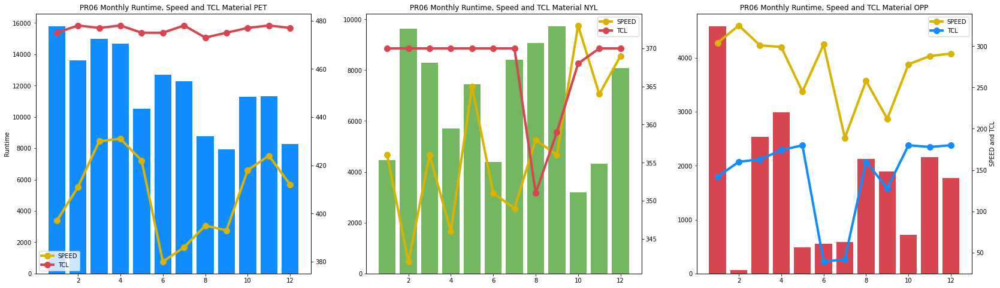

In [80]:
# plotting RunTime, TCL, and Speed per material
f, axarr = plt.subplots(nrows=1,ncols=3,figsize=(28, 8))

# plot material PET
plt.sca(axarr[0]);
plt.bar(month_pet['Month'],month_pet['RunTime'], color='#118dff')
plt.ylabel('Runtime')

ax2 = axarr[0].twinx()
line1, = ax2.plot(month_pet['Month'],month_pet['SPEED'],color= "#d9b300",linewidth=4, marker='o', markersize=10, label='SPEED')
line2, = ax2.plot(month_pet['Month'],month_pet['TCL'],color= "#d64550",linewidth=4, marker='o', markersize=10, label='TCL')
ax2.legend()
plt.title('PR06 Monthly Runtime, Speed and TCL Material PET')

# plot material NYL
plt.sca(axarr[1]);
plt.bar(month_nyl['Month'],month_nyl['RunTime'],color='#73b761')

ax2 = axarr[1].twinx()
line1, = ax2.plot(month_nyl['Month'],month_nyl['SPEED'],color= "#d9b300",linewidth=4, marker='o', markersize=10, label='SPEED')
line2, = ax2.plot(month_nyl['Month'],month_nyl['TCL'],color= "#d64550",linewidth=4, marker='o', markersize=10, label='TCL')
ax2.legend()

plt.title('PR06 Monthly Runtime, Speed and TCL Material NYL')

# plot material OPP
plt.sca(axarr[2]);
plt.bar(month_opp['Month'],month_opp['RunTime'],color='#d64550')

ax2 = axarr[2].twinx()
line1, = ax2.plot(month_opp['Month'],month_opp['SPEED'],color= "#d9b300",linewidth=4, marker='o', markersize=10, label='SPEED')
line2, = ax2.plot(month_opp['Month'],month_opp['TCL'],color= "#118dff",linewidth=4, marker='o', markersize=10, label='TCL')
ax2.set_ylabel('SPEED and TCL')
ax2.legend()

plt.title('PR06 Monthly Runtime, Speed and TCL Material OPP')

plt.show()

### **Monthly for PR07**

In [81]:
# data material PET PR07
month_pet = run[(run['FILM']=='PET')&(run['MachineID']=='PR07')].pivot_table(values=['SPEED','TCL'],index='Month').reset_index()
month_pet['SPEED'] = np.ceil(month_pet['SPEED']).astype(int)
month_pet['TCL'] = np.ceil(month_pet['TCL']).astype(int)
month_pet['RunTime'] = run[(run['FILM']=='PET')&(run['MachineID']=='PR07')].pivot_table(values='RunTime',index='Month',aggfunc='sum').reset_index().drop(columns=['Month'])

# data material NYL PR07
month_nyl = run[(run['FILM']=='NYL')&(run['MachineID']=='PR07')].pivot_table(values=['SPEED','TCL'],index='Month').reset_index()
month_nyl['SPEED'] = np.ceil(month_nyl['SPEED']).astype(int) #round-up to whole number
month_nyl['TCL'] = np.ceil(month_nyl['TCL']).astype(int)
month_nyl['RunTime'] = run[(run['FILM']=='NYL')&(run['MachineID']=='PR07')].pivot_table(values='RunTime',index='Month',aggfunc='sum').reset_index().drop(columns=['Month'])

# material OPP PR07
month_opp = run[(run['FILM']=='OPP')&(run['MachineID']=='PR07')].pivot_table(values=['SPEED','TCL'],index='Month').reset_index()
month_opp['SPEED'] = np.ceil(month_opp['SPEED']).astype(int)
month_opp['TCL'] = np.ceil(month_opp['TCL']).astype(int)
month_opp['RunTime'] = run[(run['FILM']=='OPP')&(run['MachineID']=='PR07')].pivot_table(values='RunTime',index='Month',aggfunc='sum').reset_index().drop(columns=['Month'])

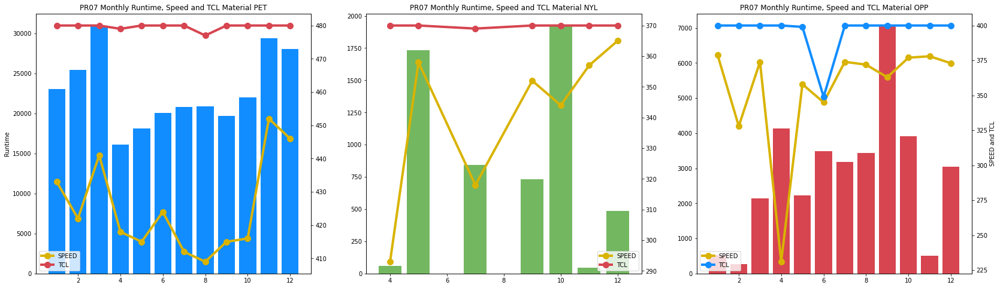

In [82]:
# plotting RunTime, TCL, and Speed per material
f, axarr = plt.subplots(nrows=1,ncols=3,figsize=(28, 8))

# plot material PET
plt.sca(axarr[0]);
plt.bar(month_pet['Month'],month_pet['RunTime'], color='#118dff')
plt.ylabel('Runtime')

ax2 = axarr[0].twinx()
line1, = ax2.plot(month_pet['Month'],month_pet['SPEED'],color= "#d9b300",linewidth=4, marker='o', markersize=10, label='SPEED')
line2, = ax2.plot(month_pet['Month'],month_pet['TCL'],color= "#d64550",linewidth=4, marker='o', markersize=10, label='TCL')
ax2.legend()
plt.title('PR07 Monthly Runtime, Speed and TCL Material PET')

# plot material NYL
plt.sca(axarr[1]);
plt.bar(month_nyl['Month'],month_nyl['RunTime'],color='#73b761')

ax2 = axarr[1].twinx()
line1, = ax2.plot(month_nyl['Month'],month_nyl['SPEED'],color= "#d9b300",linewidth=4, marker='o', markersize=10, label='SPEED')
line2, = ax2.plot(month_nyl['Month'],month_nyl['TCL'],color= "#d64550",linewidth=4, marker='o', markersize=10, label='TCL')
ax2.legend()

plt.title('PR07 Monthly Runtime, Speed and TCL Material NYL')

# plot material OPP
plt.sca(axarr[2]);
plt.bar(month_opp['Month'],month_opp['RunTime'],color='#d64550')

ax2 = axarr[2].twinx()
line1, = ax2.plot(month_opp['Month'],month_opp['SPEED'],color= "#d9b300",linewidth=4, marker='o', markersize=10, label='SPEED')
line2, = ax2.plot(month_opp['Month'],month_opp['TCL'],color= "#118dff",linewidth=4, marker='o', markersize=10, label='TCL')
ax2.set_ylabel('SPEED and TCL')
ax2.legend()

plt.title('PR07 Monthly Runtime, Speed and TCL Material OPP')

plt.show()

### **Line Plot**

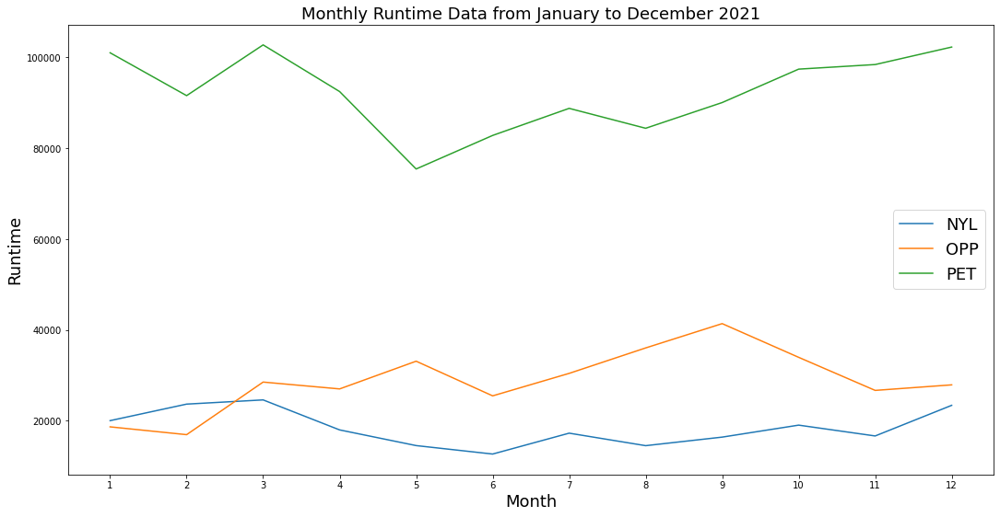

In [83]:
# plotting daily runtime per material
run_monthly.plot('Month',['NYL','OPP','PET'],figsize=(18 , 9)).legend(loc='best', fontsize=18)
plt.xlabel('Month', fontsize=18)
plt.ylabel('Runtime', fontsize=18)
plt.title('Monthly Runtime Data from January to December 2021', fontsize=18)
plt.xticks(run_monthly['Month'])
plt.show()

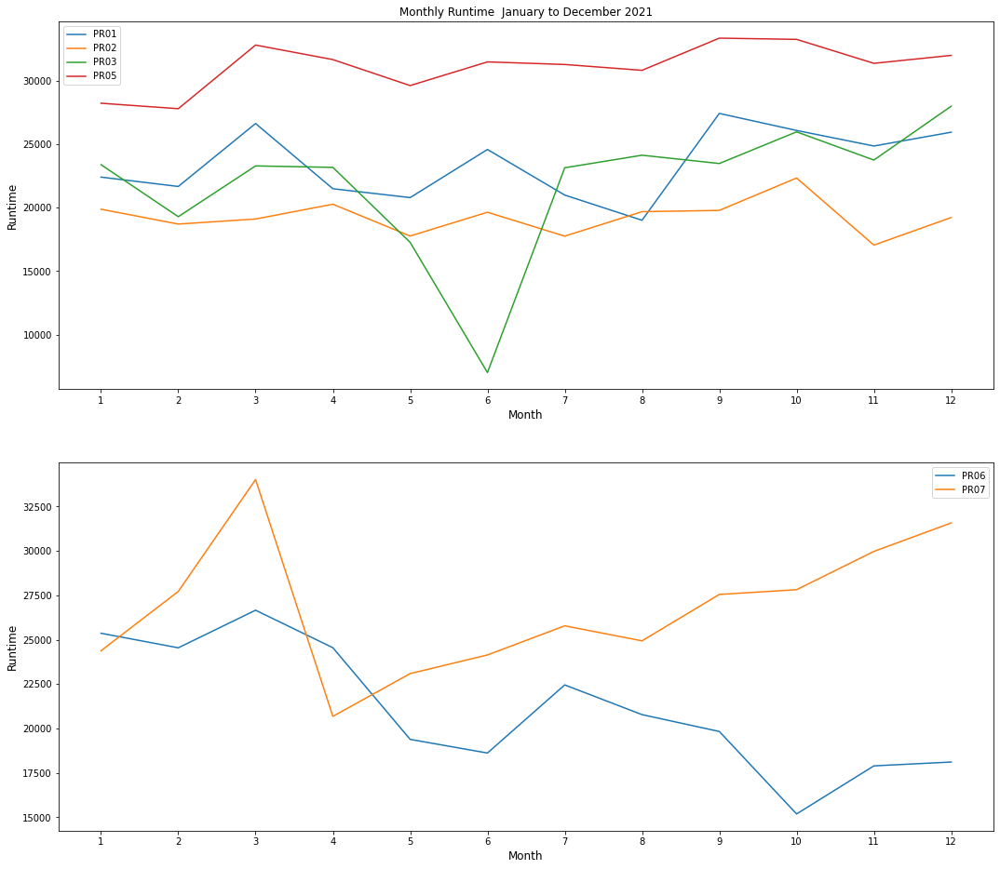

In [84]:
# plotting daily runtime by machine
f, ax = plt.subplots(nrows=2,ncols=1,figsize=(18, 16))
line1, = ax[0].plot(rmc_monthly['Month'],rmc_monthly['PR01'],label='PR01')
line2, = ax[0].plot(rmc_monthly['Month'],rmc_monthly['PR02'],label='PR02')
line3, = ax[0].plot(rmc_monthly['Month'],rmc_monthly['PR03'],label='PR03')
line5, = ax[0].plot(rmc_monthly['Month'],rmc_monthly['PR05'],label='PR05')
ax[0].legend()
ax[0].set_xlabel('Month', fontsize=12)
ax[0].set_ylabel('Runtime', fontsize=12)
ax[0].set_title('Monthly Runtime  January to December 2021', fontsize=12)
ax[0].set_xticks(rmc_monthly['Month'])

line1, = ax[1].plot(rmc_monthly['Month'],rmc_monthly['PR06'],label='PR06')
line2, = ax[1].plot(rmc_monthly['Month'],rmc_monthly['PR07'],label='PR07')
ax[1].legend()
ax[1].set_xlabel('Month', fontsize=12)
ax[1].set_ylabel('Runtime', fontsize=12)
ax[1].set_xticks(rmc_monthly['Month'])

plt.xticks(run_monthly['Month'])
plt.show()

## **3. Output by Material**

In [85]:
op_films = op.pivot_table(values='Output',index=['MachineID'],columns='FILM',aggfunc='sum').reset_index().rename_axis(None, axis=1)
op_films

,MachineID,NYL,OPP,PET
0,PR01,11708434,22751328,23649224
1,PR02,5849501,7165892,33734997
2,PR03,10472402,9320965,50622943
3,PR05,2854472,36324668,86307610
4,PR06,29403182,5745674,58042797
5,PR07,2015347,11852479,117163847


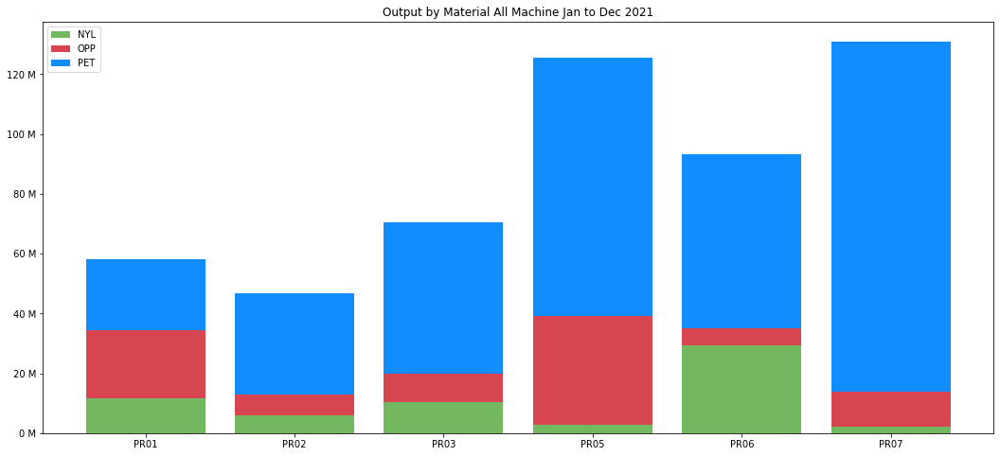

In [86]:
# function for y-axis format in millions
@ticker.FuncFormatter
def million_formatter(x, pos):
    return "%.0f M" % (x/1E6)
    
# plotting output per film per machine
fig, ax = plt.subplots(figsize=(18, 8))
ax.bar(op_films['MachineID'], op_films['NYL'], label='NYL',color='#73b761')
ax.bar(op_films['MachineID'], op_films['OPP'], bottom=op_films['NYL'],label='OPP',color='#d64550')
ax.bar(op_films['MachineID'], op_films['PET'], 
       bottom=op_films['NYL']+np.array(op_films['OPP']),
       label='PET',color='#118dff')
ax.set_title('Output by Material All Machine Jan to Dec 2021')
ax.yaxis.set_major_formatter(million_formatter)
ax.legend(loc='upper left')
plt.show()

In [87]:
# output monthly per film
op_order = op.pivot_table(values='Output',index=['Month'],columns='FILM',aggfunc='sum').reset_index().rename_axis(None, axis=1)
op_order

,Month,NYL,OPP,PET
0,1,5298713,4720936,34478341
1,2,6674555,4481929,31300781
2,3,6961345,8151621,36464758
3,4,4757218,6882030,31341649
4,5,4498995,9310180,25141487
5,6,3171401,7123534,27117096
6,7,4930688,7727839,28739074
7,8,4384153,9216896,27034522
8,9,4988521,10771712,28934791
9,10,5102614,9471173,31295588


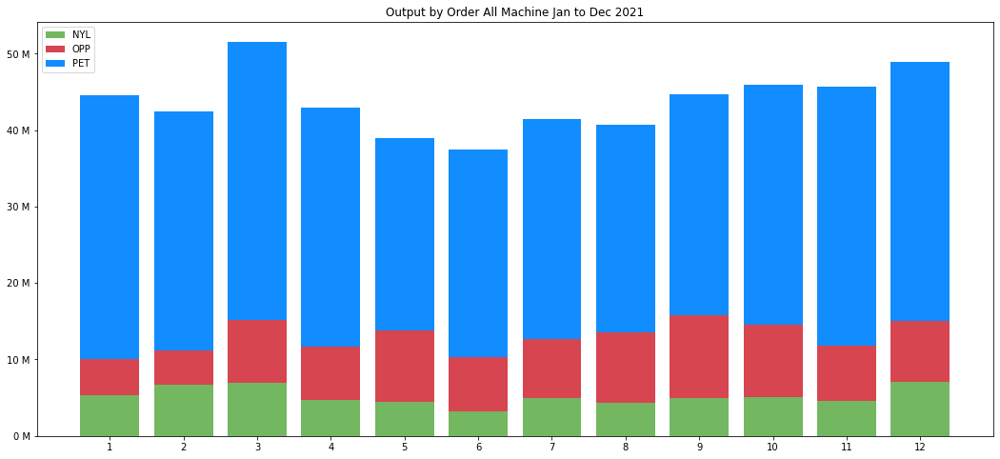

In [88]:
# plotting output per film per month
fig, ax = plt.subplots(figsize=(18, 8))
ax.bar(op_order['Month'], op_order['NYL'], label='NYL',color='#73b761')
ax.bar(op_order['Month'], op_order['OPP'], bottom=op_order['NYL'],label='OPP',color='#d64550')
ax.bar(op_order['Month'], op_order['PET'], bottom=op_order['NYL']+np.array(op_order['OPP']),
       label='PET',color='#118dff')
ax.set_title('Output by Order All Machine Jan to Dec 2021')
ax.yaxis.set_major_formatter(million_formatter)
ax.legend(loc='upper left')
ax.set_xticks(op_order['Month'])
plt.show()

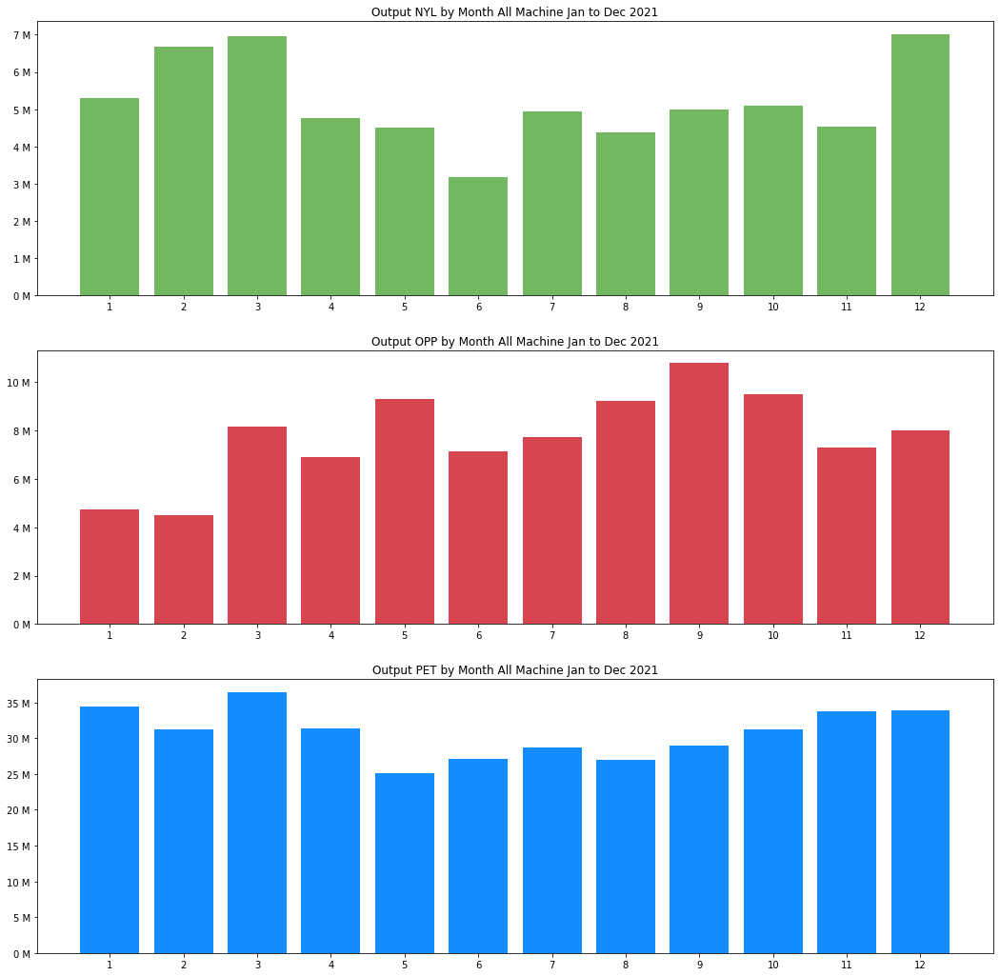

In [89]:
# plotting output nyl per month
fig, ax = plt.subplots(nrows=3,ncols=1,figsize=(18, 18))
ax[0].bar(op_order['Month'], op_order['NYL'], label='NYL',color='#73b761')
ax[0].set_title('Output NYL by Month All Machine Jan to Dec 2021')
ax[0].yaxis.set_major_formatter(million_formatter)
ax[0].set_xticks(op_order['Month'])

ax[1].bar(op_order['Month'], op_order['OPP'], label='OPP',color='#d64550')
ax[1].set_title('Output OPP by Month All Machine Jan to Dec 2021')
ax[1].yaxis.set_major_formatter(million_formatter)
ax[1].set_xticks(op_order['Month'])

ax[2].bar(op_order['Month'], op_order['PET'], label='PET',color='#118dff')
ax[2].set_title('Output PET by Month All Machine Jan to Dec 2021')
ax[2].yaxis.set_major_formatter(million_formatter)
ax[2].set_xticks(op_order['Month'])

plt.show()

## **4. Monthly Output by Material All Machine**

### **January**

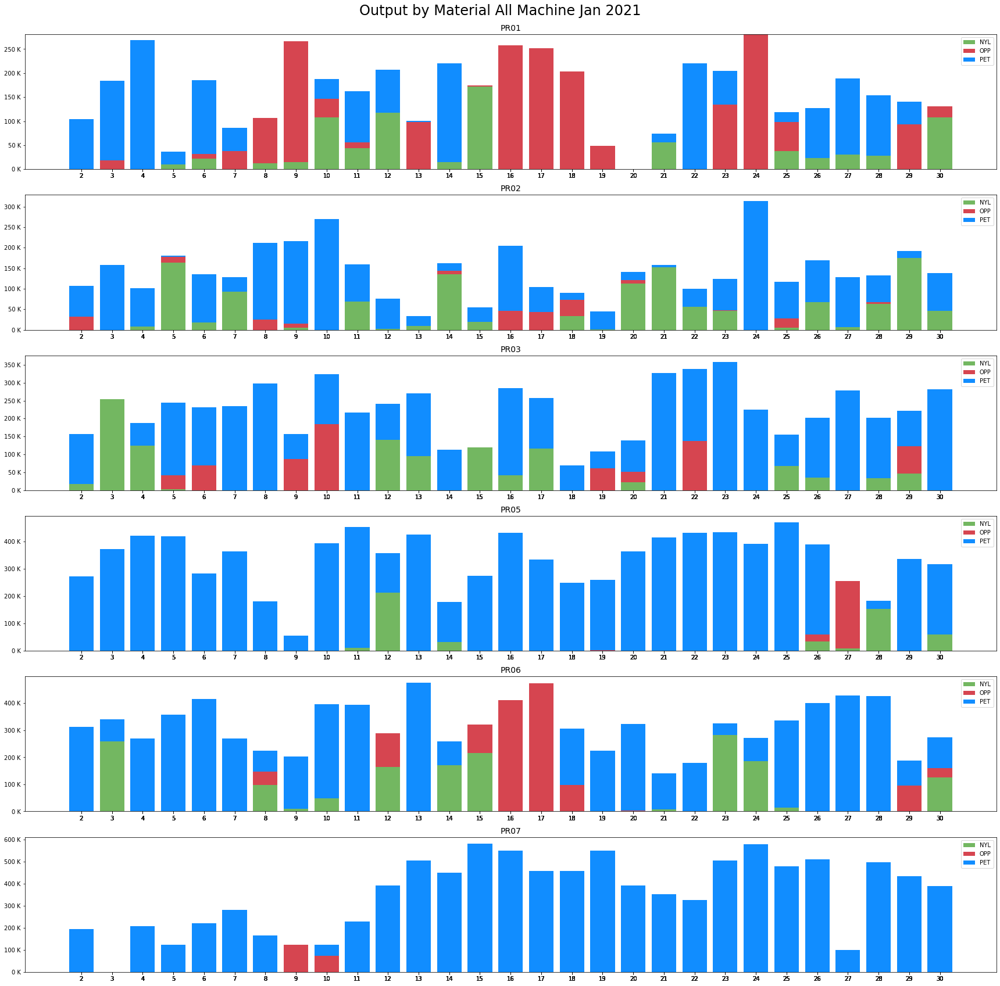

In [90]:
# function for y-axis format in thousands
@ticker.FuncFormatter
def thousand_formatter(x, pos):
    return "%.0f K" % (x/1E3)

op_month = op[op['Month']==1].pivot_table(values='Output',index=['Date','MachineID'],columns='FILM',aggfunc='sum',fill_value=0).reset_index().rename_axis(None, axis=1)
op_month['Date'] = op_month['Date'].dt.day

fig, ax = plt.subplots(nrows=6,ncols=1,figsize=(24, 24))
list = [1, 2, 3, 5,6,7]
length = len(list)
for i in range(length):
  ax[i].bar(op_month[op_month['MachineID']=='PR0'+str(list[i])]['Date'], op_month[op_month['MachineID']=='PR0'+str(list[i])]['NYL'], label='NYL',color='#73b761')
  ax[i].bar(op_month[op_month['MachineID']=='PR0'+str(list[i])]['Date'], op_month[op_month['MachineID']=='PR0'+str(list[i])]['OPP'], 
          bottom=op_month[op_month['MachineID']=='PR0'+str(list[i])]['NYL'],label='OPP',color='#d64550')
  ax[i].bar(op_month[op_month['MachineID']=='PR0'+str(list[i])]['Date'], op_month[op_month['MachineID']=='PR0'+str(list[i])]['PET'], 
          bottom=op_month[op_month['MachineID']=='PR0'+str(list[i])]['NYL']+np.array(op_month[op_month['MachineID']=='PR0'+str(list[i])]['OPP']),label='PET',color='#118dff')
  ax[i].yaxis.set_major_formatter(thousand_formatter)
  ax[i].set_xticks(op_month['Date'])
  ax[i].legend()
  ax[i].set_title('PR0'+str(list[i]),fontsize=14)

fig.suptitle('Output by Material All Machine Jan 2021',fontsize=24)
# Tight layout often produces nice results
# but requires the title to be spaced accordingly
fig.tight_layout()
fig.subplots_adjust(top=0.95)
plt.show()

### **February**

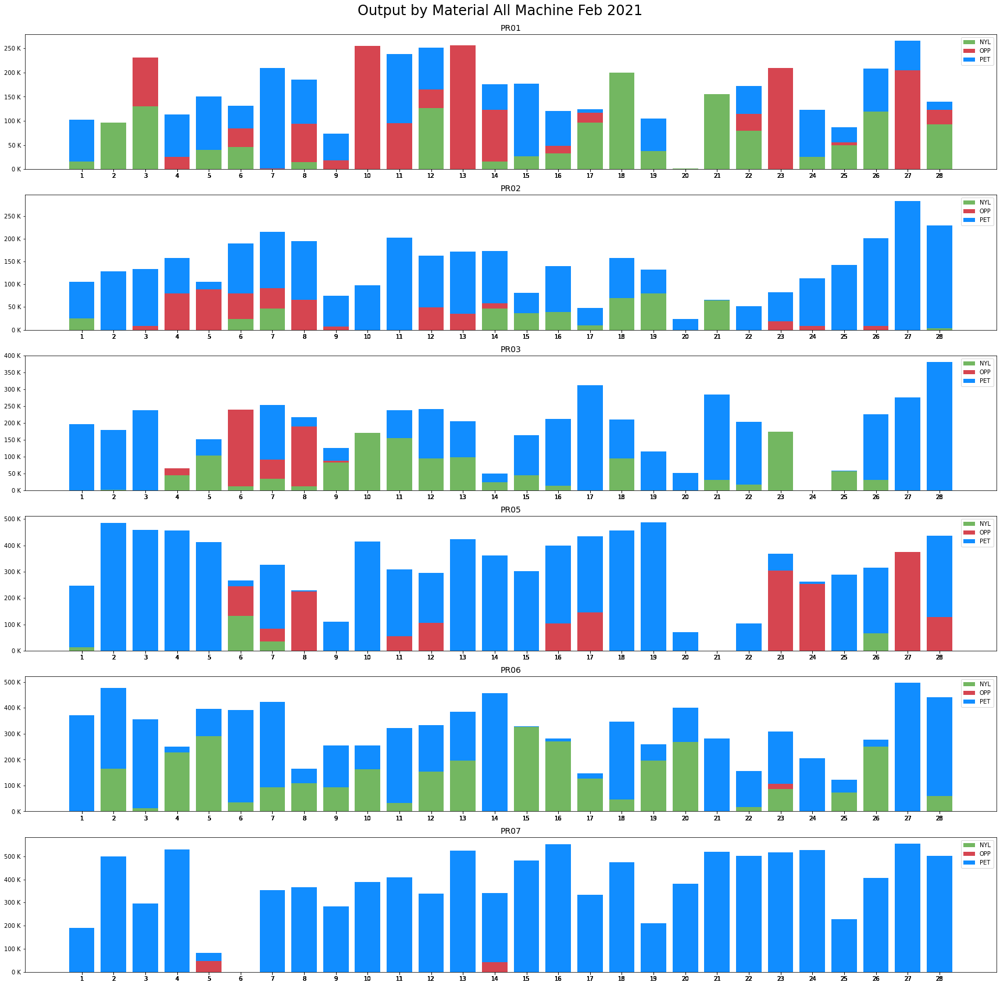

In [91]:
op_month = op[op['Month']==2].pivot_table(values='Output',index=['Date','MachineID'],columns='FILM',aggfunc='sum',fill_value=0).reset_index().rename_axis(None, axis=1)
op_month['Date'] = op_month['Date'].dt.day

fig, ax = plt.subplots(nrows=6,ncols=1,figsize=(24, 24))
list = [1, 2, 3, 5,6,7]
length = len(list)
for i in range(length):
  ax[i].bar(op_month[op_month['MachineID']=='PR0'+str(list[i])]['Date'], op_month[op_month['MachineID']=='PR0'+str(list[i])]['NYL'], label='NYL',color='#73b761')
  ax[i].bar(op_month[op_month['MachineID']=='PR0'+str(list[i])]['Date'], op_month[op_month['MachineID']=='PR0'+str(list[i])]['OPP'], 
          bottom=op_month[op_month['MachineID']=='PR0'+str(list[i])]['NYL'],label='OPP',color='#d64550')
  ax[i].bar(op_month[op_month['MachineID']=='PR0'+str(list[i])]['Date'], op_month[op_month['MachineID']=='PR0'+str(list[i])]['PET'], 
          bottom=op_month[op_month['MachineID']=='PR0'+str(list[i])]['NYL']+np.array(op_month[op_month['MachineID']=='PR0'+str(list[i])]['OPP']),label='PET',color='#118dff')
  ax[i].yaxis.set_major_formatter(thousand_formatter)
  ax[i].set_xticks(op_month['Date'])
  ax[i].legend()
  ax[i].set_title('PR0'+str(list[i]),fontsize=14)

fig.suptitle('Output by Material All Machine Feb 2021',fontsize=24)
# Tight layout often produces nice results
# but requires the title to be spaced accordingly
fig.tight_layout()
fig.subplots_adjust(top=0.95)
plt.show()

### **March**

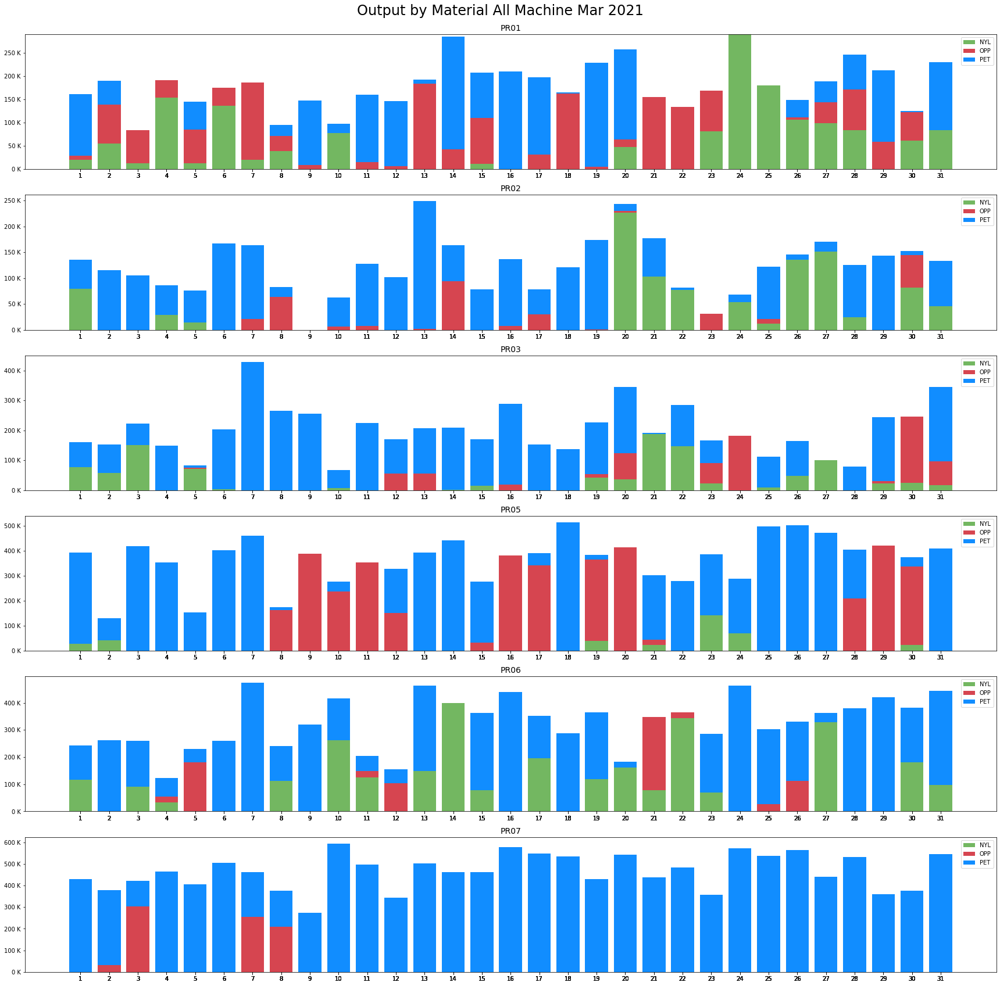

In [92]:
op_month = op[op['Month']==3].pivot_table(values='Output',index=['Date','MachineID'],columns='FILM',aggfunc='sum',fill_value=0).reset_index().rename_axis(None, axis=1)
op_month['Date'] = op_month['Date'].dt.day

fig, ax = plt.subplots(nrows=6,ncols=1,figsize=(24, 24))
list = [1, 2, 3, 5,6,7]
length = len(list)
for i in range(length):
  ax[i].bar(op_month[op_month['MachineID']=='PR0'+str(list[i])]['Date'], op_month[op_month['MachineID']=='PR0'+str(list[i])]['NYL'], label='NYL',color='#73b761')
  ax[i].bar(op_month[op_month['MachineID']=='PR0'+str(list[i])]['Date'], op_month[op_month['MachineID']=='PR0'+str(list[i])]['OPP'], 
          bottom=op_month[op_month['MachineID']=='PR0'+str(list[i])]['NYL'],label='OPP',color='#d64550')
  ax[i].bar(op_month[op_month['MachineID']=='PR0'+str(list[i])]['Date'], op_month[op_month['MachineID']=='PR0'+str(list[i])]['PET'], 
          bottom=op_month[op_month['MachineID']=='PR0'+str(list[i])]['NYL']+np.array(op_month[op_month['MachineID']=='PR0'+str(list[i])]['OPP']),label='PET',color='#118dff')
  ax[i].yaxis.set_major_formatter(thousand_formatter)
  ax[i].set_xticks(op_month['Date'])
  ax[i].legend()
  ax[i].set_title('PR0'+str(list[i]),fontsize=14)


fig.suptitle('Output by Material All Machine Mar 2021',fontsize=24)
# Tight layout often produces nice results
# but requires the title to be spaced accordingly
fig.tight_layout()
fig.subplots_adjust(top=0.95)
plt.show()

### **April**

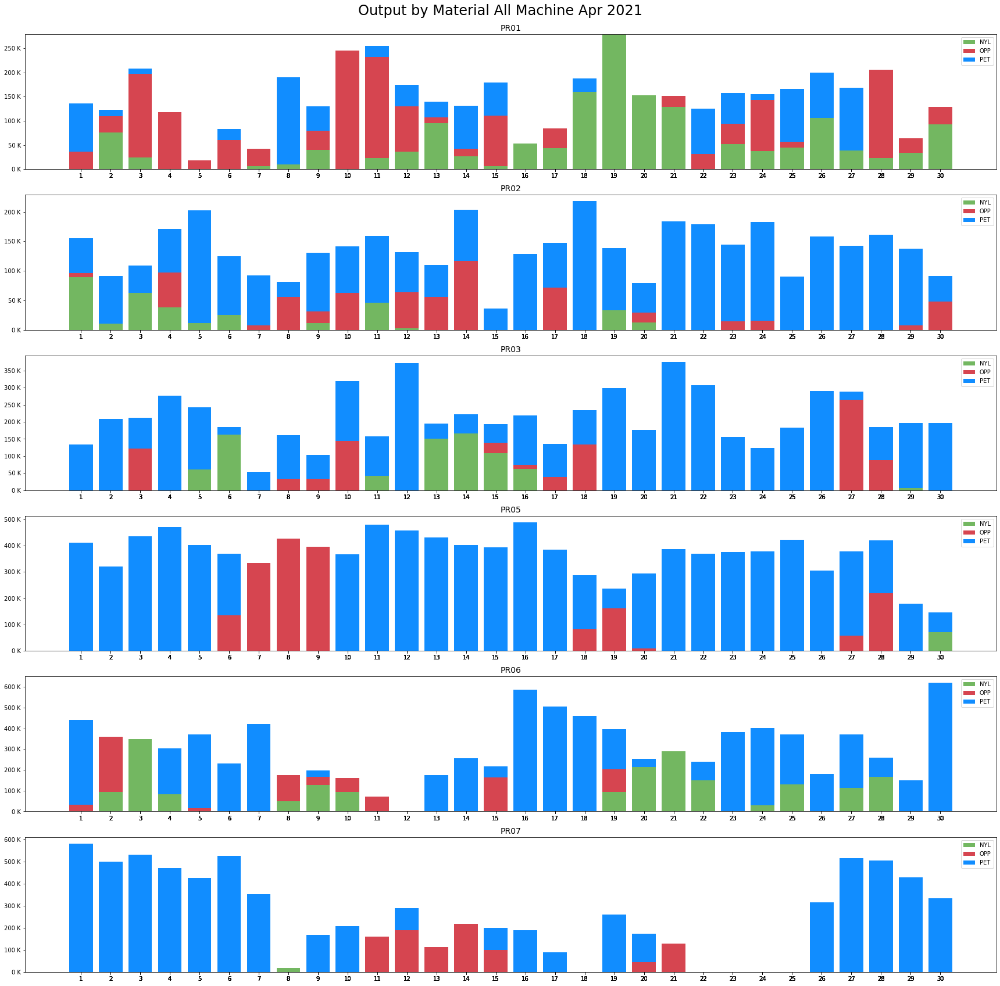

In [93]:
op_month = op[op['Month']==4].pivot_table(values='Output',index=['Date','MachineID'],columns='FILM',aggfunc='sum',fill_value=0).reset_index().rename_axis(None, axis=1)
op_month['Date'] = op_month['Date'].dt.day

fig, ax = plt.subplots(nrows=6,ncols=1,figsize=(24, 24))
list = [1, 2, 3, 5,6,7]
length = len(list)
for i in range(length):
  ax[i].bar(op_month[op_month['MachineID']=='PR0'+str(list[i])]['Date'], op_month[op_month['MachineID']=='PR0'+str(list[i])]['NYL'], label='NYL',color='#73b761')
  ax[i].bar(op_month[op_month['MachineID']=='PR0'+str(list[i])]['Date'], op_month[op_month['MachineID']=='PR0'+str(list[i])]['OPP'], 
          bottom=op_month[op_month['MachineID']=='PR0'+str(list[i])]['NYL'],label='OPP',color='#d64550')
  ax[i].bar(op_month[op_month['MachineID']=='PR0'+str(list[i])]['Date'], op_month[op_month['MachineID']=='PR0'+str(list[i])]['PET'], 
          bottom=op_month[op_month['MachineID']=='PR0'+str(list[i])]['NYL']+np.array(op_month[op_month['MachineID']=='PR0'+str(list[i])]['OPP']),label='PET',color='#118dff')
  ax[i].yaxis.set_major_formatter(thousand_formatter)
  ax[i].set_xticks(op_month['Date'])
  ax[i].legend()
  ax[i].set_title('PR0'+str(list[i]),fontsize=14)


fig.suptitle('Output by Material All Machine Apr 2021',fontsize=24)
# Tight layout often produces nice results
# but requires the title to be spaced accordingly
fig.tight_layout()
fig.subplots_adjust(top=0.95)
plt.show()

### **May**

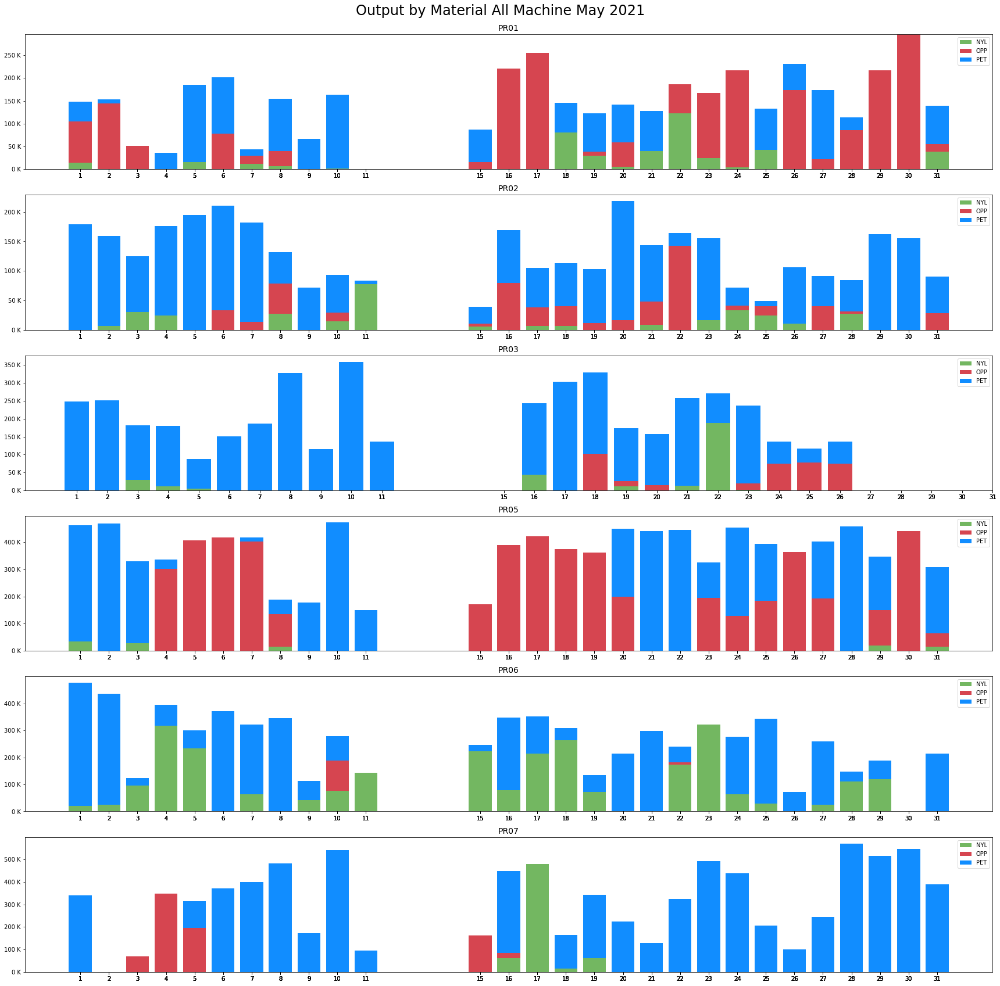

In [94]:
op_month = op[op['Month']==5].pivot_table(values='Output',index=['Date','MachineID'],columns='FILM',aggfunc='sum',fill_value=0).reset_index().rename_axis(None, axis=1)
op_month['Date'] = op_month['Date'].dt.day

fig, ax = plt.subplots(nrows=6,ncols=1,figsize=(24, 24))
list = [1, 2, 3, 5,6,7]
length = len(list)
for i in range(length):
  ax[i].bar(op_month[op_month['MachineID']=='PR0'+str(list[i])]['Date'], op_month[op_month['MachineID']=='PR0'+str(list[i])]['NYL'], label='NYL',color='#73b761')
  ax[i].bar(op_month[op_month['MachineID']=='PR0'+str(list[i])]['Date'], op_month[op_month['MachineID']=='PR0'+str(list[i])]['OPP'], 
          bottom=op_month[op_month['MachineID']=='PR0'+str(list[i])]['NYL'],label='OPP',color='#d64550')
  ax[i].bar(op_month[op_month['MachineID']=='PR0'+str(list[i])]['Date'], op_month[op_month['MachineID']=='PR0'+str(list[i])]['PET'], 
          bottom=op_month[op_month['MachineID']=='PR0'+str(list[i])]['NYL']+np.array(op_month[op_month['MachineID']=='PR0'+str(list[i])]['OPP']),label='PET',color='#118dff')
  ax[i].yaxis.set_major_formatter(thousand_formatter)
  ax[i].set_xticks(op_month['Date'])
  ax[i].legend()
  ax[i].set_title('PR0'+str(list[i]),fontsize=14)


fig.suptitle('Output by Material All Machine May 2021',fontsize=24)
# Tight layout often produces nice results
# but requires the title to be spaced accordingly
fig.tight_layout()
fig.subplots_adjust(top=0.95)
plt.show()

### **June**

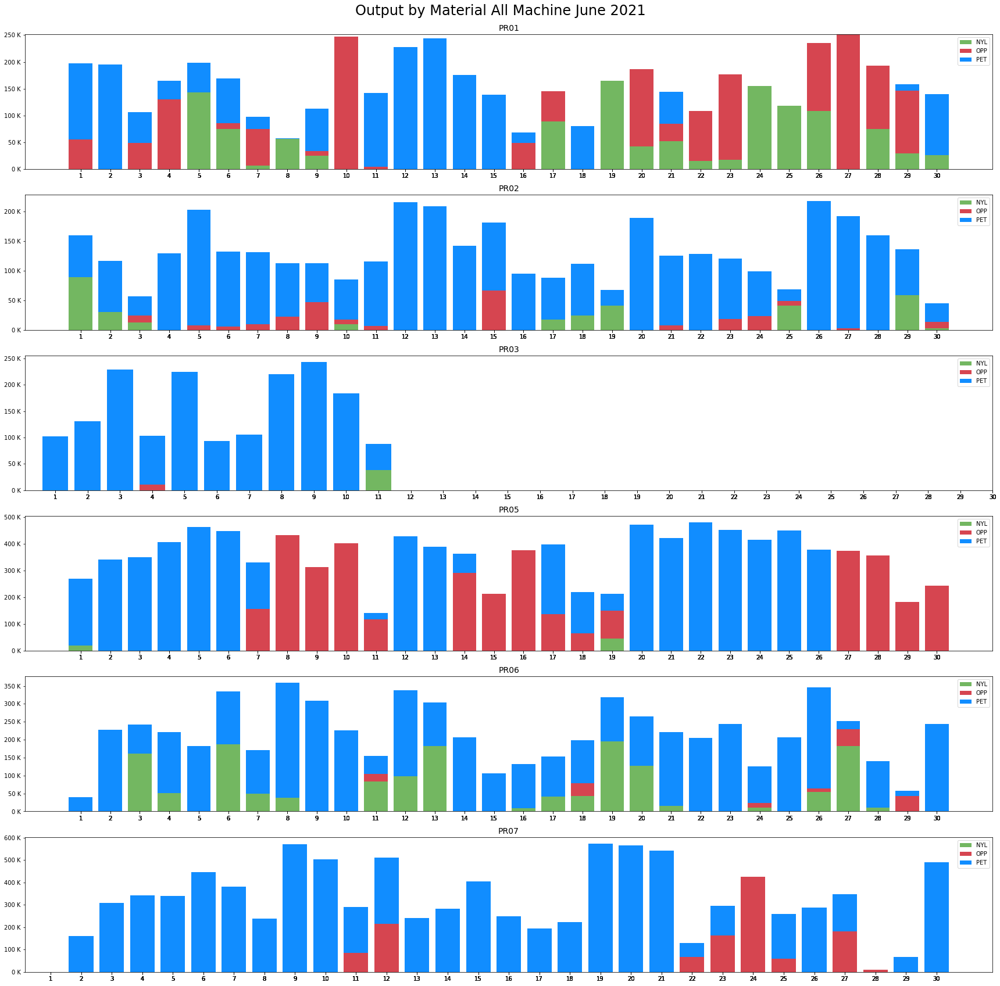

In [95]:
op_month = op[op['Month']==6].pivot_table(values='Output',index=['Date','MachineID'],columns='FILM',aggfunc='sum',fill_value=0).reset_index().rename_axis(None, axis=1)
op_month['Date'] = op_month['Date'].dt.day

fig, ax = plt.subplots(nrows=6,ncols=1,figsize=(24, 24))
list = [1, 2, 3, 5,6,7]
length = len(list)
for i in range(length):
  ax[i].bar(op_month[op_month['MachineID']=='PR0'+str(list[i])]['Date'], op_month[op_month['MachineID']=='PR0'+str(list[i])]['NYL'], label='NYL',color='#73b761')
  ax[i].bar(op_month[op_month['MachineID']=='PR0'+str(list[i])]['Date'], op_month[op_month['MachineID']=='PR0'+str(list[i])]['OPP'], 
          bottom=op_month[op_month['MachineID']=='PR0'+str(list[i])]['NYL'],label='OPP',color='#d64550')
  ax[i].bar(op_month[op_month['MachineID']=='PR0'+str(list[i])]['Date'], op_month[op_month['MachineID']=='PR0'+str(list[i])]['PET'], 
          bottom=op_month[op_month['MachineID']=='PR0'+str(list[i])]['NYL']+np.array(op_month[op_month['MachineID']=='PR0'+str(list[i])]['OPP']),label='PET',color='#118dff')
  ax[i].yaxis.set_major_formatter(thousand_formatter)
  ax[i].set_xticks(op_month['Date'])
  ax[i].legend()
  ax[i].set_title('PR0'+str(list[i]),fontsize=14)


fig.suptitle('Output by Material All Machine June 2021',fontsize=24)
# Tight layout often produces nice results
# but requires the title to be spaced accordingly
fig.tight_layout()
fig.subplots_adjust(top=0.95)
plt.show()

### **July**

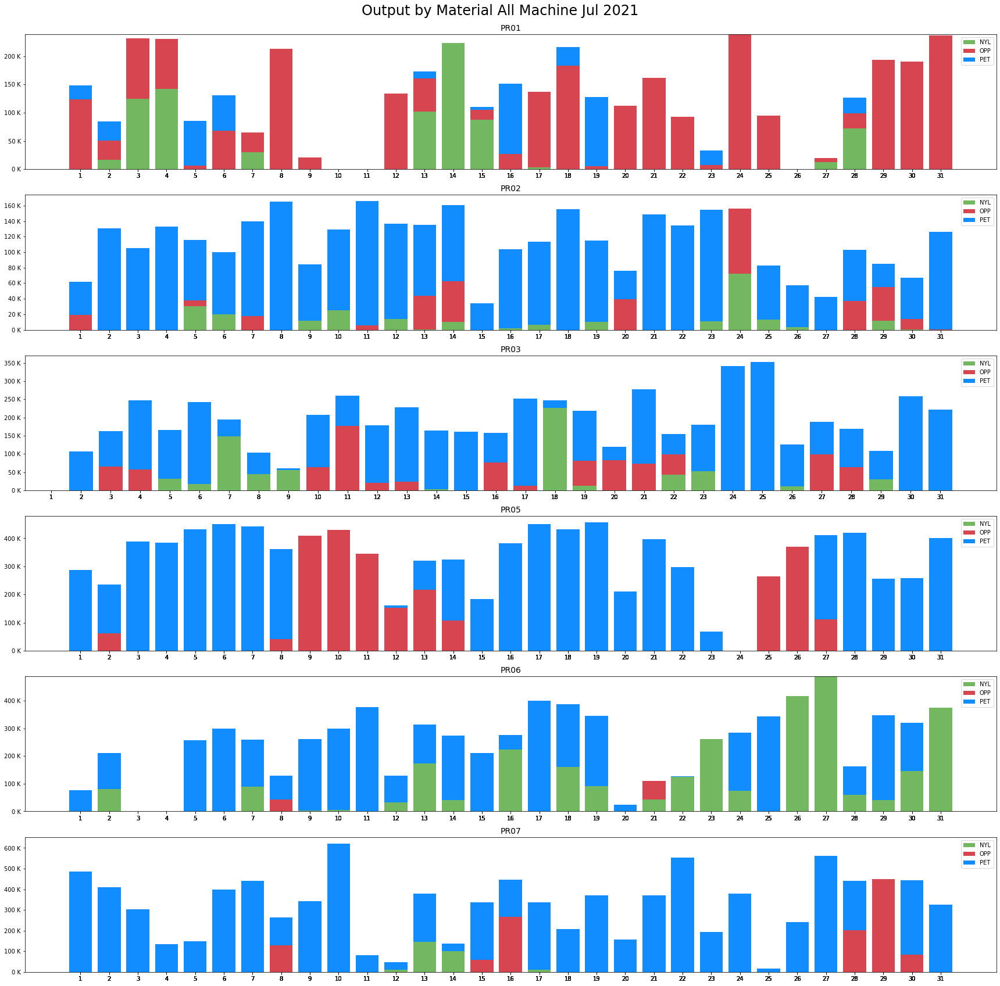

In [96]:
op_month = op[op['Month']==7].pivot_table(values='Output',index=['Date','MachineID'],columns='FILM',aggfunc='sum',fill_value=0).reset_index().rename_axis(None, axis=1)
op_month['Date'] = op_month['Date'].dt.day

fig, ax = plt.subplots(nrows=6,ncols=1,figsize=(24, 24))
list = [1, 2, 3, 5,6,7]
length = len(list)
for i in range(length):
  ax[i].bar(op_month[op_month['MachineID']=='PR0'+str(list[i])]['Date'], op_month[op_month['MachineID']=='PR0'+str(list[i])]['NYL'], label='NYL',color='#73b761')
  ax[i].bar(op_month[op_month['MachineID']=='PR0'+str(list[i])]['Date'], op_month[op_month['MachineID']=='PR0'+str(list[i])]['OPP'], 
          bottom=op_month[op_month['MachineID']=='PR0'+str(list[i])]['NYL'],label='OPP',color='#d64550')
  ax[i].bar(op_month[op_month['MachineID']=='PR0'+str(list[i])]['Date'], op_month[op_month['MachineID']=='PR0'+str(list[i])]['PET'], 
          bottom=op_month[op_month['MachineID']=='PR0'+str(list[i])]['NYL']+np.array(op_month[op_month['MachineID']=='PR0'+str(list[i])]['OPP']),label='PET',color='#118dff')
  ax[i].yaxis.set_major_formatter(thousand_formatter)
  ax[i].set_xticks(op_month['Date'])
  ax[i].legend()
  ax[i].set_title('PR0'+str(list[i]),fontsize=14)

fig.suptitle('Output by Material All Machine Jul 2021',fontsize=24)
# Tight layout often produces nice results
# but requires the title to be spaced accordingly
fig.tight_layout()
fig.subplots_adjust(top=0.95)
plt.show()

### **August**

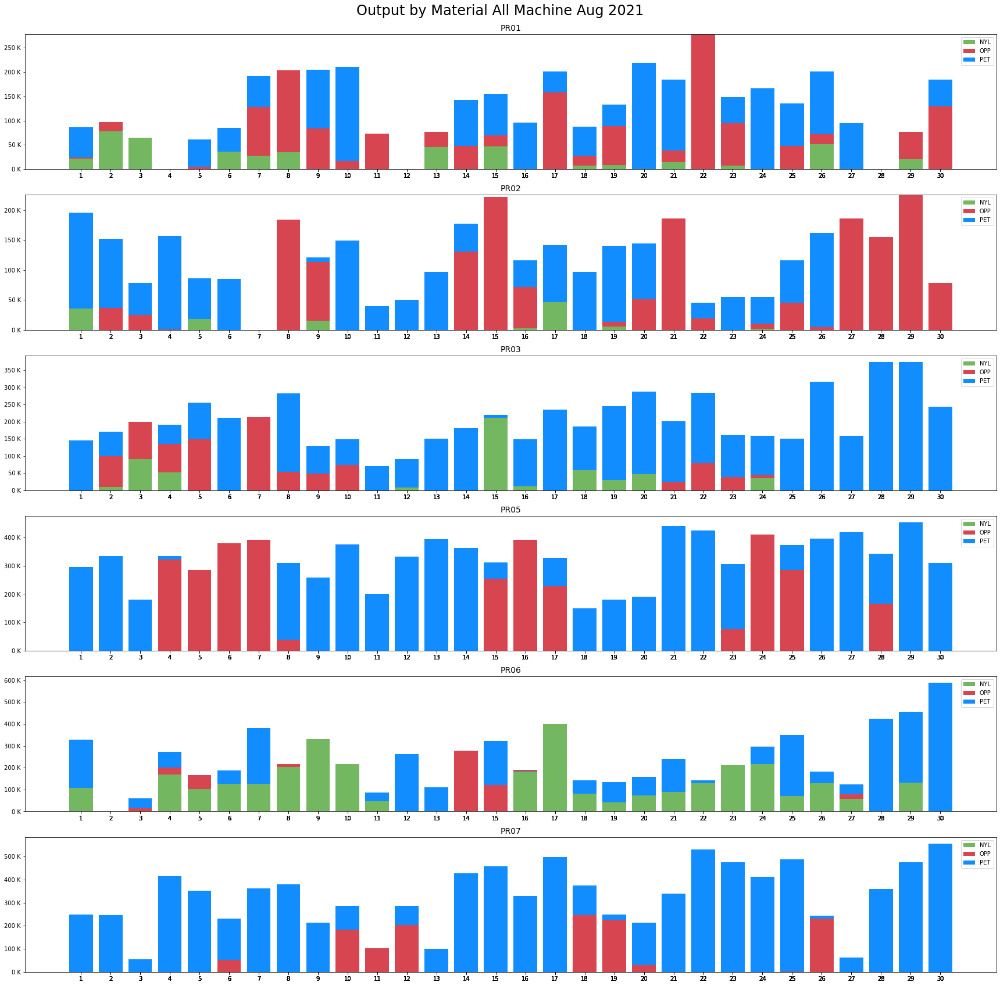

In [97]:
op_month = op[op['Month']==8].pivot_table(values='Output',index=['Date','MachineID'],columns='FILM',aggfunc='sum',fill_value=0).reset_index().rename_axis(None, axis=1)
op_month['Date'] = op_month['Date'].dt.day

fig, ax = plt.subplots(nrows=6,ncols=1,figsize=(24, 24))
list = [1, 2, 3, 5,6,7]
length = len(list)
for i in range(length):
  ax[i].bar(op_month[op_month['MachineID']=='PR0'+str(list[i])]['Date'], op_month[op_month['MachineID']=='PR0'+str(list[i])]['NYL'], label='NYL',color='#73b761')
  ax[i].bar(op_month[op_month['MachineID']=='PR0'+str(list[i])]['Date'], op_month[op_month['MachineID']=='PR0'+str(list[i])]['OPP'], 
          bottom=op_month[op_month['MachineID']=='PR0'+str(list[i])]['NYL'],label='OPP',color='#d64550')
  ax[i].bar(op_month[op_month['MachineID']=='PR0'+str(list[i])]['Date'], op_month[op_month['MachineID']=='PR0'+str(list[i])]['PET'], 
          bottom=op_month[op_month['MachineID']=='PR0'+str(list[i])]['NYL']+np.array(op_month[op_month['MachineID']=='PR0'+str(list[i])]['OPP']),label='PET',color='#118dff')
  ax[i].yaxis.set_major_formatter(thousand_formatter)
  ax[i].set_xticks(op_month['Date'])
  ax[i].legend()
  ax[i].set_title('PR0'+str(list[i]),fontsize=14)

fig.suptitle('Output by Material All Machine Aug 2021',fontsize=24)
# Tight layout often produces nice results
# but requires the title to be spaced accordingly
fig.tight_layout()
fig.subplots_adjust(top=0.95)
plt.show()

### **September**

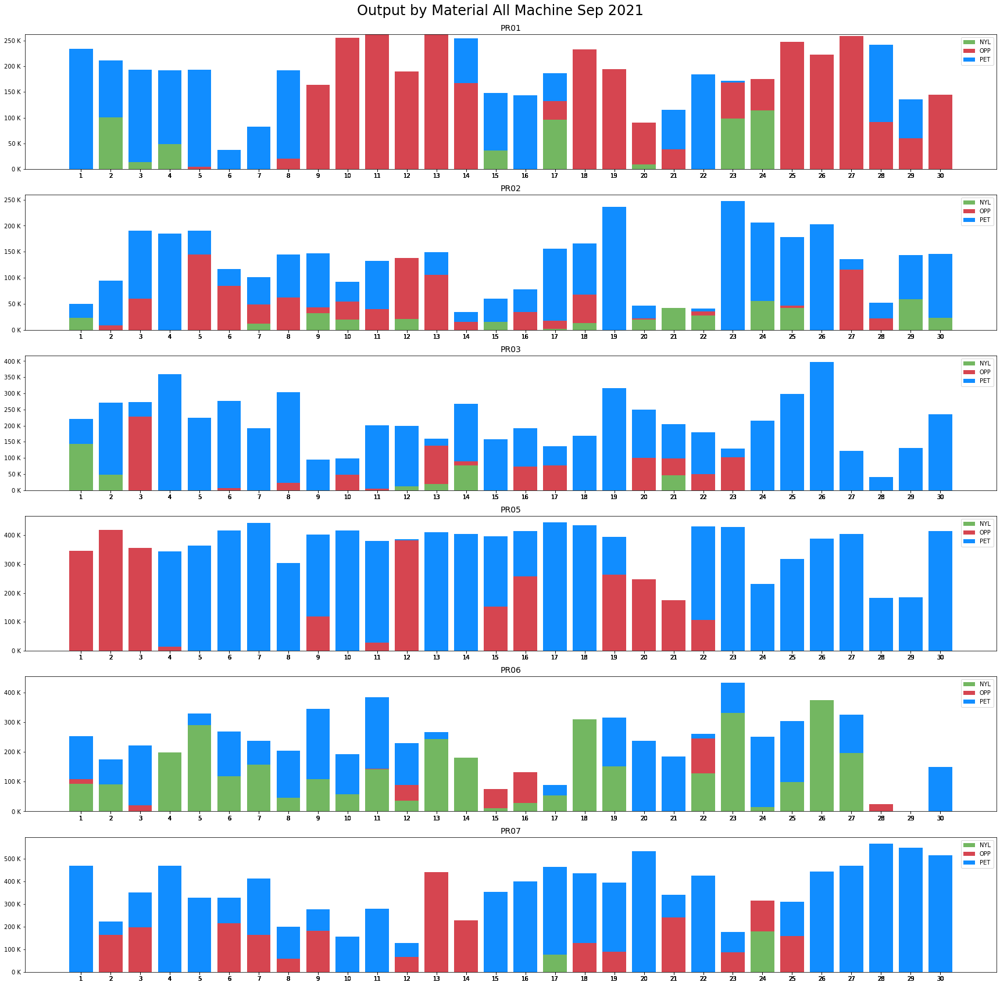

In [98]:
op_month = op[op['Month']==9].pivot_table(values='Output',index=['Date','MachineID'],columns='FILM',aggfunc='sum',fill_value=0).reset_index().rename_axis(None, axis=1)
op_month['Date'] = op_month['Date'].dt.day

fig, ax = plt.subplots(nrows=6,ncols=1,figsize=(24, 24))
list = [1, 2, 3, 5,6,7]
length = len(list)
for i in range(length):
  ax[i].bar(op_month[op_month['MachineID']=='PR0'+str(list[i])]['Date'], op_month[op_month['MachineID']=='PR0'+str(list[i])]['NYL'], label='NYL',color='#73b761')
  ax[i].bar(op_month[op_month['MachineID']=='PR0'+str(list[i])]['Date'], op_month[op_month['MachineID']=='PR0'+str(list[i])]['OPP'], 
          bottom=op_month[op_month['MachineID']=='PR0'+str(list[i])]['NYL'],label='OPP',color='#d64550')
  ax[i].bar(op_month[op_month['MachineID']=='PR0'+str(list[i])]['Date'], op_month[op_month['MachineID']=='PR0'+str(list[i])]['PET'], 
          bottom=op_month[op_month['MachineID']=='PR0'+str(list[i])]['NYL']+np.array(op_month[op_month['MachineID']=='PR0'+str(list[i])]['OPP']),label='PET',color='#118dff')
  ax[i].yaxis.set_major_formatter(thousand_formatter)
  ax[i].set_xticks(op_month['Date'])
  ax[i].legend()
  ax[i].set_title('PR0'+str(list[i]),fontsize=14)

fig.suptitle('Output by Material All Machine Sep 2021',fontsize=24)
# Tight layout often produces nice results
# but requires the title to be spaced accordingly
fig.tight_layout()
fig.subplots_adjust(top=0.95)
plt.show()

### **October**

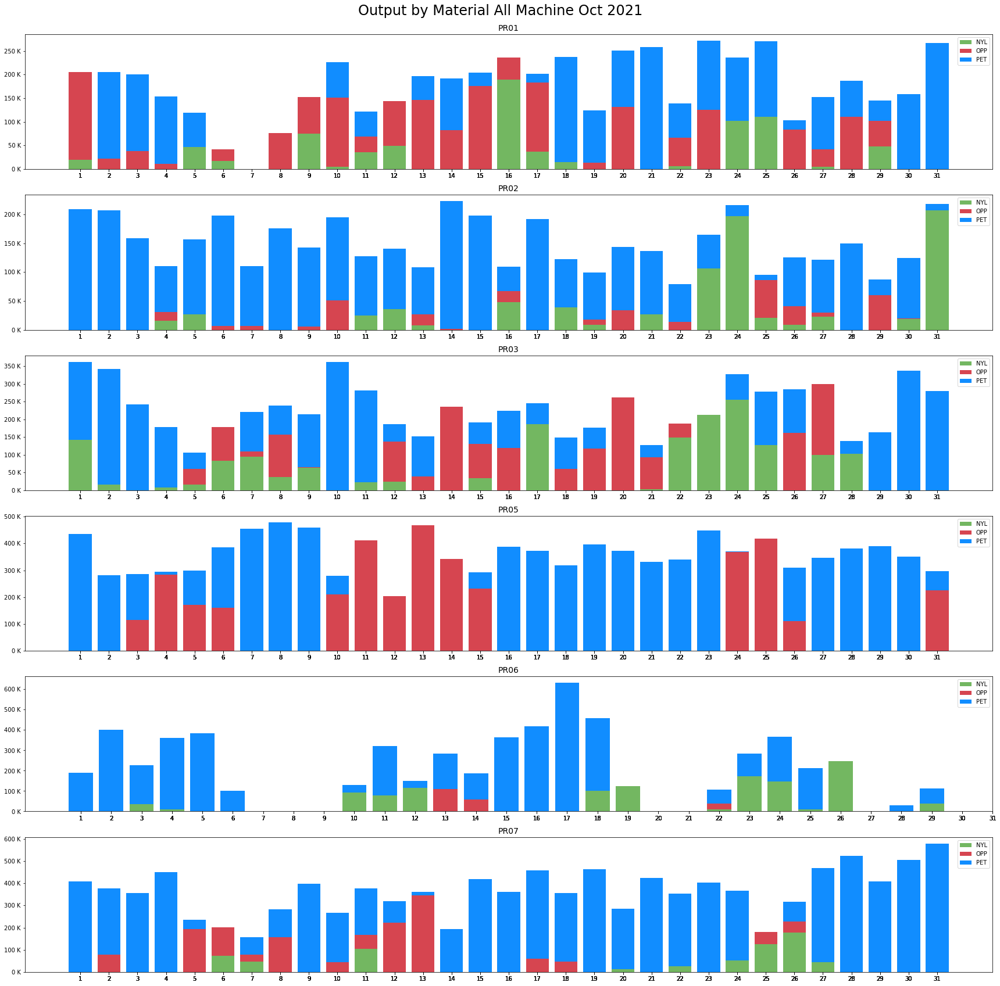

In [99]:
op_month = op[op['Month']==10].pivot_table(values='Output',index=['Date','MachineID'],columns='FILM',aggfunc='sum',fill_value=0).reset_index().rename_axis(None, axis=1)
op_month['Date'] = op_month['Date'].dt.day

fig, ax = plt.subplots(nrows=6,ncols=1,figsize=(24, 24))
list = [1, 2, 3, 5,6,7]
length = len(list)
for i in range(length):
  ax[i].bar(op_month[op_month['MachineID']=='PR0'+str(list[i])]['Date'], op_month[op_month['MachineID']=='PR0'+str(list[i])]['NYL'], label='NYL',color='#73b761')
  ax[i].bar(op_month[op_month['MachineID']=='PR0'+str(list[i])]['Date'], op_month[op_month['MachineID']=='PR0'+str(list[i])]['OPP'], 
          bottom=op_month[op_month['MachineID']=='PR0'+str(list[i])]['NYL'],label='OPP',color='#d64550')
  ax[i].bar(op_month[op_month['MachineID']=='PR0'+str(list[i])]['Date'], op_month[op_month['MachineID']=='PR0'+str(list[i])]['PET'], 
          bottom=op_month[op_month['MachineID']=='PR0'+str(list[i])]['NYL']+np.array(op_month[op_month['MachineID']=='PR0'+str(list[i])]['OPP']),label='PET',color='#118dff')
  ax[i].yaxis.set_major_formatter(thousand_formatter)
  ax[i].set_xticks(op_month['Date'])
  ax[i].legend()
  ax[i].set_title('PR0'+str(list[i]),fontsize=14)

fig.suptitle('Output by Material All Machine Oct 2021',fontsize=24)
# Tight layout often produces nice results
# but requires the title to be spaced accordingly
fig.tight_layout()
fig.subplots_adjust(top=0.95)
plt.show()

### **November**

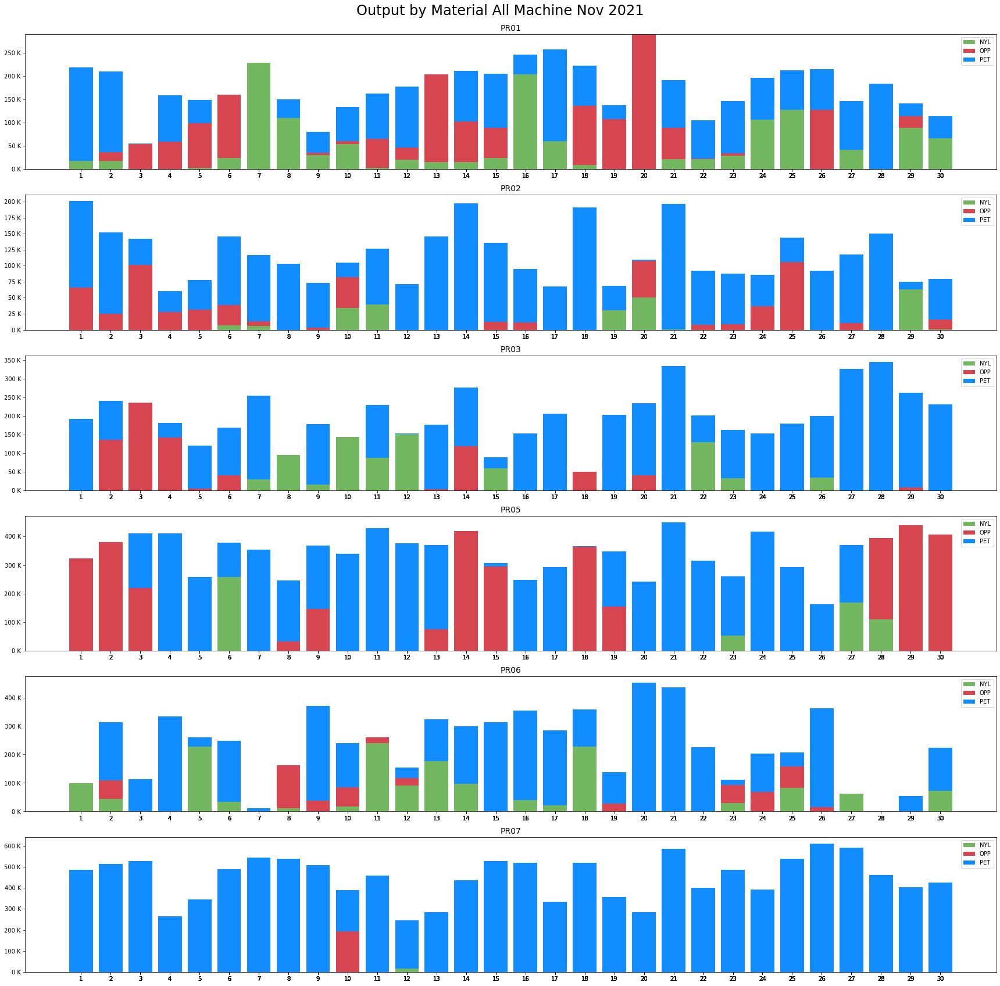

In [100]:
op_month = op[op['Month']==11].pivot_table(values='Output',index=['Date','MachineID'],columns='FILM',aggfunc='sum',fill_value=0).reset_index().rename_axis(None, axis=1)
op_month['Date'] = op_month['Date'].dt.day

fig, ax = plt.subplots(nrows=6,ncols=1,figsize=(24, 24))
list = [1, 2, 3, 5,6,7]
length = len(list)
for i in range(length):
  ax[i].bar(op_month[op_month['MachineID']=='PR0'+str(list[i])]['Date'], op_month[op_month['MachineID']=='PR0'+str(list[i])]['NYL'], label='NYL',color='#73b761')
  ax[i].bar(op_month[op_month['MachineID']=='PR0'+str(list[i])]['Date'], op_month[op_month['MachineID']=='PR0'+str(list[i])]['OPP'], 
          bottom=op_month[op_month['MachineID']=='PR0'+str(list[i])]['NYL'],label='OPP',color='#d64550')
  ax[i].bar(op_month[op_month['MachineID']=='PR0'+str(list[i])]['Date'], op_month[op_month['MachineID']=='PR0'+str(list[i])]['PET'], 
          bottom=op_month[op_month['MachineID']=='PR0'+str(list[i])]['NYL']+np.array(op_month[op_month['MachineID']=='PR0'+str(list[i])]['OPP']),label='PET',color='#118dff')
  ax[i].yaxis.set_major_formatter(thousand_formatter)
  ax[i].set_xticks(op_month['Date'])
  ax[i].legend()
  ax[i].set_title('PR0'+str(list[i]),fontsize=14)

fig.suptitle('Output by Material All Machine Nov 2021',fontsize=24)
# Tight layout often produces nice results
# but requires the title to be spaced accordingly
fig.tight_layout()
fig.subplots_adjust(top=0.95)
plt.show()

### **December**

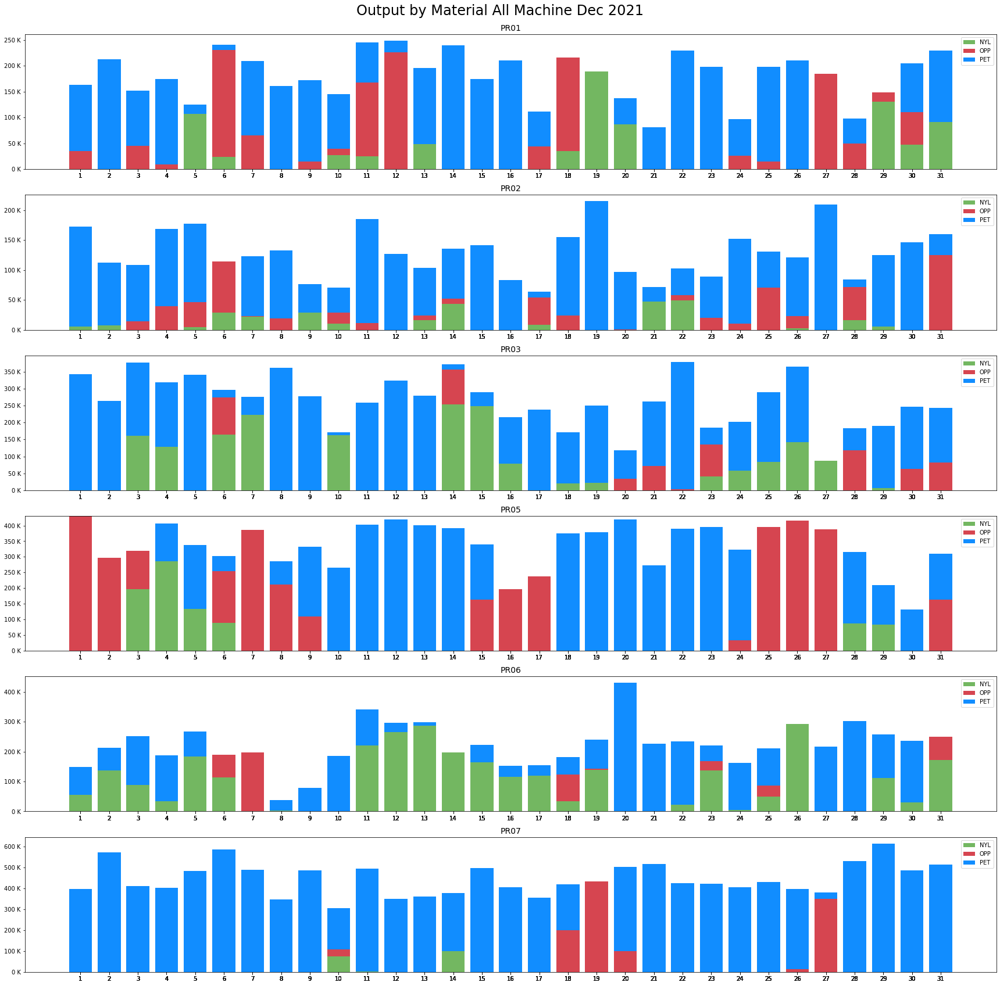

In [101]:
op_month = op[op['Month']==12].pivot_table(values='Output',index=['Date','MachineID'],columns='FILM',aggfunc='sum',fill_value=0).reset_index().rename_axis(None, axis=1)
op_month['Date'] = op_month['Date'].dt.day

fig, ax = plt.subplots(nrows=6,ncols=1,figsize=(24, 24))
list = [1, 2, 3, 5,6,7]
length = len(list)
for i in range(length):
  ax[i].bar(op_month[op_month['MachineID']=='PR0'+str(list[i])]['Date'], op_month[op_month['MachineID']=='PR0'+str(list[i])]['NYL'], label='NYL',color='#73b761')
  ax[i].bar(op_month[op_month['MachineID']=='PR0'+str(list[i])]['Date'], op_month[op_month['MachineID']=='PR0'+str(list[i])]['OPP'], 
          bottom=op_month[op_month['MachineID']=='PR0'+str(list[i])]['NYL'],label='OPP',color='#d64550')
  ax[i].bar(op_month[op_month['MachineID']=='PR0'+str(list[i])]['Date'], op_month[op_month['MachineID']=='PR0'+str(list[i])]['PET'], 
          bottom=op_month[op_month['MachineID']=='PR0'+str(list[i])]['NYL']+np.array(op_month[op_month['MachineID']=='PR0'+str(list[i])]['OPP']),label='PET',color='#118dff')
  ax[i].yaxis.set_major_formatter(thousand_formatter)
  ax[i].set_xticks(op_month['Date'])
  ax[i].legend()
  ax[i].set_title('PR0'+str(list[i]),fontsize=14)



fig.suptitle('Output by Material All Machine Dec 2021',fontsize=24)
# Tight layout often produces nice results
# but requires the title to be spaced accordingly
fig.tight_layout()
fig.subplots_adjust(top=0.95)
plt.show()

## **5. Output by Material per Machine Jan to Dec**

### **PR01**

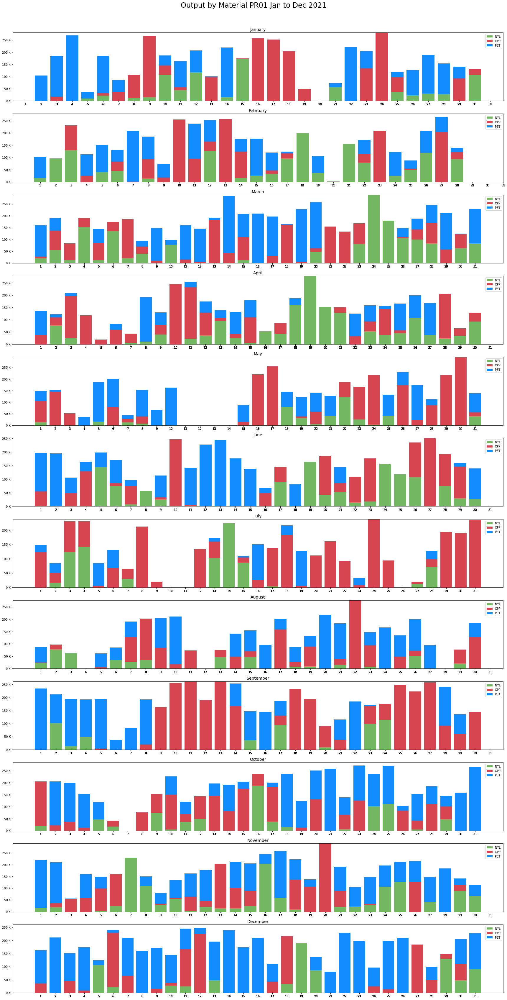

In [102]:
op_pr= op[op['MachineID']=='PR01'].pivot_table(values='Output',index=['Date','Month'],columns='FILM',aggfunc='sum', fill_value=0).reset_index().rename_axis(None, axis=1)
op_pr['Date'] = op_pr['Date'].dt.day
fig, ax = plt.subplots(nrows=12,ncols=1,figsize=(24, 48))

for i in range(12):
  ax[i].bar(op_pr[op_pr['Month']==i+1]['Date'], op_pr[op_pr['Month']==i+1]['NYL'], label='NYL',color='#73b761')
  ax[i].bar(op_pr[op_pr['Month']==i+1]['Date'], op_pr[op_pr['Month']==i+1]['OPP'], 
              bottom=op_pr[op_pr['Month']==i+1]['NYL'],label='OPP',color='#d64550')
  ax[i].bar(op_pr[op_pr['Month']==i+1]['Date'], op_pr[op_pr['Month']==i+1]['PET'], 
              bottom=op_pr[op_pr['Month']==i+1]['NYL']+np.array(op_pr[op_pr['Month']==i+1]['OPP']),label='PET',color='#118dff')
  ax[i].yaxis.set_major_formatter(thousand_formatter)
  ax[i].set_xticks(op_pr['Date'])
  ax[i].legend()
  ax[i].set_title(calendar.month_name[i+1],fontsize=14)


fig.suptitle('Output by Material PR01 Jan to Dec 2021',fontsize=24)
# Tight layout often produces nice results
# but requires the title to be spaced accordingly
fig.tight_layout()
fig.subplots_adjust(top=0.95)
plt.show()

### **PR02**

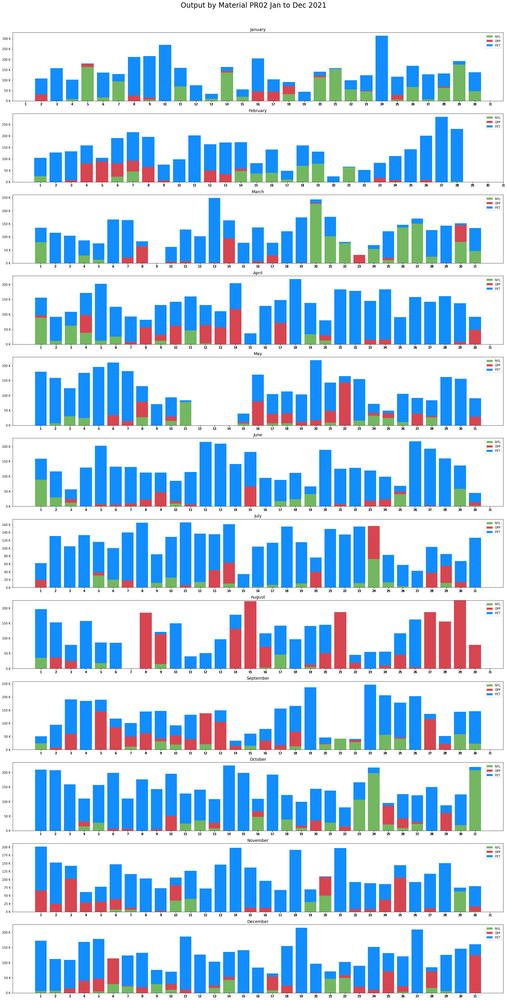

In [103]:
op_pr= op[op['MachineID']=='PR02'].pivot_table(values='Output',index=['Date','Month'],columns='FILM',aggfunc='sum', fill_value=0).reset_index().rename_axis(None, axis=1)
op_pr['Date'] = op_pr['Date'].dt.day
fig, ax = plt.subplots(nrows=12,ncols=1,figsize=(24, 48))

for i in range(12):
  ax[i].bar(op_pr[op_pr['Month']==i+1]['Date'], op_pr[op_pr['Month']==i+1]['NYL'], label='NYL',color='#73b761')
  ax[i].bar(op_pr[op_pr['Month']==i+1]['Date'], op_pr[op_pr['Month']==i+1]['OPP'], 
              bottom=op_pr[op_pr['Month']==i+1]['NYL'],label='OPP',color='#d64550')
  ax[i].bar(op_pr[op_pr['Month']==i+1]['Date'], op_pr[op_pr['Month']==i+1]['PET'], 
              bottom=op_pr[op_pr['Month']==i+1]['NYL']+np.array(op_pr[op_pr['Month']==i+1]['OPP']),label='PET',color='#118dff')
  ax[i].yaxis.set_major_formatter(thousand_formatter)
  ax[i].set_xticks(op_pr['Date'])
  ax[i].legend()
  ax[i].set_title(calendar.month_name[i+1],fontsize=14)

fig.suptitle('Output by Material PR02 Jan to Dec 2021',fontsize=24)
# Tight layout often produces nice results
# but requires the title to be spaced accordingly
fig.tight_layout()
fig.subplots_adjust(top=0.95)
plt.show()

### **PR03**

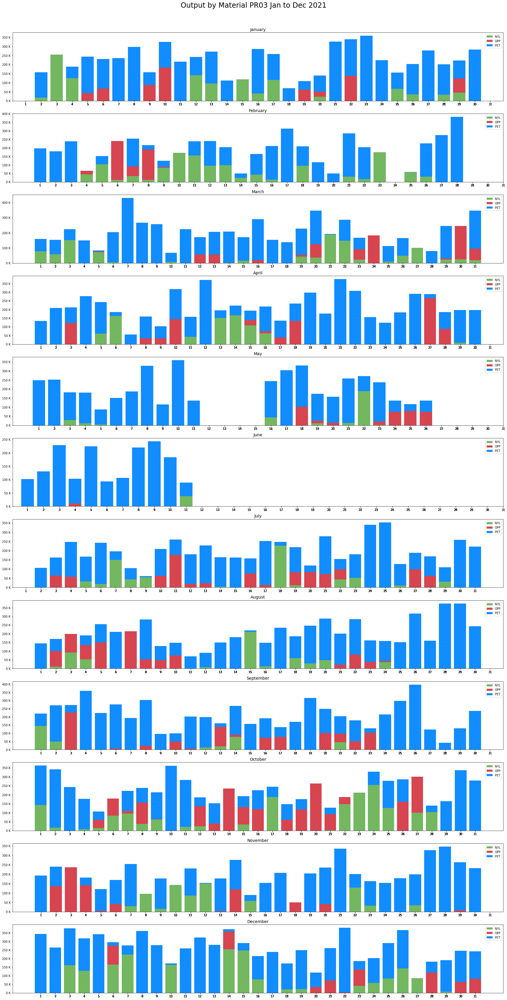

In [104]:
op_pr= op[op['MachineID']=='PR03'].pivot_table(values='Output',index=['Date','Month'],columns='FILM',aggfunc='sum', fill_value=0).reset_index().rename_axis(None, axis=1)
op_pr['Date'] = op_pr['Date'].dt.day
fig, ax = plt.subplots(nrows=12,ncols=1,figsize=(24, 48))

for i in range(12):
  ax[i].bar(op_pr[op_pr['Month']==i+1]['Date'], op_pr[op_pr['Month']==i+1]['NYL'], label='NYL',color='#73b761')
  ax[i].bar(op_pr[op_pr['Month']==i+1]['Date'], op_pr[op_pr['Month']==i+1]['OPP'], 
              bottom=op_pr[op_pr['Month']==i+1]['NYL'],label='OPP',color='#d64550')
  ax[i].bar(op_pr[op_pr['Month']==i+1]['Date'], op_pr[op_pr['Month']==i+1]['PET'], 
              bottom=op_pr[op_pr['Month']==i+1]['NYL']+np.array(op_pr[op_pr['Month']==i+1]['OPP']),label='PET',color='#118dff')
  ax[i].yaxis.set_major_formatter(thousand_formatter)
  ax[i].set_xticks(op_pr['Date'])
  ax[i].legend()
  ax[i].set_title(calendar.month_name[i+1],fontsize=14)

fig.suptitle('Output by Material PR03 Jan to Dec 2021',fontsize=24)
# Tight layout often produces nice results
# but requires the title to be spaced accordingly
fig.tight_layout()
fig.subplots_adjust(top=0.95)
plt.show()

### **PR05**

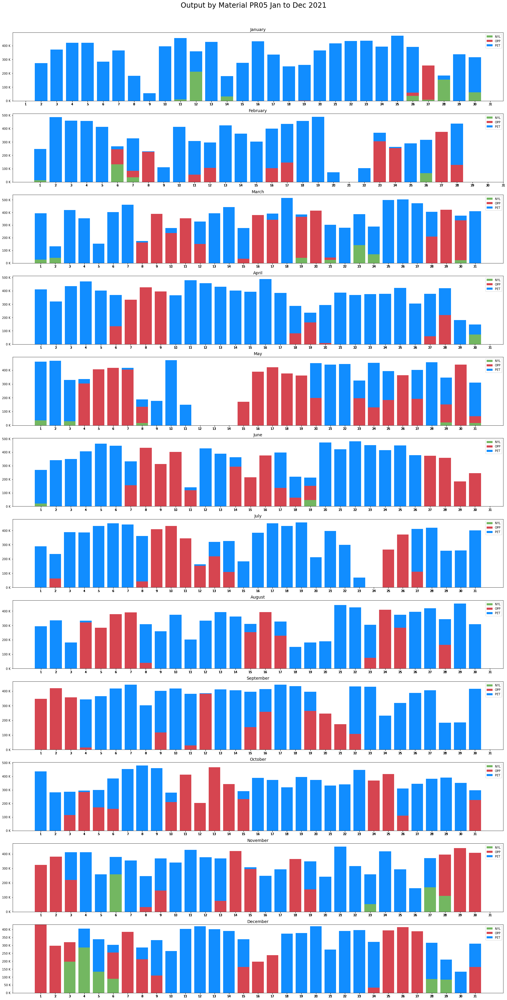

In [105]:
op_pr= op[op['MachineID']=='PR05'].pivot_table(values='Output',index=['Date','Month'],columns='FILM',aggfunc='sum', fill_value=0).reset_index().rename_axis(None, axis=1)
op_pr['Date'] = op_pr['Date'].dt.day

fig, ax = plt.subplots(nrows=12,ncols=1,figsize=(24, 48))
for i in range(12):
  ax[i].bar(op_pr[op_pr['Month']==i+1]['Date'], op_pr[op_pr['Month']==i+1]['NYL'], label='NYL',color='#73b761')
  ax[i].bar(op_pr[op_pr['Month']==i+1]['Date'], op_pr[op_pr['Month']==i+1]['OPP'], 
              bottom=op_pr[op_pr['Month']==i+1]['NYL'],label='OPP',color='#d64550')
  ax[i].bar(op_pr[op_pr['Month']==i+1]['Date'], op_pr[op_pr['Month']==i+1]['PET'], 
              bottom=op_pr[op_pr['Month']==i+1]['NYL']+np.array(op_pr[op_pr['Month']==i+1]['OPP']),label='PET',color='#118dff')
  ax[i].yaxis.set_major_formatter(thousand_formatter)
  ax[i].set_xticks(op_pr['Date'])
  ax[i].legend()
  ax[i].set_title(calendar.month_name[i+1],fontsize=14)

fig.suptitle('Output by Material PR05 Jan to Dec 2021',fontsize=24)
# Tight layout often produces nice results
# but requires the title to be spaced accordingly
fig.tight_layout()
fig.subplots_adjust(top=0.95)
plt.show()

### **PR06**

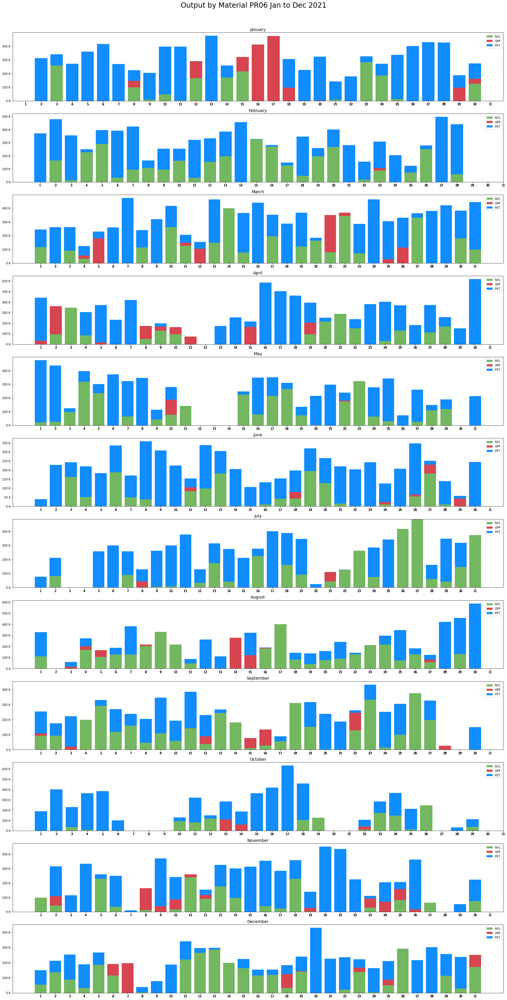

In [106]:
op_pr= op[op['MachineID']=='PR06'].pivot_table(values='Output',index=['Date','Month'],columns='FILM',aggfunc='sum', fill_value=0).reset_index().rename_axis(None, axis=1)
op_pr['Date'] = op_pr['Date'].dt.day

fig, ax = plt.subplots(nrows=12,ncols=1,figsize=(24, 48))
for i in range(12):
  ax[i].bar(op_pr[op_pr['Month']==i+1]['Date'], op_pr[op_pr['Month']==i+1]['NYL'], label='NYL',color='#73b761')
  ax[i].bar(op_pr[op_pr['Month']==i+1]['Date'], op_pr[op_pr['Month']==i+1]['OPP'], 
              bottom=op_pr[op_pr['Month']==i+1]['NYL'],label='OPP',color='#d64550')
  ax[i].bar(op_pr[op_pr['Month']==i+1]['Date'], op_pr[op_pr['Month']==i+1]['PET'], 
              bottom=op_pr[op_pr['Month']==i+1]['NYL']+np.array(op_pr[op_pr['Month']==i+1]['OPP']),label='PET',color='#118dff')
  ax[i].yaxis.set_major_formatter(thousand_formatter)
  ax[i].set_xticks(op_pr['Date'])
  ax[i].legend()
  ax[i].set_title(calendar.month_name[i+1],fontsize=14)

fig.suptitle('Output by Material PR06 Jan to Dec 2021',fontsize=24)
# Tight layout often produces nice results
# but requires the title to be spaced accordingly
fig.tight_layout()
fig.subplots_adjust(top=0.95)
plt.show()

### **PR07**

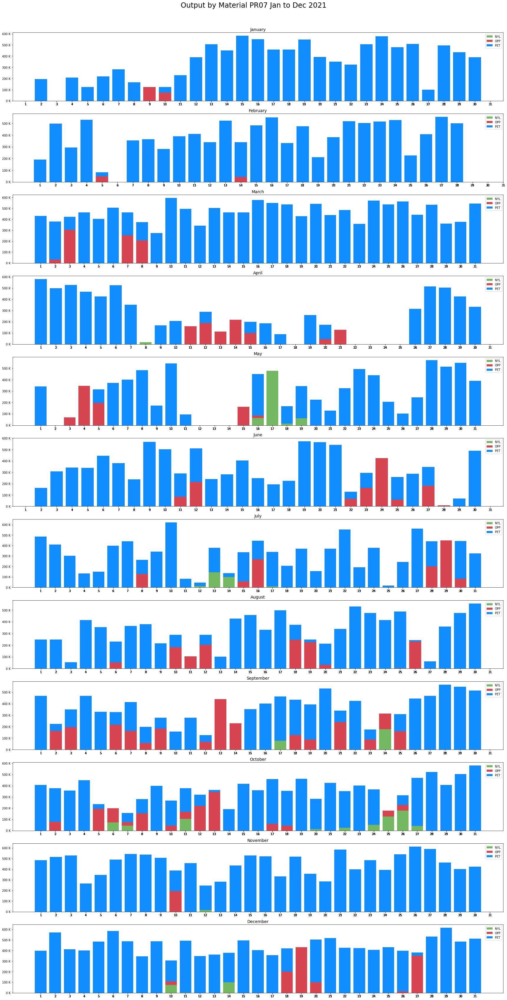

In [107]:
op_pr= op[op['MachineID']=='PR07'].pivot_table(values='Output',index=['Date','Month'],columns='FILM',aggfunc='sum', fill_value=0).reset_index().rename_axis(None, axis=1)
op_pr['Date'] = op_pr['Date'].dt.day

fig, ax = plt.subplots(nrows=12,ncols=1,figsize=(24, 48))
for i in range(12):
  ax[i].bar(op_pr[op_pr['Month']==i+1]['Date'], op_pr[op_pr['Month']==i+1]['NYL'], label='NYL',color='#73b761')
  ax[i].bar(op_pr[op_pr['Month']==i+1]['Date'], op_pr[op_pr['Month']==i+1]['OPP'], 
              bottom=op_pr[op_pr['Month']==i+1]['NYL'],label='OPP',color='#d64550')
  ax[i].bar(op_pr[op_pr['Month']==i+1]['Date'], op_pr[op_pr['Month']==i+1]['PET'], 
              bottom=op_pr[op_pr['Month']==i+1]['NYL']+np.array(op_pr[op_pr['Month']==i+1]['OPP']),label='PET',color='#118dff')
  ax[i].yaxis.set_major_formatter(thousand_formatter)
  ax[i].set_xticks(op_pr['Date'])
  ax[i].legend()
  ax[i].set_title(calendar.month_name[i+1],fontsize=14)

fig.suptitle('Output by Material PR07 Jan to Dec 2021',fontsize=24)
# Tight layout often produces nice results
# but requires the title to be spaced accordingly
fig.tight_layout()
fig.subplots_adjust(top=0.95)
plt.show()

## **6. Downtime by Material**

In [108]:
# downtime data by material per machine
down_pet= down[down['FILM']=='PET'].pivot_table(values='Downtime',index='MachineID',aggfunc='sum').reset_index()
down_nyl= down[down['FILM']=='NYL'].pivot_table(values='Downtime',index='MachineID',aggfunc='sum').reset_index()
down_opp= down[down['FILM']=='OPP'].pivot_table(values='Downtime',index='MachineID',aggfunc='sum').reset_index()

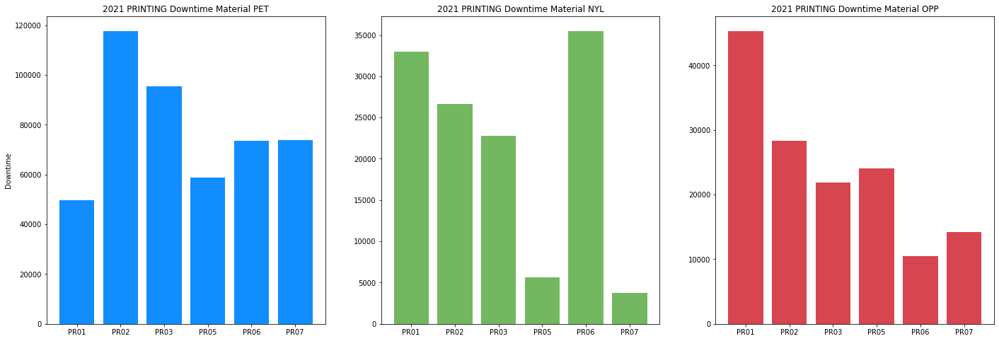

In [109]:
# plotting Downtime by material per machine
f, axarr = plt.subplots(nrows=1,ncols=3,figsize=(24, 8))

# plot material PET
plt.sca(axarr[0]);
plt.bar(down_pet['MachineID'],down_pet['Downtime'], color='#118dff')
plt.ylabel('Downtime')
plt.title('2021 PRINTING Downtime Material PET')

# plot material NYL
plt.sca(axarr[1]);
plt.bar(down_nyl['MachineID'],down_nyl['Downtime'],color='#73b761')
plt.title('2021 PRINTING Downtime Material NYL')

# plot material OPP
plt.sca(axarr[2]);
plt.bar(down_opp['MachineID'],down_opp['Downtime'],color='#d64550')
plt.title('2021 PRINTING Downtime Material OPP')

plt.show()

In [110]:
# downtime data by material per breakdown code
down_pet= down[down['FILM']=='PET'].pivot_table(values='Downtime',index='Breakdown',aggfunc='sum').reset_index()
down_nyl= down[down['FILM']=='NYL'].pivot_table(values='Downtime',index='Breakdown',aggfunc='sum').reset_index()
down_opp= down[down['FILM']=='OPP'].pivot_table(values='Downtime',index='Breakdown',aggfunc='sum').reset_index()

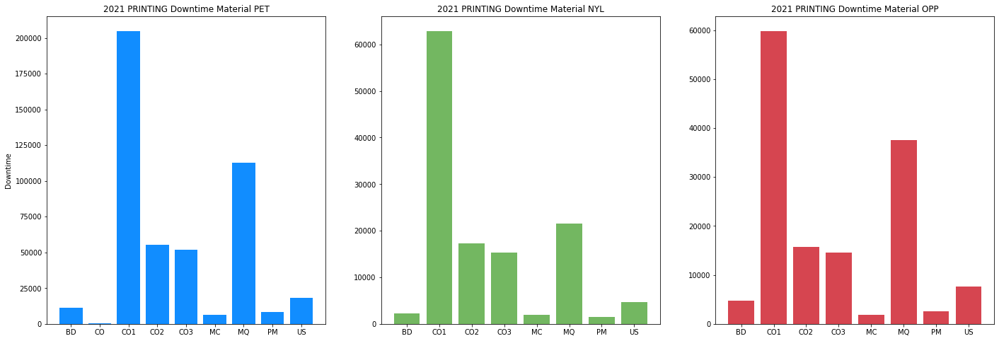

In [111]:
# plotting Downtime by material breakdown code
f, axarr = plt.subplots(nrows=1,ncols=3,figsize=(24, 8))

# plot material PET
plt.sca(axarr[0]);
plt.bar(down_pet['Breakdown'],down_pet['Downtime'], color='#118dff')
plt.ylabel('Downtime')
plt.title('2021 PRINTING Downtime Material PET')

# plot material NYL
plt.sca(axarr[1]);
plt.bar(down_nyl['Breakdown'],down_nyl['Downtime'],color='#73b761')
plt.title('2021 PRINTING Downtime Material NYL')

# plot material OPP
plt.sca(axarr[2]);
plt.bar(down_opp['Breakdown'],down_opp['Downtime'],color='#d64550')
plt.title('2021 PRINTING Downtime Material OPP')

plt.show()

### **Line Plot**

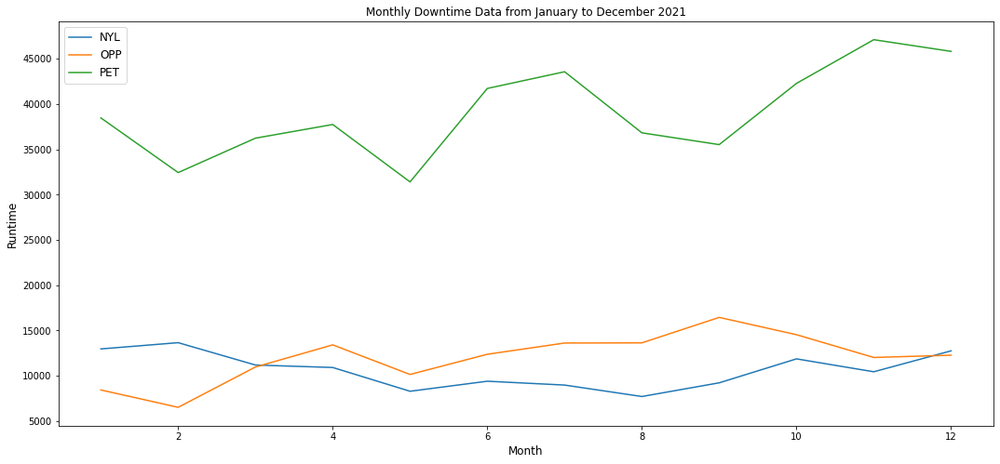

In [112]:
# plotting daily runtime per material
down_monthly.plot('Month',['NYL','OPP','PET'],figsize=(18 , 8)).legend(loc='best', fontsize=12)
plt.xlabel('Month', fontsize=12)
plt.ylabel('Runtime', fontsize=12)
plt.title('Monthly Downtime Data from January to December 2021', fontsize=12)
plt.show()

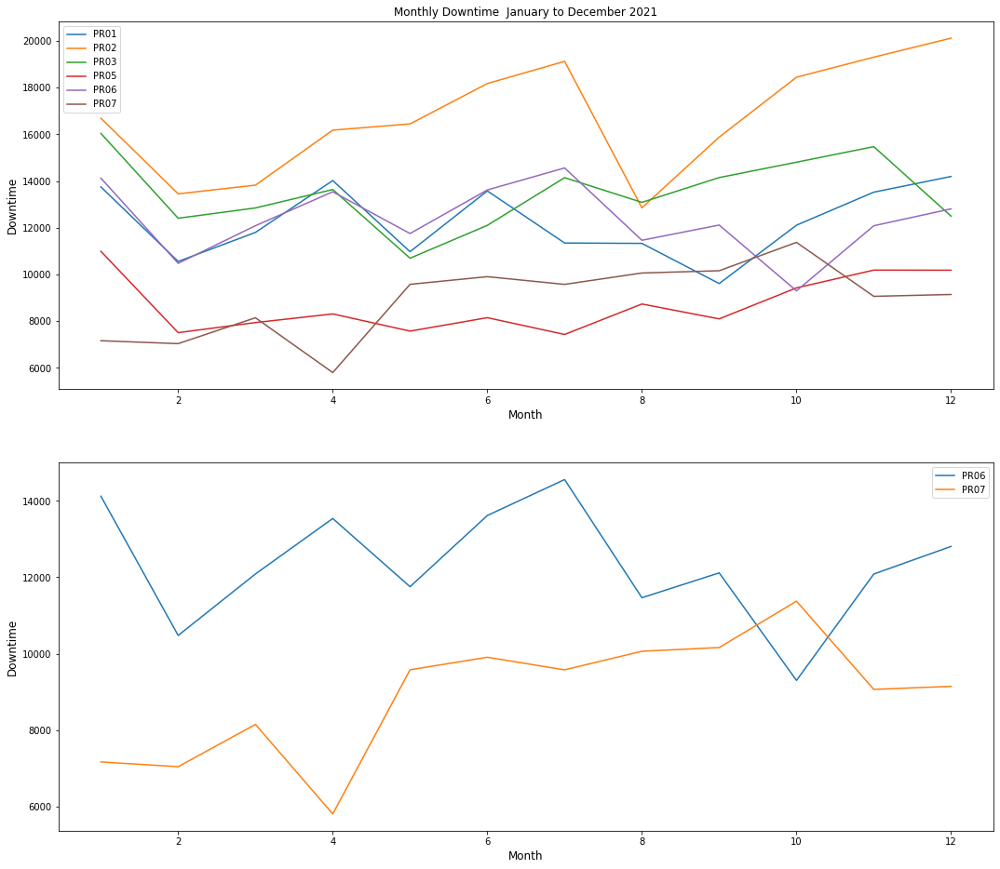

In [113]:
# plotting daily Downtime by machine
f, ax = plt.subplots(nrows=2,ncols=1,figsize=(18, 16))
line1, = ax[0].plot(dmc_monthly['Month'],dmc_monthly['PR01'],label='PR01')
line2, = ax[0].plot(dmc_monthly['Month'],dmc_monthly['PR02'],label='PR02')
line3, = ax[0].plot(dmc_monthly['Month'],dmc_monthly['PR03'],label='PR03')
line5, = ax[0].plot(dmc_monthly['Month'],dmc_monthly['PR05'],label='PR05')
line6, = ax[0].plot(dmc_monthly['Month'],dmc_monthly['PR06'],label='PR06')
line7, = ax[0].plot(dmc_monthly['Month'],dmc_monthly['PR07'],label='PR07')
ax[0].legend()
ax[0].set_xlabel('Month', fontsize=12)
ax[0].set_ylabel('Downtime', fontsize=12)
ax[0].set_title('Monthly Downtime  January to December 2021', fontsize=12)

line1, = ax[1].plot(dmc_monthly['Month'],dmc_monthly['PR06'],label='PR06')
line2, = ax[1].plot(dmc_monthly['Month'],dmc_monthly['PR07'],label='PR07')
ax[1].legend()
ax[1].set_xlabel('Month', fontsize=12)
ax[1].set_ylabel('Downtime', fontsize=12)
plt.show()

# **Hiearchical Forecasting for Daily Runtime per Material**

## **Hierarchy Definition**

In [273]:
for col in run_daily.columns:
    val = run_daily[col].mean()
    run_daily[col] = run_daily[col].replace(0, val)
films = ['PET','NYL','OPP']

# Hierarchy defintion
rows_list = [];
for f in films:
  if(f in run_daily.columns):
    rows_list.append([f,'RunTime']);
            
lLevels = ['FILM' , 'RunTime'];
lHierarchy = {};
lHierarchy['Levels'] = lLevels;
lHierarchy['Data'] = pd.DataFrame(rows_list, columns =  lLevels);
lHierarchy['Type'] = "Hierarchical";

In [274]:
lHierarchy

{'Data':   FILM  RunTime
 0  PET  RunTime
 1  NYL  RunTime
 2  OPP  RunTime, 'Levels': ['FILM', 'RunTime'], 'Type': 'Hierarchical'}

INFO:pyaf.std:START_HIERARCHICAL_PLOTTING


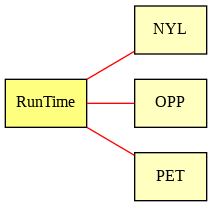

INFO:pyaf.std:END_HIERARCHICAL_PLOTTING_TIME_IN_SECONDS 0.08494710922241211


In [275]:
# create a model to plot the hierarchy.
import pyaf.HierarchicalForecastEngine as hautof
lEngine = hautof.cHierarchicalForecastEngine()

lSignalHierarchy = lEngine.plot_Hierarchy(run_daily, "Date", "Signal", 1, 
                                          lHierarchy, None);

## **Hierarchical Modelling**

In [276]:
# define 6 months train data and 6 months test data
run_daily['MonthNo'] = run_daily['Date'].dt.month
train = run_daily[run_daily['MonthNo']<=6].drop(columns=['MonthNo'])
test = run_daily[run_daily['MonthNo']>6].drop(columns=['MonthNo'])
run_daily = run_daily.drop(columns='MonthNo')

In [277]:
# create a hierarchical model and train it
import pyaf.HierarchicalForecastEngine as hautof

# define the model
lEngine = hautof.cHierarchicalForecastEngine()
# hierarchical method (BU for Bottom-Up, TD for Top-Down, MO for Middle-Out, OC for Optimal Combination, default: BU)
# lEngine.mOptions.mHierarchicalCombinationMethod = ['BU','OC']


In [278]:
lDateColumn = 'Date'
lSignalVar = 'RunTime';

# train the model
lSignalHierarchy = lEngine.train(train , lDateColumn, lSignalVar, len(test), lHierarchy, None);

INFO:pyaf.std:START_HIERARCHICAL_TRAINING
INFO:pyaf.std:START_TRAINING '['NYL', 'OPP', 'PET', 'RunTime']'
INFO:pyaf.std:END_TRAINING_TIME_IN_SECONDS '['NYL', 'OPP', 'PET', 'RunTime']' 37.80915307998657
INFO:pyaf.hierarchical:TRAINING_HIERARCHICAL_MODEL_COMPUTE_TOP_DOWN_HISTORICAL_PROPORTIONS
INFO:pyaf.std:START_FORECASTING '['NYL', 'OPP', 'PET', 'RunTime']'
INFO:pyaf.std:END_FORECAST_TIME_IN_SECONDS  '['NYL', 'OPP', 'PET', 'RunTime']' 19.131474256515503
INFO:pyaf.hierarchical:FORECASTING_HIERARCHICAL_MODEL_COMBINATION_METHODS ['BU']
INFO:pyaf.hierarchical:FORECASTING_HIERARCHICAL_MODEL_BOTTOM_UP_METHOD BU
INFO:pyaf.hierarchical:FORECASTING_HIERARCHICAL_MODEL_OPTIMAL_COMBINATION_METHOD
INFO:pyaf.hierarchical:STRUCTURE [0, 1]
INFO:pyaf.hierarchical:DATASET_COLUMNS Index(['Date', 'NYL', 'NYL_Forecast', 'NYL_Forecast_Lower_Bound',
       'NYL_Forecast_Upper_Bound', 'OPP', 'OPP_Forecast',
       'OPP_Forecast_Lower_Bound', 'OPP_Forecast_Upper_Bound', 'PET',
       'PET_Forecast', 'PET_Forec

In [279]:
lInfo = lEngine.to_dict()
# model performance
perfs = [];
for model in sorted(lInfo['Models'].keys()):
    lPerf = lInfo['Models'][model]['Model_Performance']
    perfs.append([model , lPerf['RMSE'] , lPerf['MAPE']])
df_perf = pd.DataFrame(perfs , columns=['Model' , 'RMSE' , 'MAPE']);
df_perf = df_perf.sort_values(by = ['MAPE'])
print(df_perf)

     Model               RMSE    MAPE
3  RunTime  738.2574867690182  0.1322
2      PET   740.850563424192  0.2191
1      OPP  964.6401945334583  0.8403
0      NYL   741.795788382917  1.0137


INFO:pyaf.std:START_HIERARCHICAL_PLOTTING


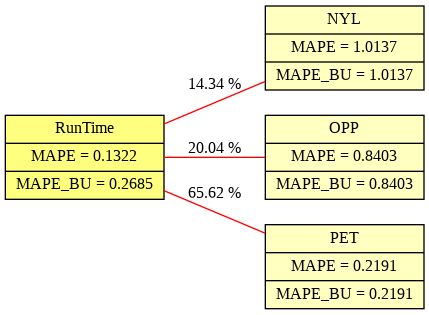

INFO:pyaf.std:END_HIERARCHICAL_PLOTTING_TIME_IN_SECONDS 0.09302592277526855


In [280]:
#plotting model performance
lEngine.mSignalHierarchy.plot()

In [281]:
# runtime forecast performance for PET
pet_engine = lEngine.mSignalHierarchy.mModels.mSignalDecomposition.mBestModels['PET']
pet_engine.to_dict()

{'Dataset': {'Signal': 'PET',
  'Time': {'Horizon': 183,
   'TimeMinMax': ['2021-01-02 00:00:00', '2021-06-30 00:00:00'],
   'TimeVariable': 'Date'},
  'Training_Signal_Length': 176},
 'Model': {'AR_Model': 'AR',
  'Best_Decomposition': '_PET_ConstantTrend_residue_Seasonal_WeekOfYear_residue_AR(44)',
  'Cycle': 'Seasonal_WeekOfYear',
  'Signal_Transoformation': 'NoTransf',
  'Trend': 'ConstantTrend'},
 'Model_Performance': {'COMPLEXITY': '71',
  'CRPS': '191.6448478363357',
  'LnQ': '12.546089954549874',
  'MAE': '592.6415998031388',
  'MAPE': '0.2191',
  'MASE': '0.6976',
  'MedAE': '532.1943088940284',
  'RMSE': '740.850563424192'}}

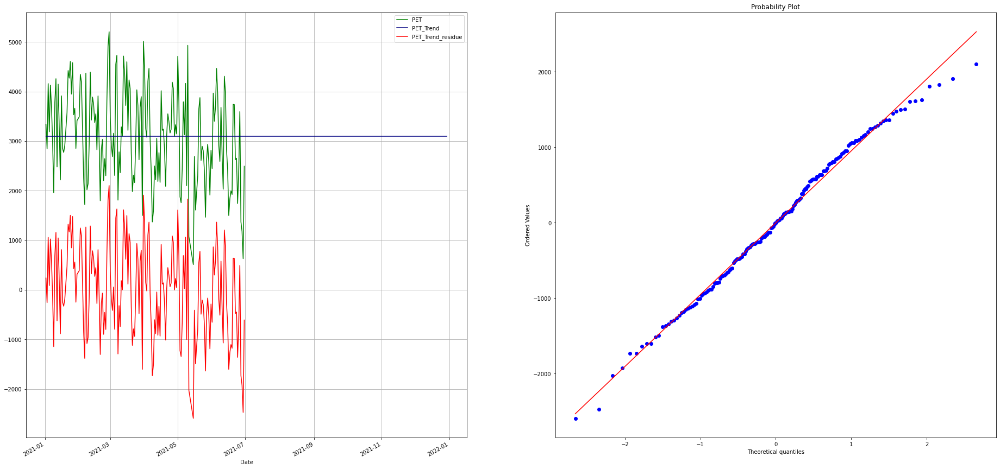

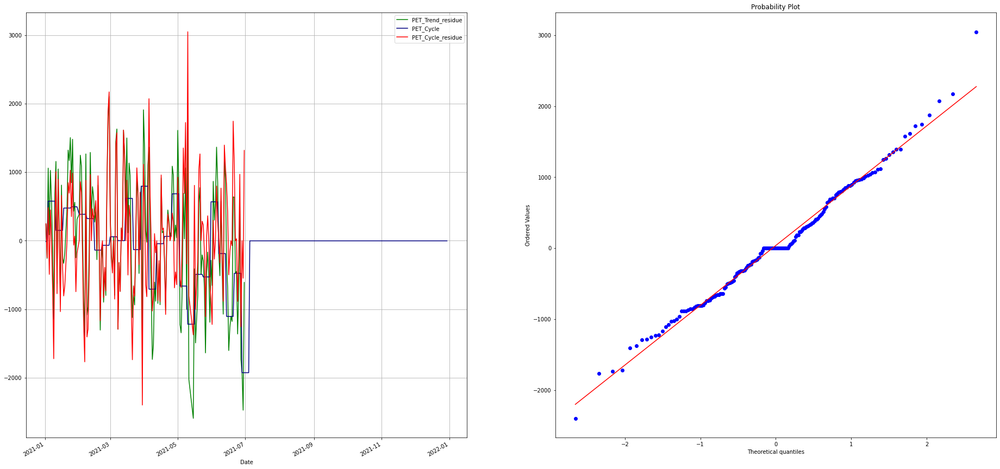

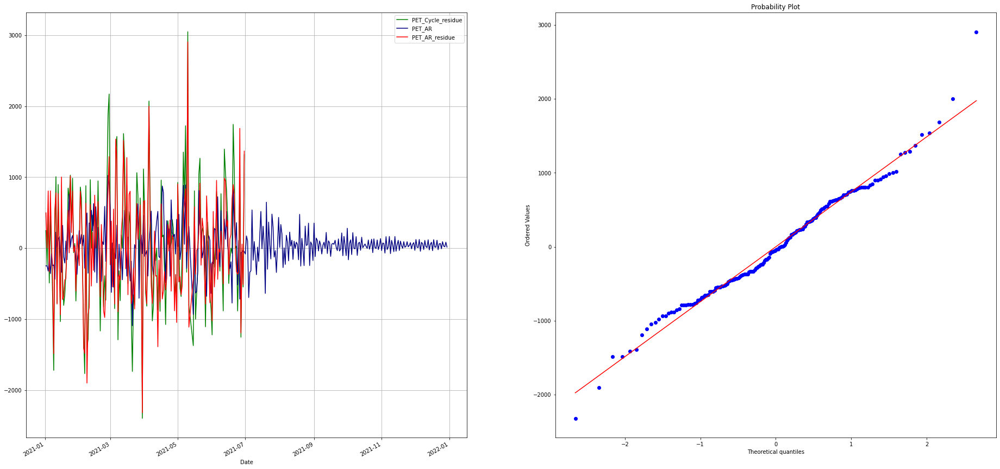

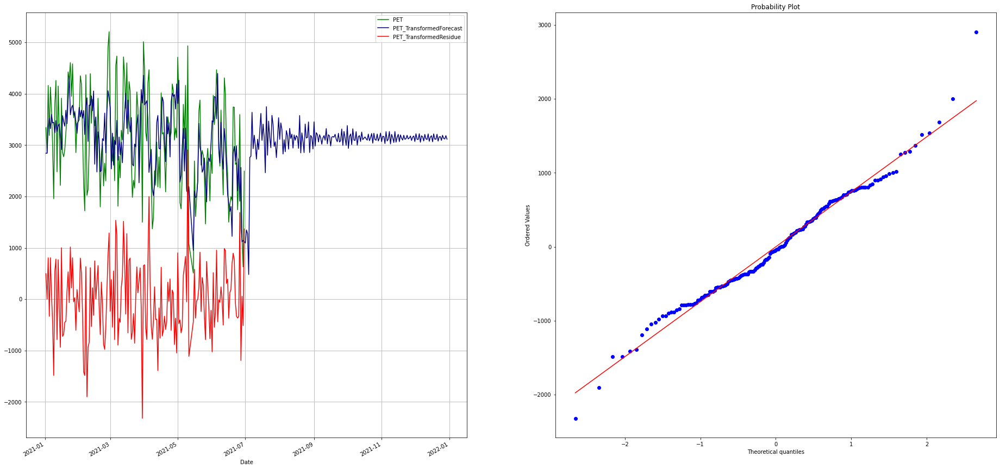

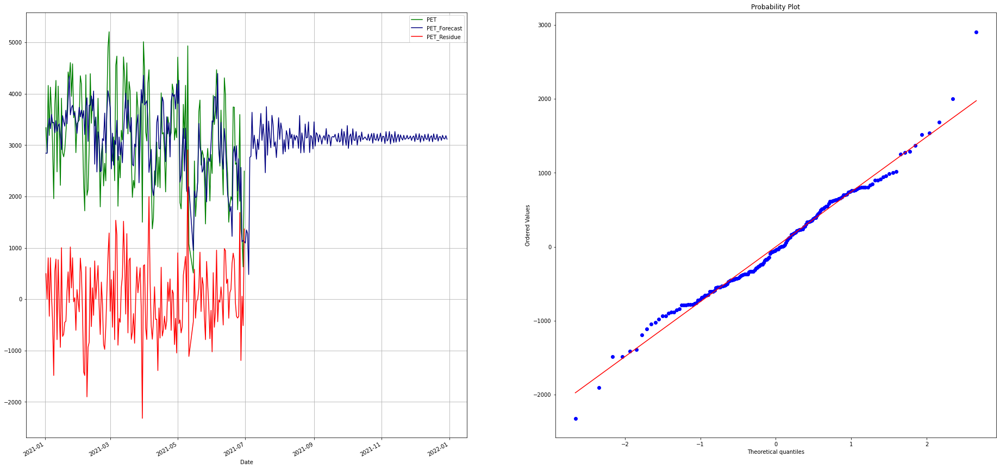

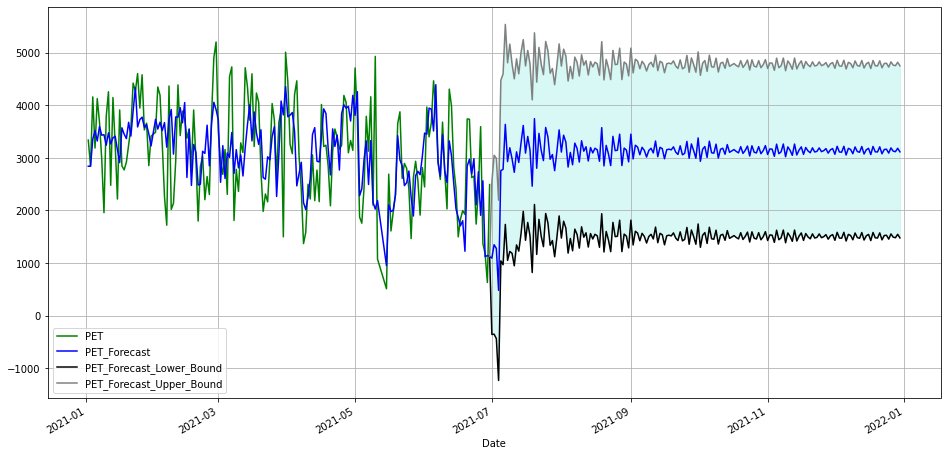

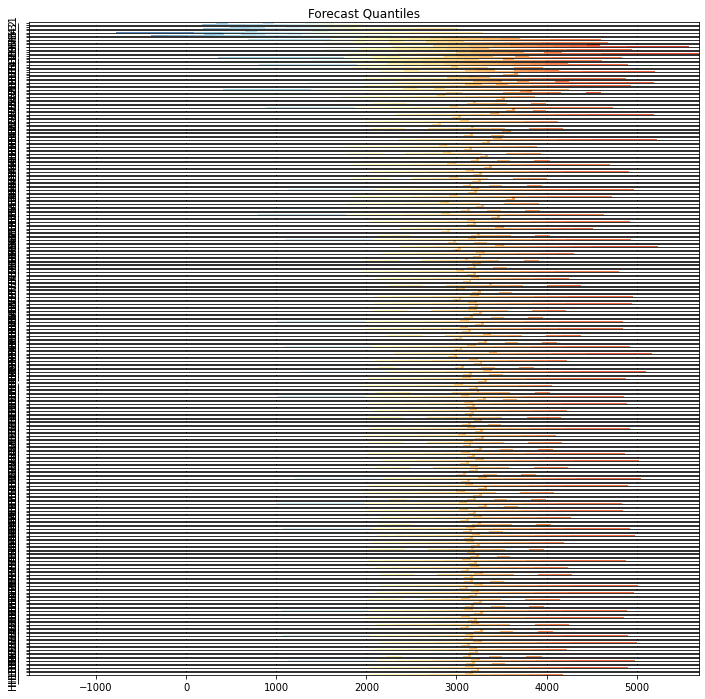

In [282]:
pet_engine.standardPlots()

In [283]:
# runtime forecast performance for NYL
nyl_engine = lEngine.mSignalHierarchy.mModels.mSignalDecomposition.mBestModels['NYL']
nyl_engine.to_dict()

{'Dataset': {'Signal': 'NYL',
  'Time': {'Horizon': 183,
   'TimeMinMax': ['2021-01-02 00:00:00', '2021-06-30 00:00:00'],
   'TimeVariable': 'Date'},
  'Training_Signal_Length': 176},
 'Model': {'AR_Model': 'NoAR',
  'Best_Decomposition': 'Diff_NYL_ConstantTrend_residue_bestCycle_byMAPE_residue_NoAR',
  'Cycle': 'Cycle_None',
  'Signal_Transoformation': 'Difference',
  'Trend': 'ConstantTrend'},
 'Model_Performance': {'COMPLEXITY': '1',
  'CRPS': '148.5917524123867',
  'LnQ': '575.3023845848707',
  'MAE': '572.0384929153525',
  'MAPE': '1.0137',
  'MASE': '1.2357',
  'MedAE': '477.8409090909091',
  'RMSE': '741.795788382917'}}

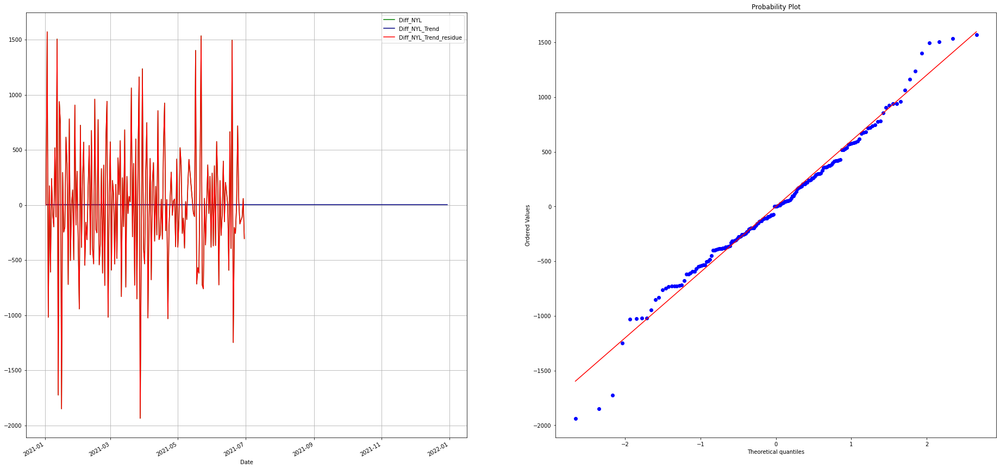

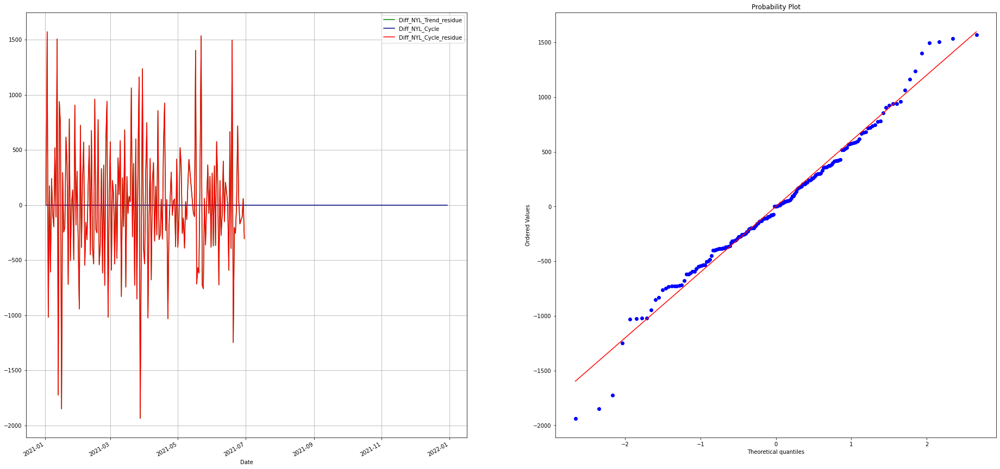

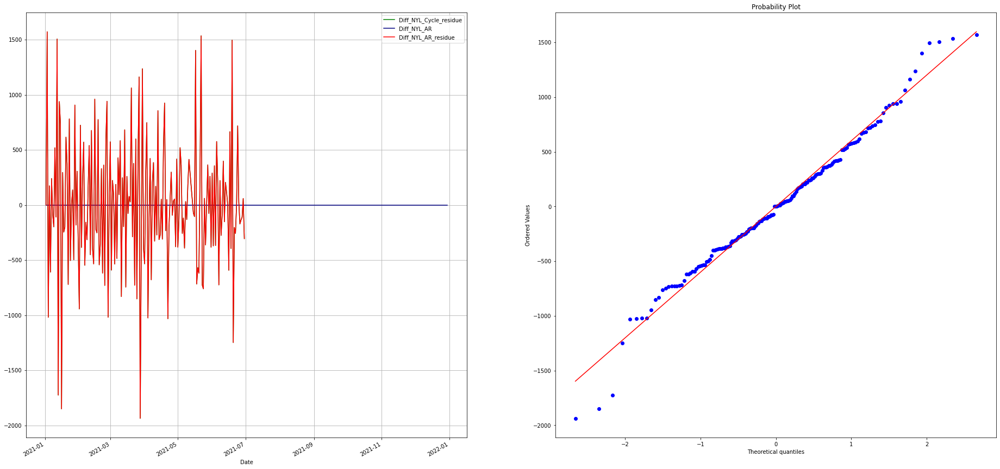

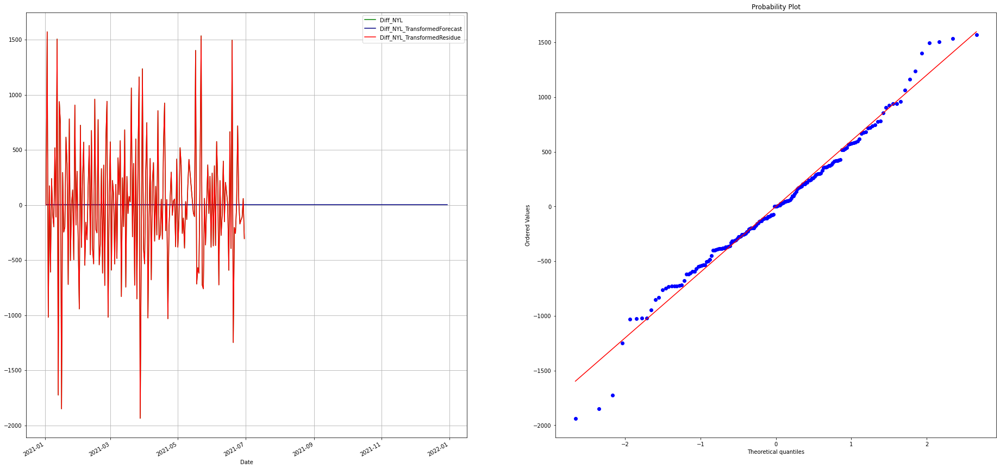

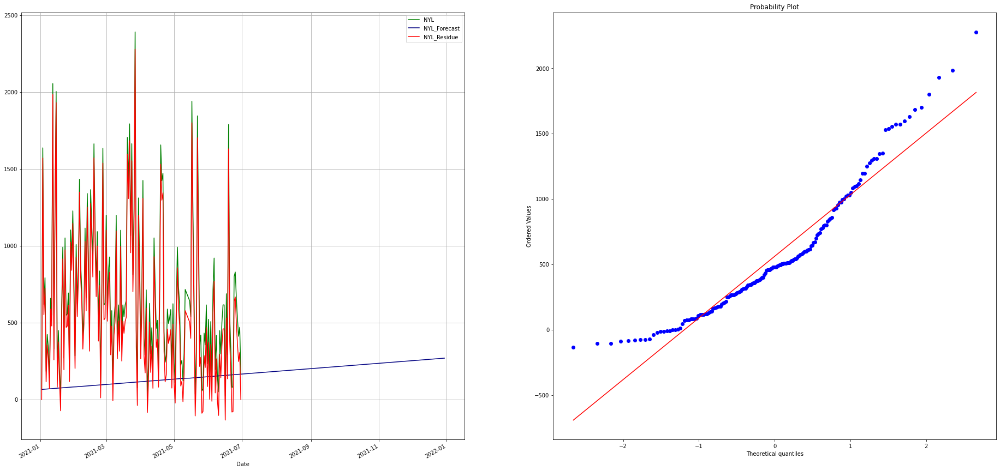

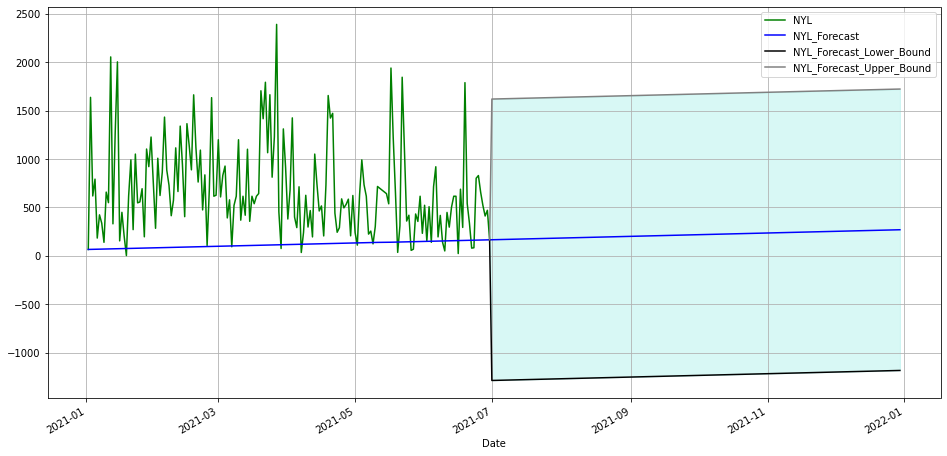

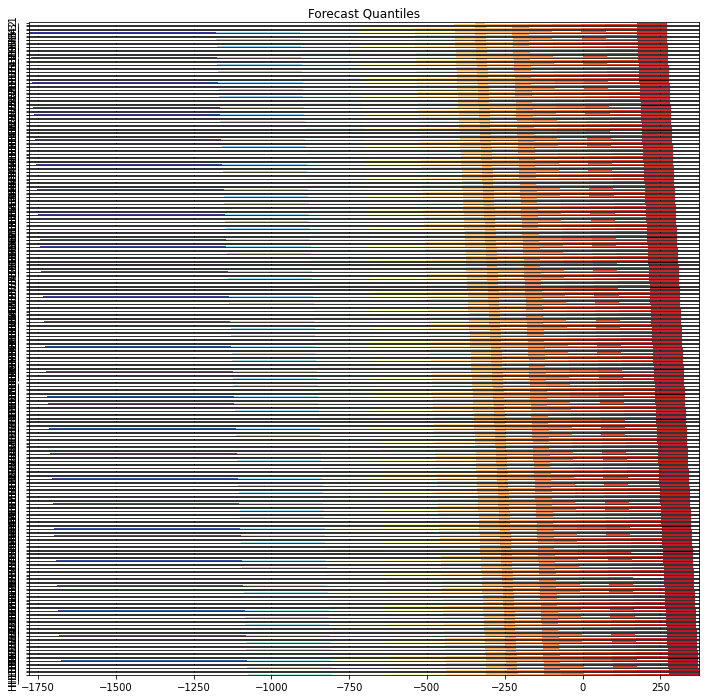

In [284]:
nyl_engine.standardPlots()

In [285]:
# runtime forecast performance for OPP
opp_engine = lEngine.mSignalHierarchy.mModels.mSignalDecomposition.mBestModels['OPP']
opp_engine.to_dict()

{'Dataset': {'Signal': 'OPP',
  'Time': {'Horizon': 183,
   'TimeMinMax': ['2021-01-02 00:00:00', '2021-06-30 00:00:00'],
   'TimeVariable': 'Date'},
  'Training_Signal_Length': 176},
 'Model': {'AR_Model': 'NoAR',
  'Best_Decomposition': 'RelDiff_OPP_ConstantTrend_residue_bestCycle_byMAPE_residue_NoAR',
  'Cycle': 'Cycle',
  'Signal_Transoformation': 'RelativeDifference',
  'Trend': 'ConstantTrend'},
 'Model_Performance': {'COMPLEXITY': '6',
  'CRPS': '186.55821026274762',
  'LnQ': '415.1132333406737',
  'MAE': '748.6409102624074',
  'MAPE': '0.8403',
  'MASE': '1.2683',
  'MedAE': '649.1872913827146',
  'RMSE': '964.6401945334583'}}

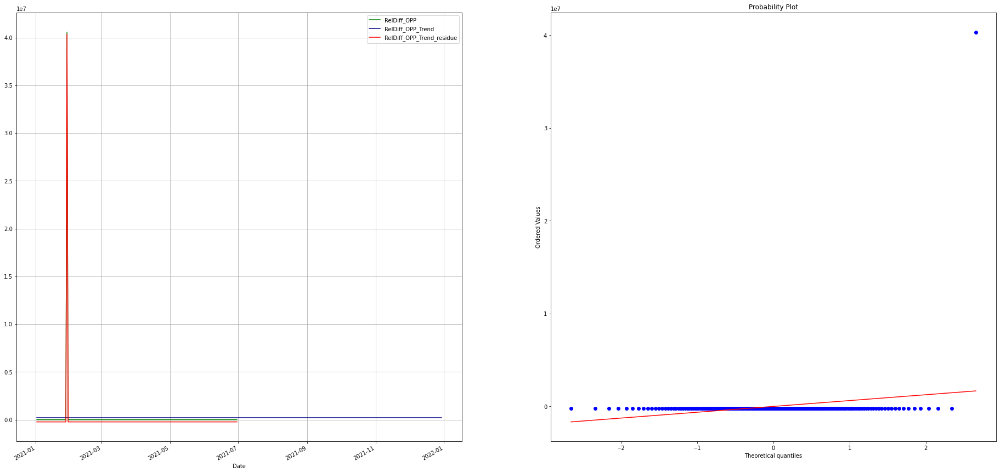

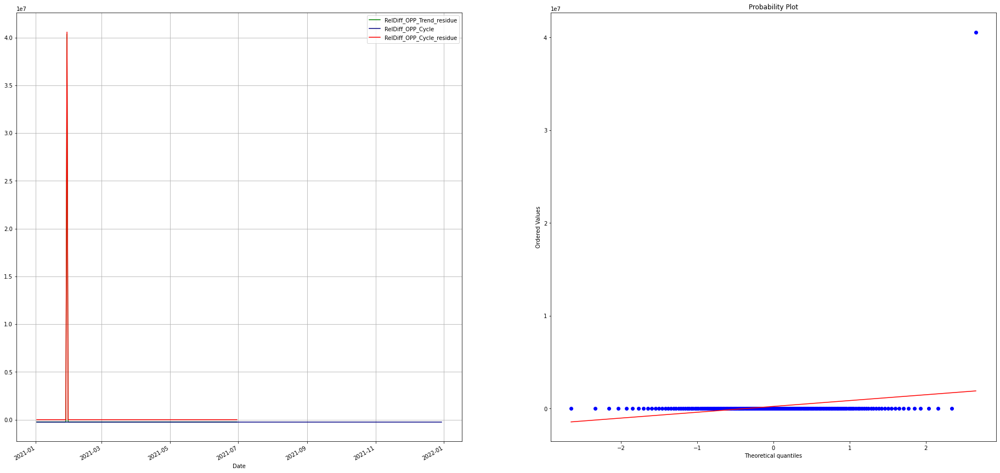

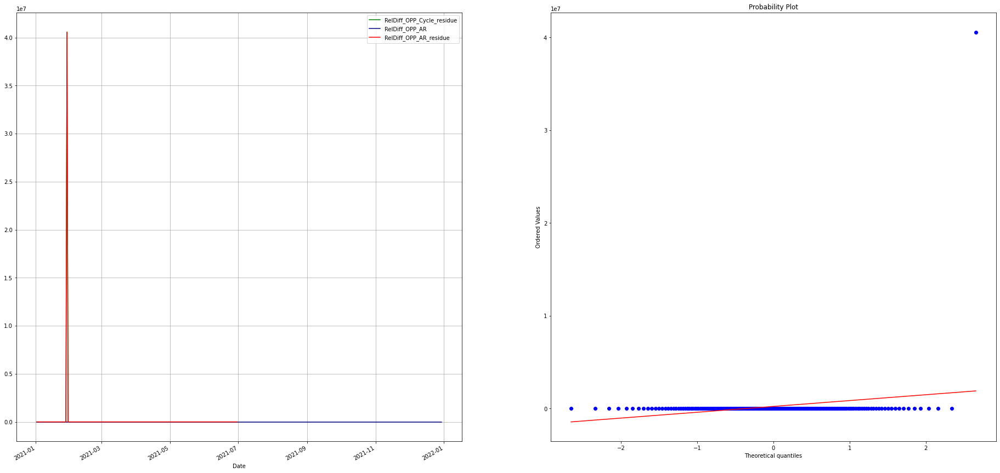

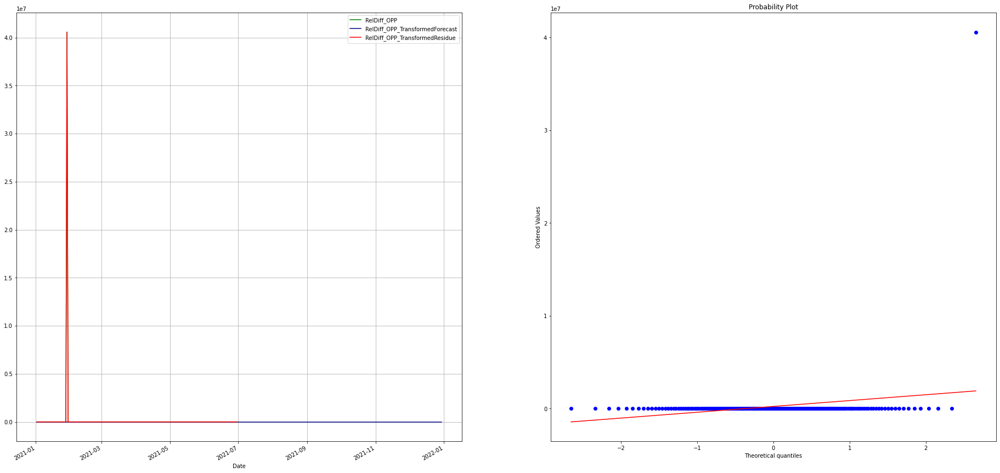

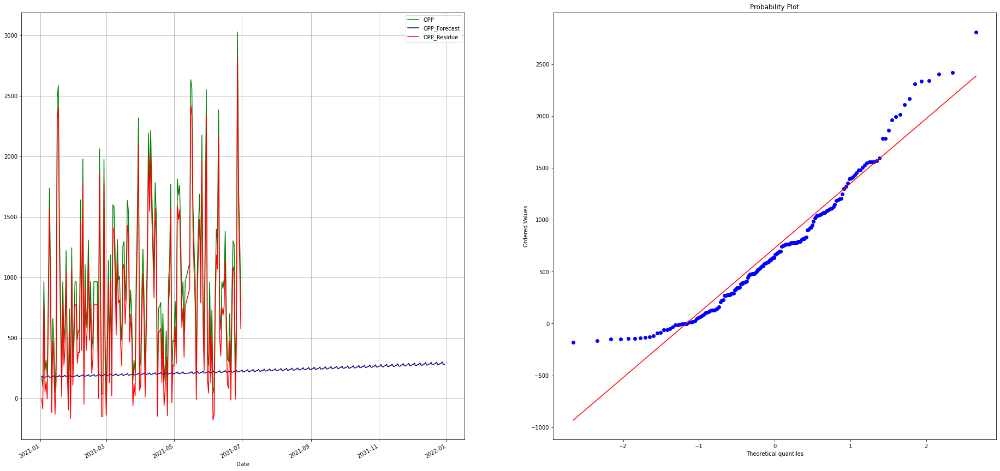

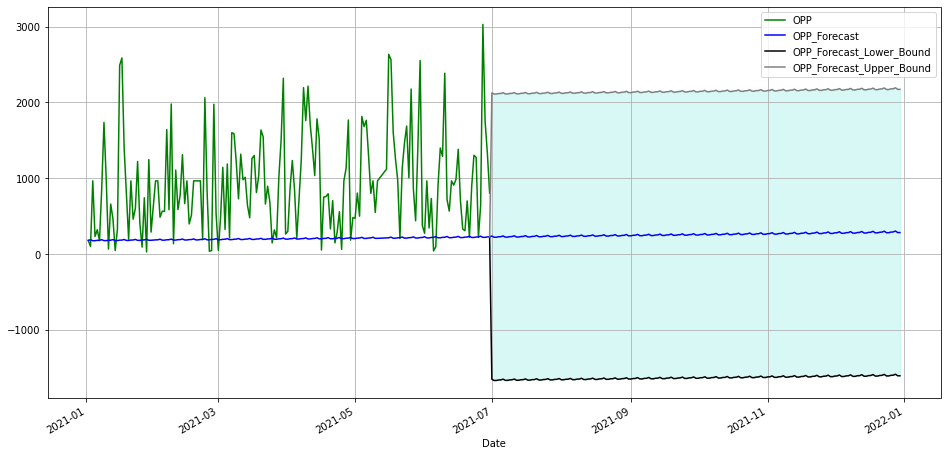

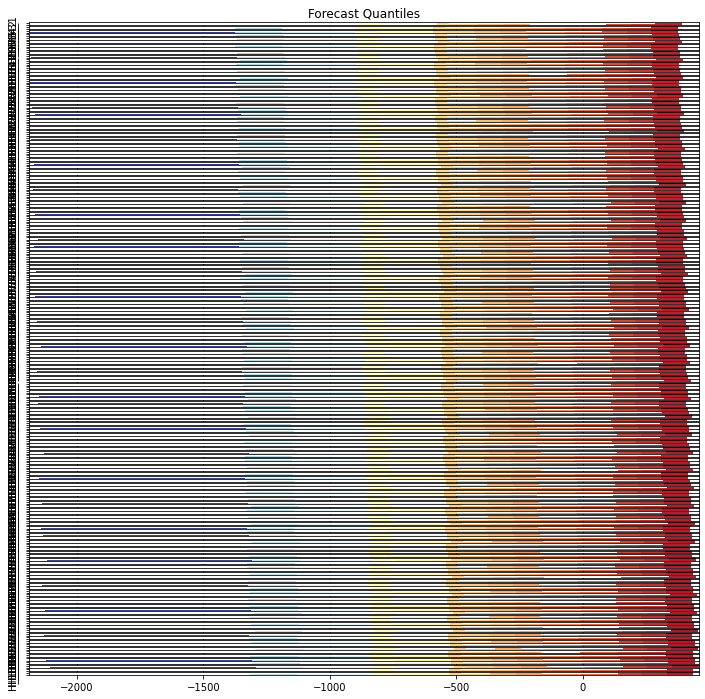

In [286]:
opp_engine.standardPlots()

## **Forecast**

In [287]:
dfapp_out = lEngine.forecast(test, 1);

INFO:pyaf.std:START_HIERARCHICAL_FORECASTING
INFO:pyaf.std:START_FORECASTING '['NYL', 'OPP', 'PET', 'RunTime']'
INFO:pyaf.std:END_FORECAST_TIME_IN_SECONDS  '['NYL', 'OPP', 'PET', 'RunTime']' 1.7486937046051025
INFO:pyaf.hierarchical:FORECASTING_HIERARCHICAL_MODEL_COMBINATION_METHODS ['BU']
INFO:pyaf.hierarchical:FORECASTING_HIERARCHICAL_MODEL_BOTTOM_UP_METHOD BU
INFO:pyaf.std:END_HIERARCHICAL_FORECAST_TIME_IN_SECONDS 1.7633402347564697


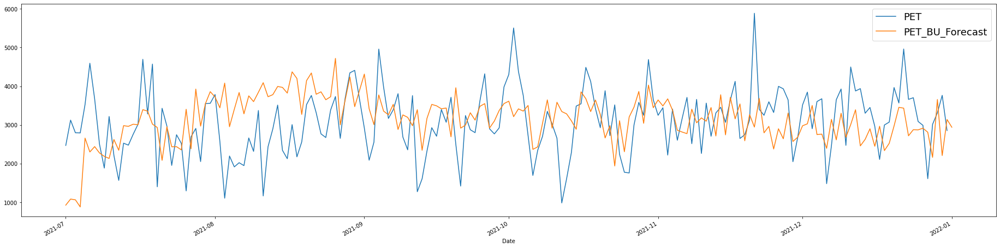

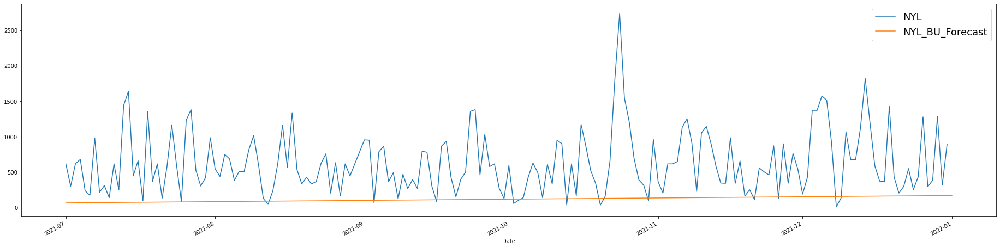

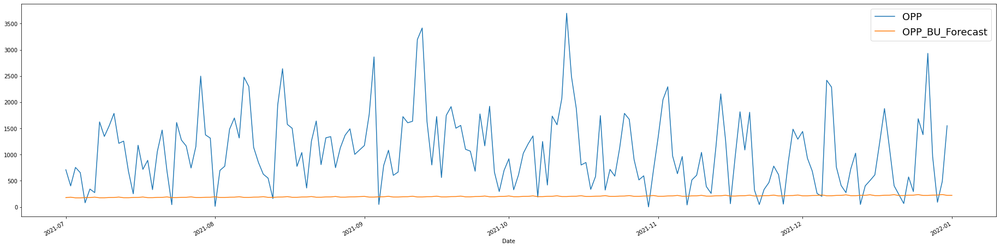

In [288]:
for f in films:
    dfapp_out.plot('Date',[f, f + '_BU_Forecast'],  figsize=(32 , 8)).legend(fontsize=18)

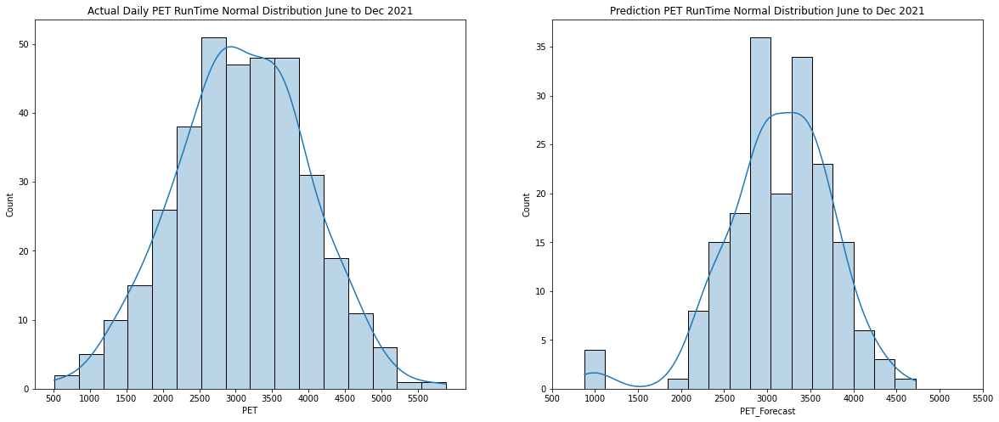

In [289]:
f, axarr = plt.subplots(nrows=1,ncols=2,figsize=(20, 8))
# plot actual data
sns.histplot(run_daily['PET'], ax = axarr[0],kde=True,alpha=0.3)
axarr[0].set_title('Actual Daily PET RunTime Normal Distribution June to Dec 2021')
axarr[0].set_xticks(np.arange(start=500,stop=6000,step=500))

# plot forecasted data
sns.histplot(dfapp_out['PET_Forecast'], ax = axarr[1],kde=True,alpha=0.3)
axarr[1].set_title('Prediction PET RunTime Normal Distribution June to Dec 2021')
axarr[1].set_xticks(np.arange(start=500,stop=6000,step=500))

plt.show()

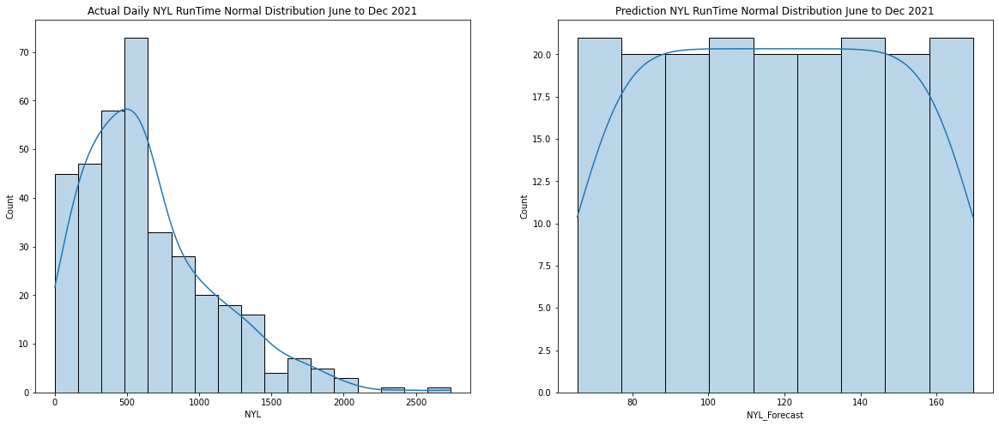

In [290]:
f, axarr = plt.subplots(nrows=1,ncols=2,figsize=(20, 8))
# plot actual data
sns.histplot(run_daily['NYL'], ax = axarr[0],kde=True,alpha=0.3)
axarr[0].set_title('Actual Daily NYL RunTime Normal Distribution June to Dec 2021')

# plot forecasted data
sns.histplot(dfapp_out['NYL_Forecast'], ax = axarr[1],kde=True,alpha=0.3)
axarr[1].set_title('Prediction NYL RunTime Normal Distribution June to Dec 2021')
plt.show()

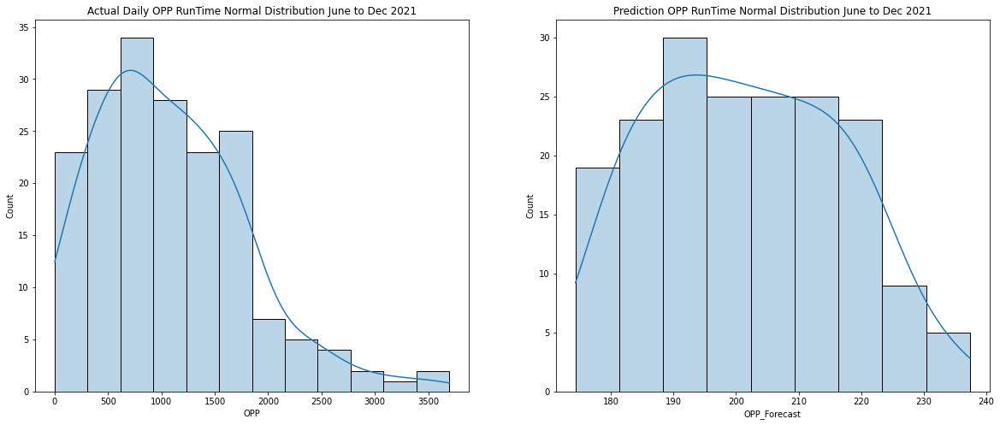

In [291]:
# plotting Speed normal dist per material

f, axarr = plt.subplots(nrows=1,ncols=2,figsize=(20, 8))
# plot actual data
sns.histplot(dfapp_out['OPP'], ax = axarr[0],kde=True,alpha=0.3)
axarr[0].set_title('Actual Daily OPP RunTime Normal Distribution June to Dec 2021')

# plot forecasted data
sns.histplot(dfapp_out['OPP_Forecast'], ax = axarr[1],kde=True,alpha=0.3)
axarr[1].set_title('Prediction OPP RunTime Normal Distribution June to Dec 2021')

plt.show()

# **Hiearchical Forecasting for Daily Speed per Material**

## **Hierarchy Definition**

In [212]:
# slicing daily speed data per material
speed_daily = run.pivot_table(values='SPEED', index='Date', columns='FILM', fill_value=0, aggfunc=np.mean)
speed_daily = speed_daily.reset_index().rename_axis(None, axis=1)

# remove unnecessary materials
speed_daily = speed_daily.drop(columns=['BOP','CPP','LIT','OTHER'])

In [213]:
speed_daily = speed_daily[(speed_daily != 0).all(1)]

,Date,NYL,OPP,PET
0,2021-01-02,262.630769,178.241573,329.732255
1,2021-01-03,314.148442,181.500000,273.385021
3,2021-01-05,219.950758,238.382609,355.614492
4,2021-01-06,213.890710,245.865204,328.015262
5,2021-01-07,220.312057,211.698864,335.926882
...,...,...,...,...
354,2021-12-27,293.982993,315.103683,283.542236
355,2021-12-28,270.335938,230.695426,393.845439
356,2021-12-29,264.273930,201.000000,358.617381
357,2021-12-30,244.406349,258.248460,331.938911


In [214]:
films = ['PET','NYL','OPP']

# Hierarchy defintion
rows_list = [];
for f in films:
  if(f in speed_daily.columns):
    rows_list.append([f,'SPEED']);
            
lLevels = ['FILM' , 'SPEED'];
lHierarchy = {};
lHierarchy['Levels'] = lLevels;
lHierarchy['Data'] = pd.DataFrame(rows_list, columns =  lLevels);
lHierarchy['Type'] = "Hierarchical";

In [215]:
lHierarchy

{'Data':   FILM  SPEED
 0  PET  SPEED
 1  NYL  SPEED
 2  OPP  SPEED, 'Levels': ['FILM', 'SPEED'], 'Type': 'Hierarchical'}

INFO:pyaf.std:START_HIERARCHICAL_PLOTTING


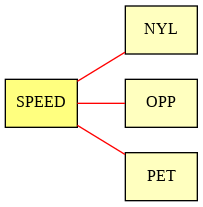

INFO:pyaf.std:END_HIERARCHICAL_PLOTTING_TIME_IN_SECONDS 0.07700276374816895


In [216]:
# create a model to plot the hierarchy.
import pyaf.HierarchicalForecastEngine as hautof
lEngine = hautof.cHierarchicalForecastEngine()

lSignalHierarchy = lEngine.plot_Hierarchy(speed_daily, "Date", "Signal", 1, 
                                          lHierarchy, None);

## **Hierarchical Modelling**

In [217]:
# define 9 months train data and 3 months test data
speed_daily['MonthNo'] = speed_daily['Date'].dt.month
train = speed_daily[speed_daily['MonthNo']<=6].drop(columns=['MonthNo'])
test = speed_daily[speed_daily['MonthNo']>6].drop(columns=['MonthNo'])

In [218]:
# create a hierarchical model and train it
import pyaf.HierarchicalForecastEngine as hautof

# define the model
lEngine = hautof.cHierarchicalForecastEngine()
# hierarchical method (BU for Bottom-Up, TD for Top-Down, MO for Middle-Out, OC for Optimal Combination, default: BU)
# lEngine.mOptions.mHierarchicalCombinationMethod = ['BU','OC']


In [220]:
lDateColumn = 'Date'
lSignalVar = 'RunTime';

# train the model
lSignalHierarchy = lEngine.train(train, lDateColumn, lSignalVar, len(test), lHierarchy, None);

INFO:pyaf.std:START_HIERARCHICAL_TRAINING
INFO:pyaf.std:START_TRAINING '['NYL', 'OPP', 'PET', 'SPEED']'
INFO:pyaf.std:END_TRAINING_TIME_IN_SECONDS '['NYL', 'OPP', 'PET', 'SPEED']' 29.751834869384766
INFO:pyaf.hierarchical:TRAINING_HIERARCHICAL_MODEL_COMPUTE_TOP_DOWN_HISTORICAL_PROPORTIONS
INFO:pyaf.std:START_FORECASTING '['NYL', 'OPP', 'PET', 'SPEED']'
INFO:pyaf.std:END_FORECAST_TIME_IN_SECONDS  '['NYL', 'OPP', 'PET', 'SPEED']' 8.07184910774231
INFO:pyaf.hierarchical:FORECASTING_HIERARCHICAL_MODEL_COMBINATION_METHODS ['BU']
INFO:pyaf.hierarchical:FORECASTING_HIERARCHICAL_MODEL_BOTTOM_UP_METHOD BU
INFO:pyaf.hierarchical:FORECASTING_HIERARCHICAL_MODEL_OPTIMAL_COMBINATION_METHOD
INFO:pyaf.hierarchical:STRUCTURE [0, 1]
INFO:pyaf.hierarchical:DATASET_COLUMNS Index(['Date', 'NYL', 'NYL_Forecast', 'NYL_Forecast_Lower_Bound',
       'NYL_Forecast_Upper_Bound', 'OPP', 'OPP_Forecast',
       'OPP_Forecast_Lower_Bound', 'OPP_Forecast_Upper_Bound', 'PET',
       'PET_Forecast', 'PET_Forecast_Lower

In [221]:
lInfo = lEngine.to_dict()
# model performance
perfs = [];
for model in sorted(lInfo['Models'].keys()):
    lPerf = lInfo['Models'][model]['Model_Performance']
    perfs.append([model , lPerf['RMSE'] , lPerf['MAPE']])
df_perf = pd.DataFrame(perfs , columns=['Model' , 'RMSE' , 'MAPE']);
df_perf = df_perf.sort_values(by = ['MAPE'])
print(df_perf)

   Model                RMSE    MAPE
3  SPEED    63.4505810054167  0.0538
2    PET  28.844726175298995   0.062
0    NYL   45.66670916015107  0.1209
1    OPP   45.67142111673027  0.1359


INFO:pyaf.std:START_HIERARCHICAL_PLOTTING


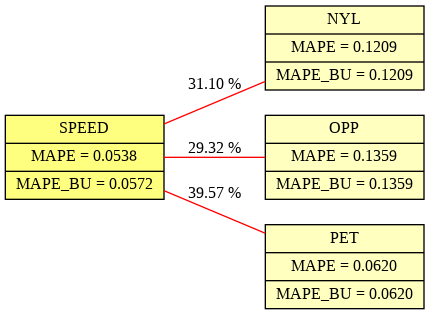

INFO:pyaf.std:END_HIERARCHICAL_PLOTTING_TIME_IN_SECONDS 0.08499908447265625


In [222]:
#plotting model performance
lEngine.mSignalHierarchy.plot()

In [223]:
# runtime forecast performance for PET
pet_engine = lEngine.mSignalHierarchy.mModels.mSignalDecomposition.mBestModels['PET']
pet_engine.to_dict()

{'Dataset': {'Signal': 'PET',
  'Time': {'Horizon': 172,
   'TimeMinMax': ['2021-01-02 00:00:00', '2021-06-30 00:00:00'],
   'TimeVariable': 'Date'},
  'Training_Signal_Length': 153},
 'Model': {'AR_Model': 'NoAR',
  'Best_Decomposition': '_PET_ConstantTrend_residue_Seasonal_WeekOfYear_residue_NoAR',
  'Cycle': 'Seasonal_WeekOfYear',
  'Signal_Transoformation': 'NoTransf',
  'Trend': 'ConstantTrend'},
 'Model_Performance': {'COMPLEXITY': '27',
  'CRPS': '5.5675719468748905',
  'LnQ': '1.2421780923951244',
  'MAE': '19.896289075973318',
  'MAPE': '0.062',
  'MASE': '0.664',
  'MedAE': '16.129175190497733',
  'RMSE': '28.844726175298995'}}

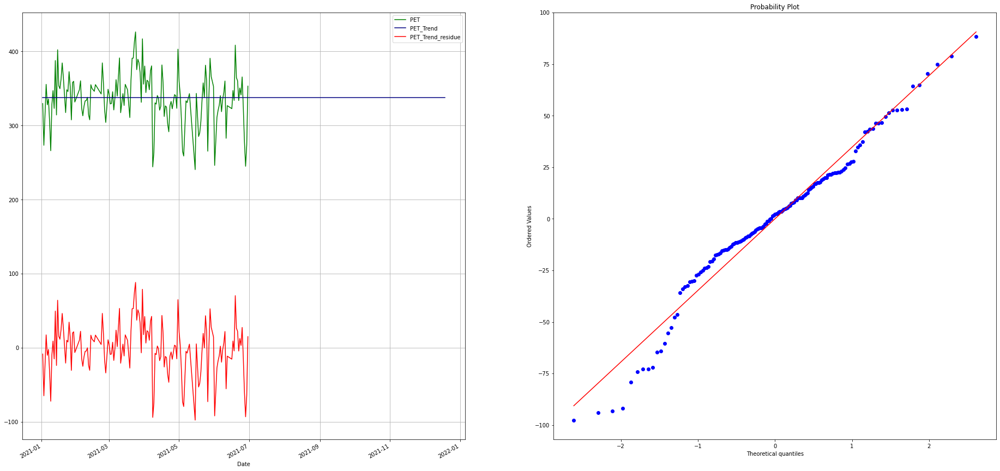

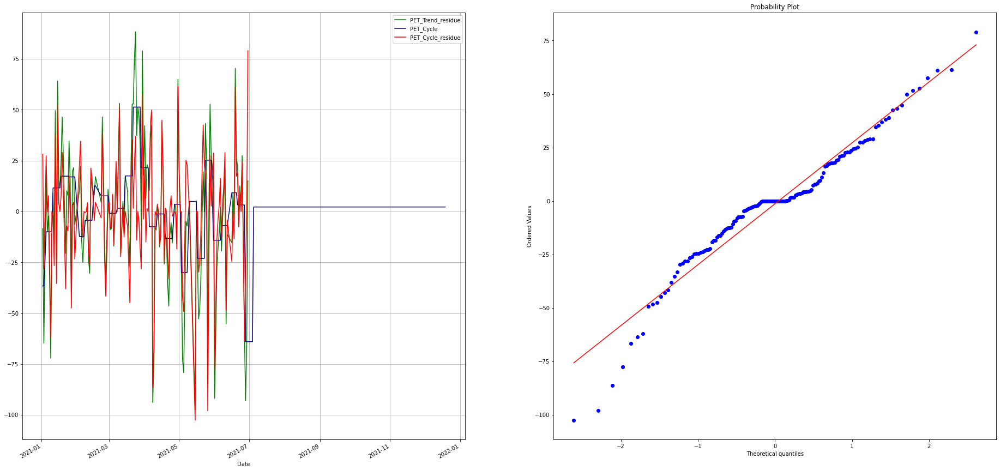

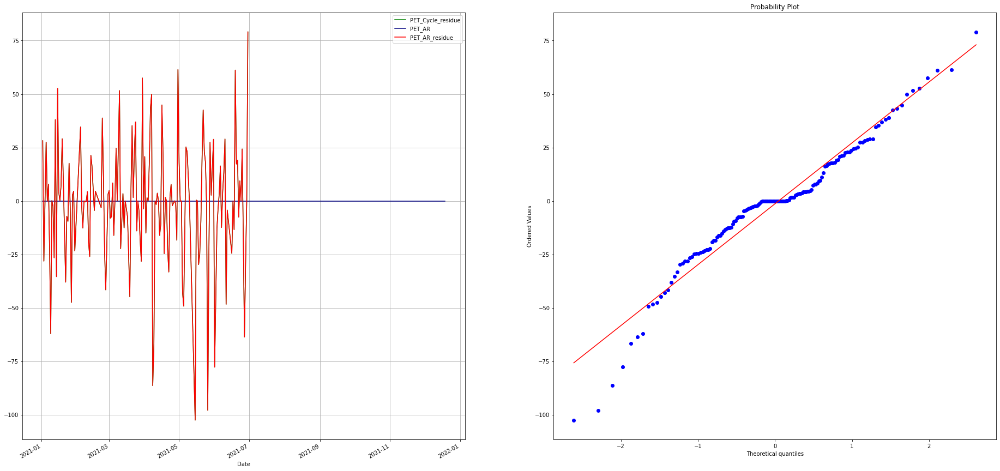

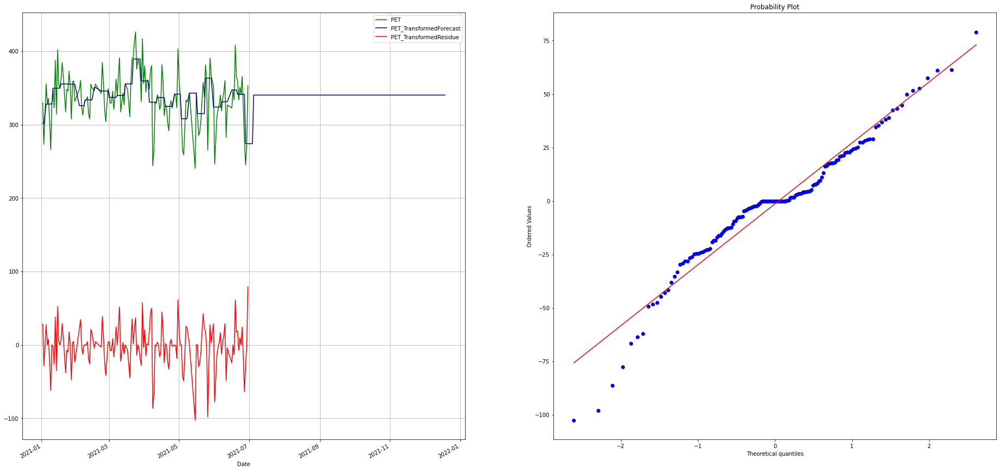

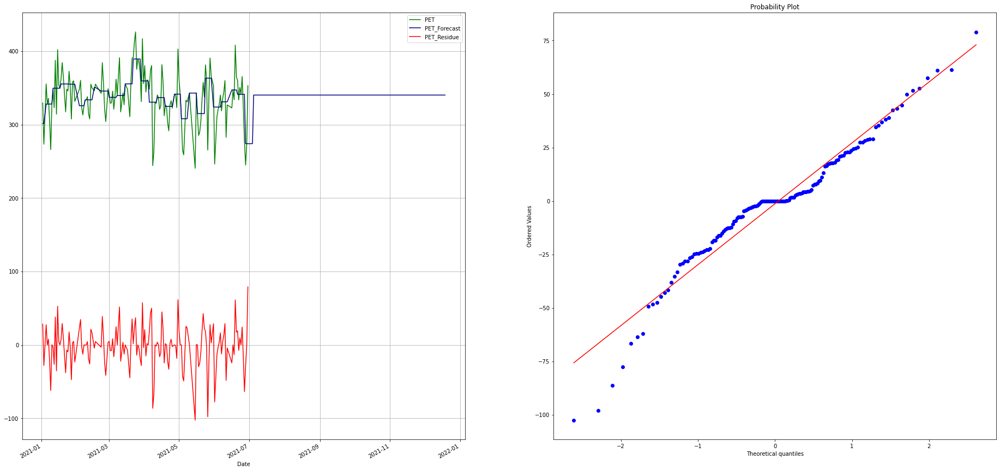

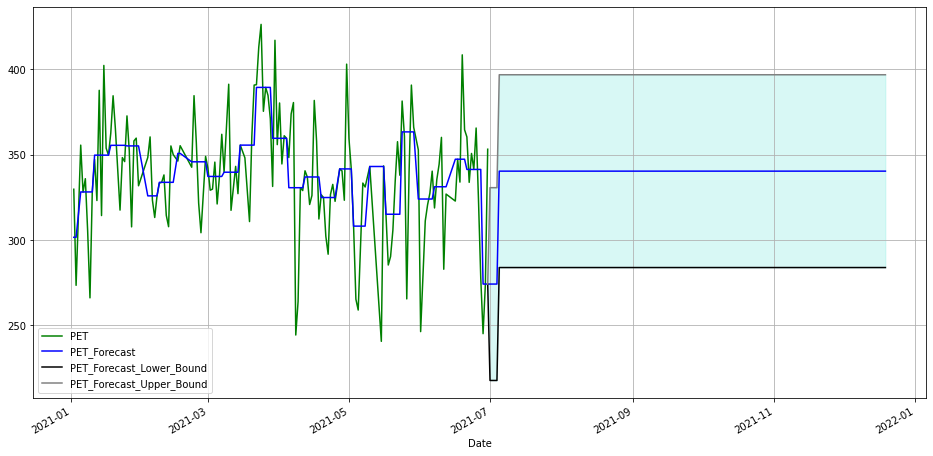

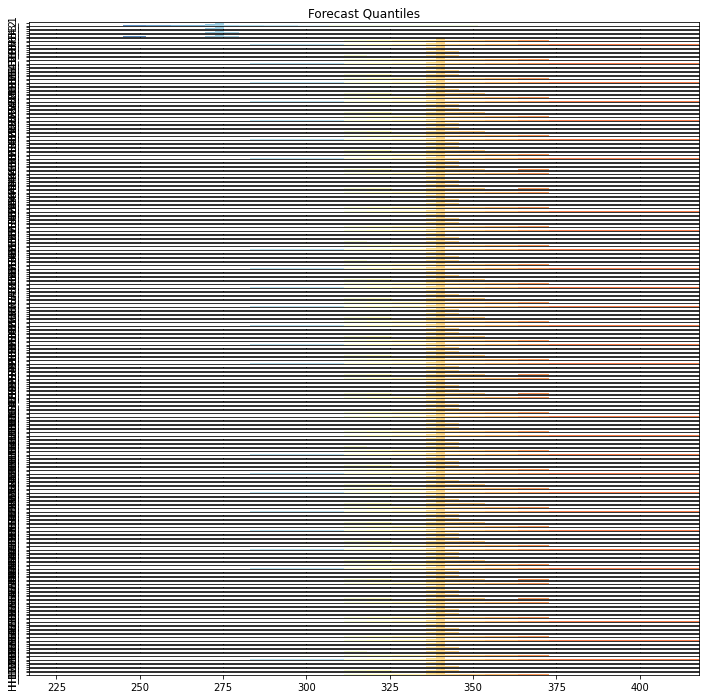

In [224]:
pet_engine.standardPlots()

In [225]:
# runtime forecast performance for NYL
nyl_engine = lEngine.mSignalHierarchy.mModels.mSignalDecomposition.mBestModels['NYL']
nyl_engine.to_dict()

{'Dataset': {'Signal': 'NYL',
  'Time': {'Horizon': 172,
   'TimeMinMax': ['2021-01-02 00:00:00', '2021-06-30 00:00:00'],
   'TimeVariable': 'Date'},
  'Training_Signal_Length': 153},
 'Model': {'AR_Model': 'NoAR',
  'Best_Decomposition': '_NYL_ConstantTrend_residue_Seasonal_WeekOfYear_residue_NoAR',
  'Cycle': 'Seasonal_WeekOfYear',
  'Signal_Transoformation': 'NoTransf',
  'Trend': 'ConstantTrend'},
 'Model_Performance': {'COMPLEXITY': '27',
  'CRPS': '10.316544221165685',
  'LnQ': '4.452330045250495',
  'MAE': '31.930751132947414',
  'MAPE': '0.1209',
  'MASE': '0.6941',
  'MedAE': '21.15780320366133',
  'RMSE': '45.66670916015107'}}

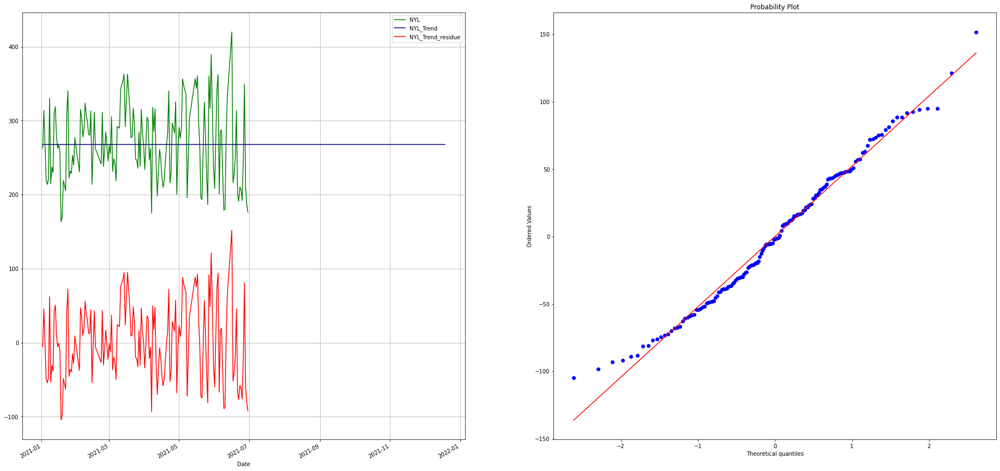

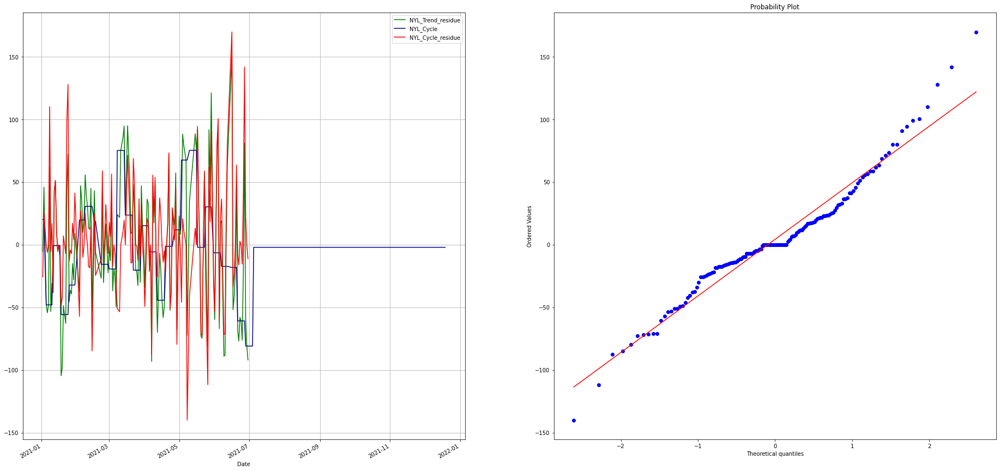

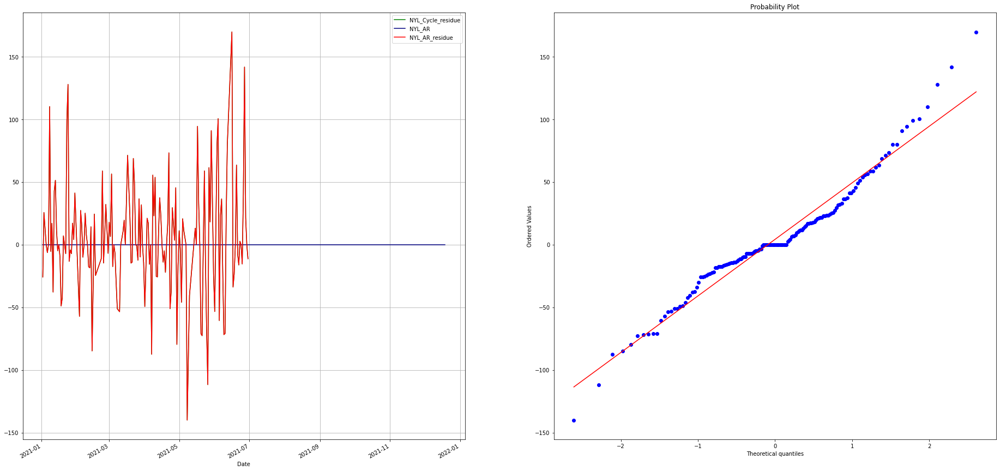

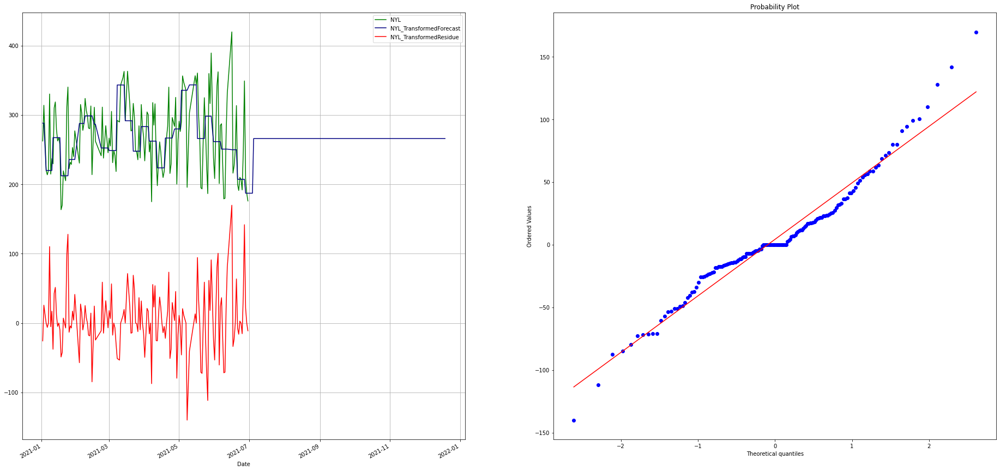

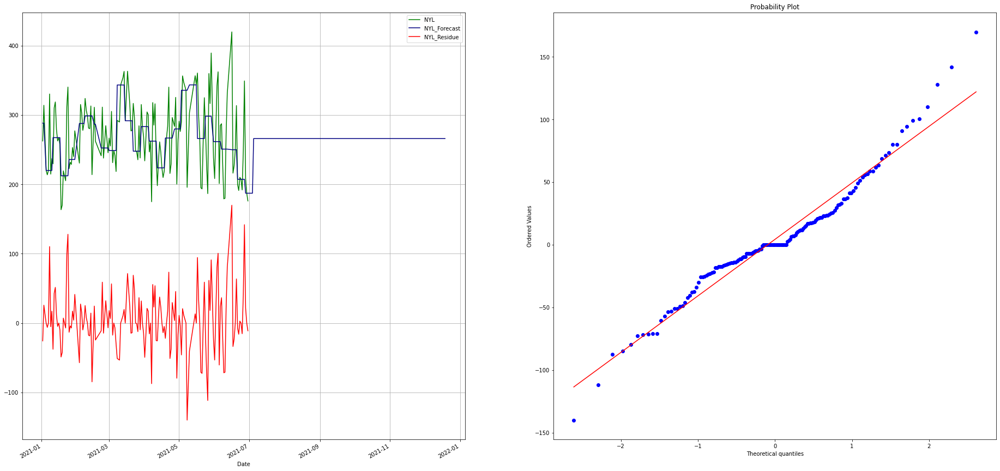

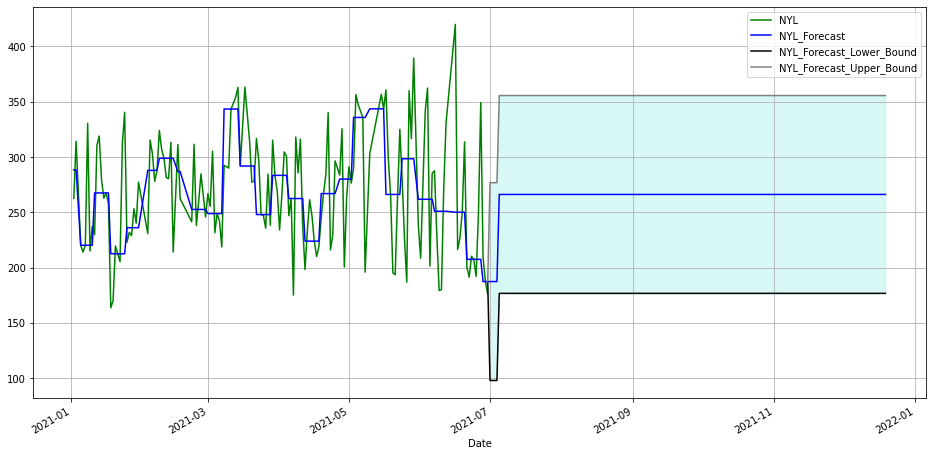

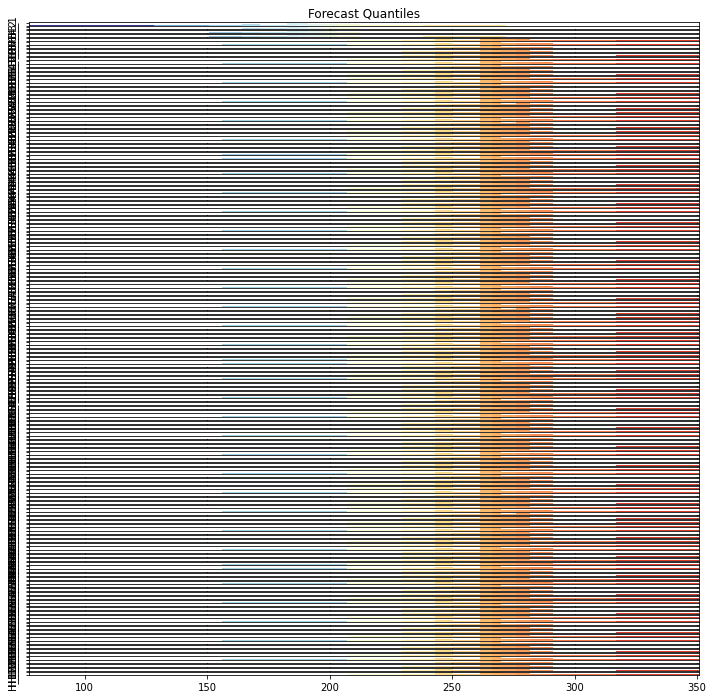

In [226]:
nyl_engine.standardPlots()

In [227]:
# runtime forecast performance for OPP
opp_engine = lEngine.mSignalHierarchy.mModels.mSignalDecomposition.mBestModels['OPP']
opp_engine.to_dict()

{'Dataset': {'Signal': 'OPP',
  'Time': {'Horizon': 172,
   'TimeMinMax': ['2021-01-02 00:00:00', '2021-06-30 00:00:00'],
   'TimeVariable': 'Date'},
  'Training_Signal_Length': 153},
 'Model': {'AR_Model': 'NoAR',
  'Best_Decomposition': '_OPP_ConstantTrend_residue_Seasonal_WeekOfYear_residue_NoAR',
  'Cycle': 'Seasonal_WeekOfYear',
  'Signal_Transoformation': 'NoTransf',
  'Trend': 'ConstantTrend'},
 'Model_Performance': {'COMPLEXITY': '27',
  'CRPS': '10.999317999146847',
  'LnQ': '5.070156840797823',
  'MAE': '33.609782849048045',
  'MAPE': '0.1359',
  'MASE': '0.7159',
  'MedAE': '24.55874187971915',
  'RMSE': '45.67142111673027'}}

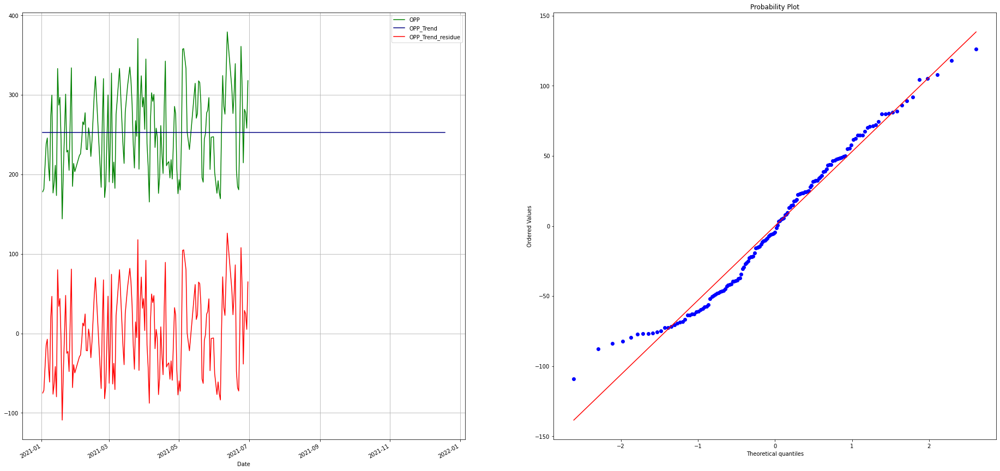

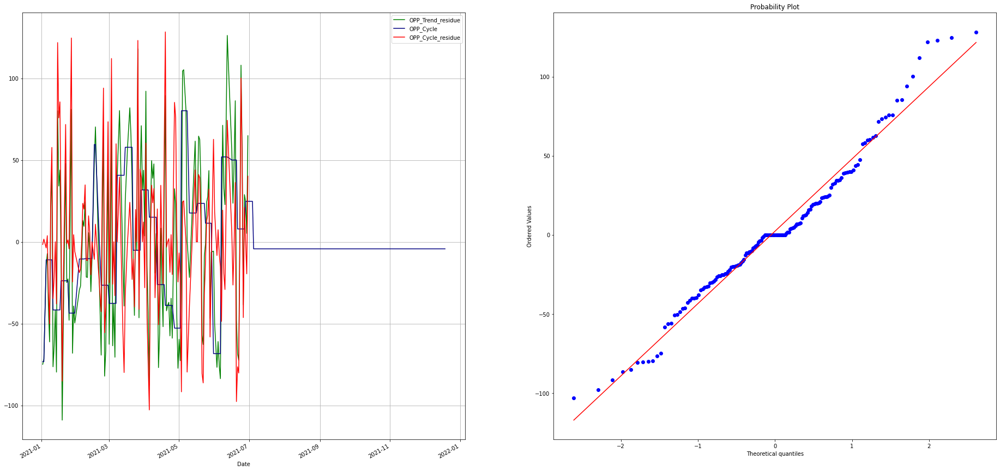

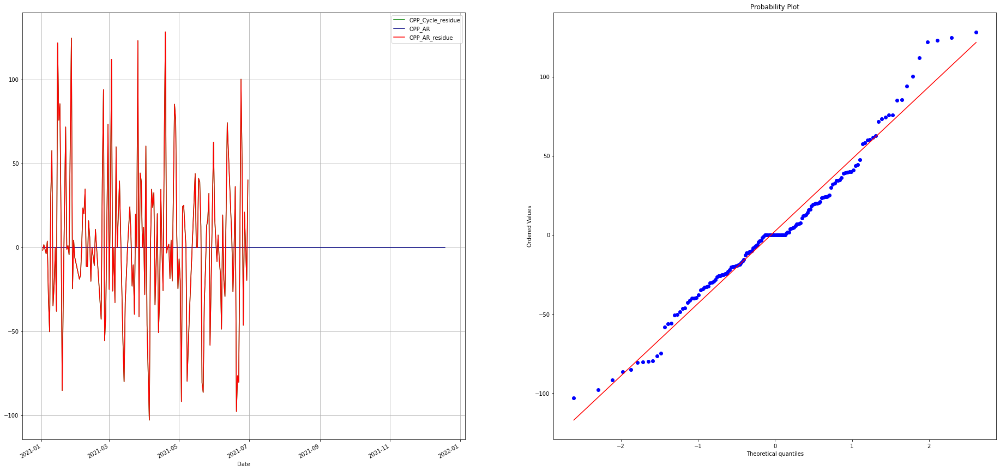

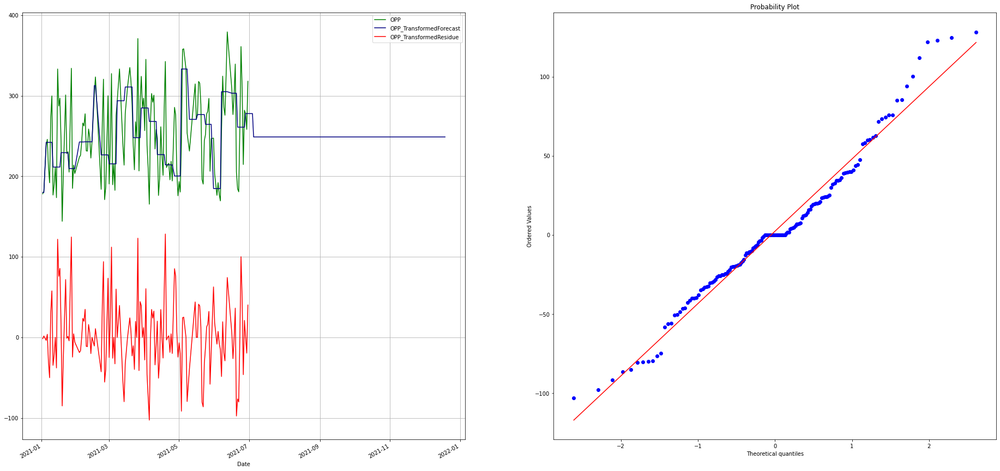

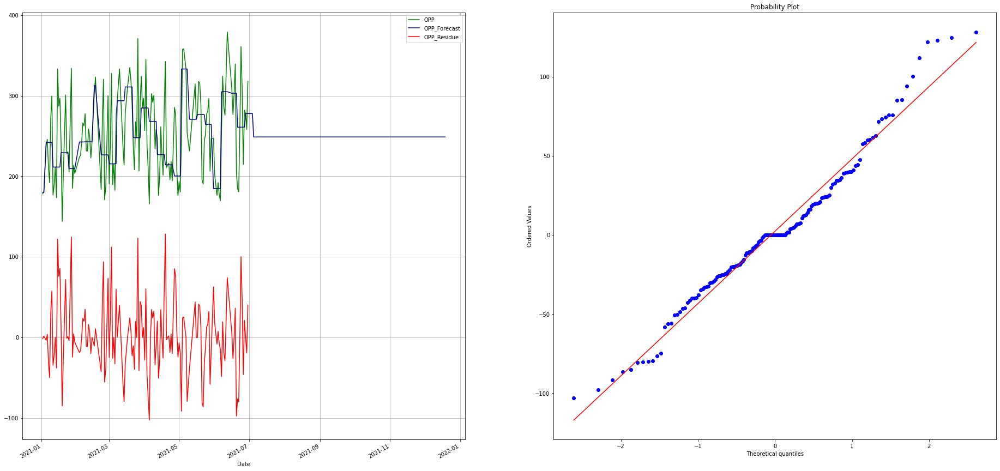

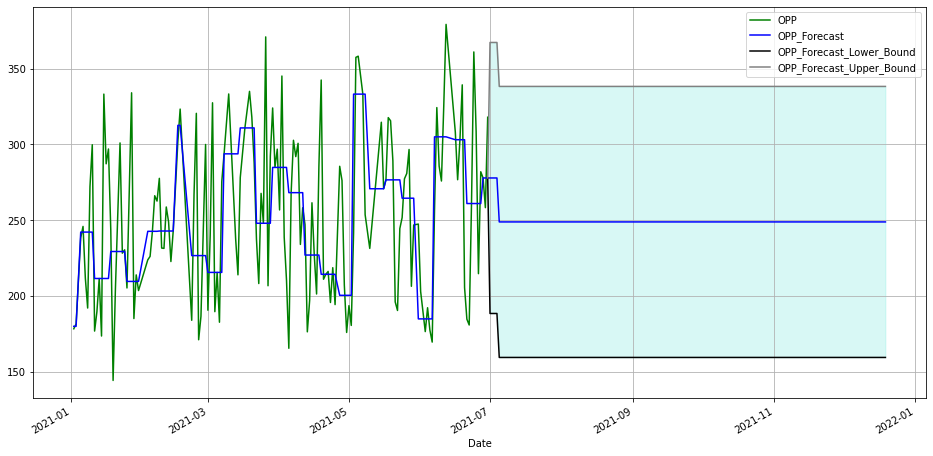

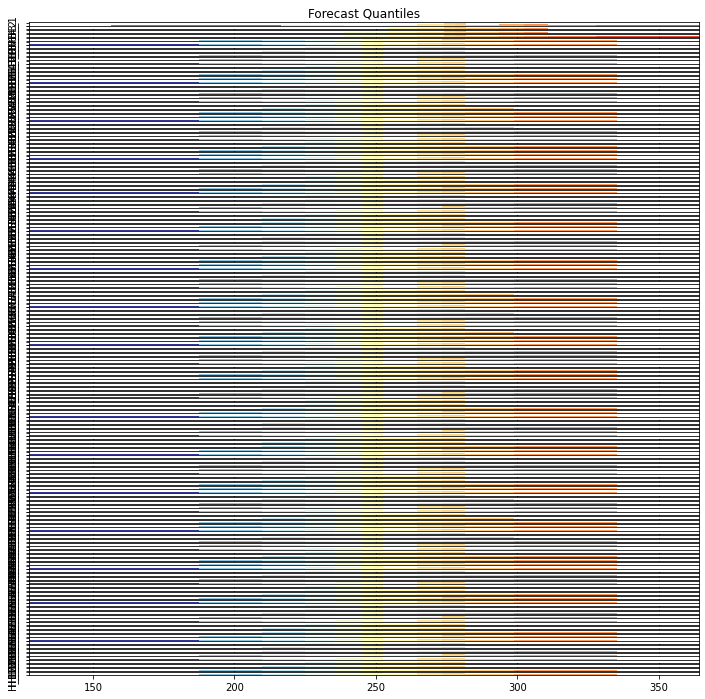

In [228]:
opp_engine.standardPlots()

## **Forecast**

In [229]:
dfapp_out = lEngine.forecast(test, 1);

INFO:pyaf.std:START_HIERARCHICAL_FORECASTING
INFO:pyaf.std:START_FORECASTING '['NYL', 'OPP', 'PET', 'SPEED']'
INFO:pyaf.std:END_FORECAST_TIME_IN_SECONDS  '['NYL', 'OPP', 'PET', 'SPEED']' 1.4910893440246582
INFO:pyaf.hierarchical:FORECASTING_HIERARCHICAL_MODEL_COMBINATION_METHODS ['BU']
INFO:pyaf.hierarchical:FORECASTING_HIERARCHICAL_MODEL_BOTTOM_UP_METHOD BU
INFO:pyaf.std:END_HIERARCHICAL_FORECAST_TIME_IN_SECONDS 1.507840871810913


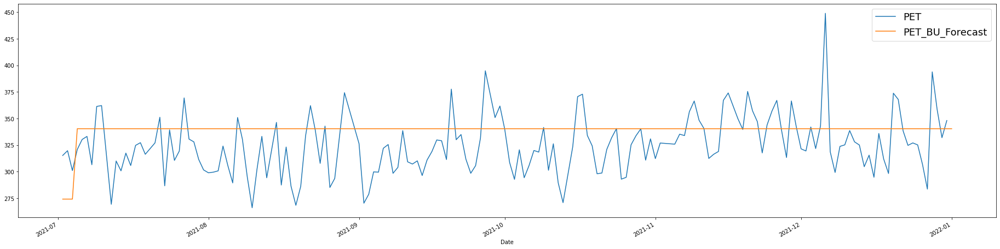

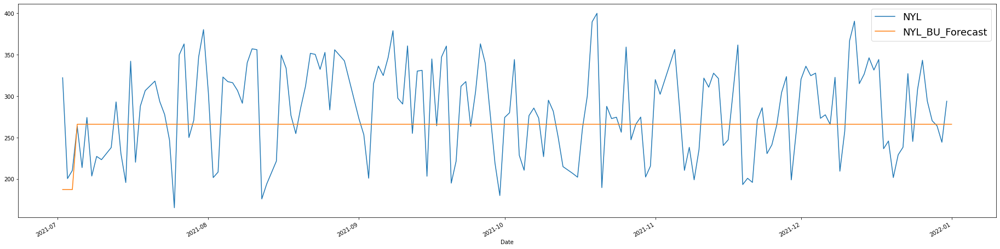

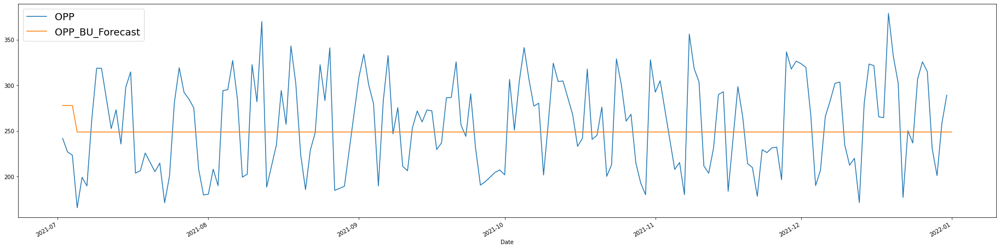

In [230]:
for f in films:
    dfapp_out.plot('Date',[f, f + '_BU_Forecast'],  figsize=(32 , 8)).legend(fontsize=18)

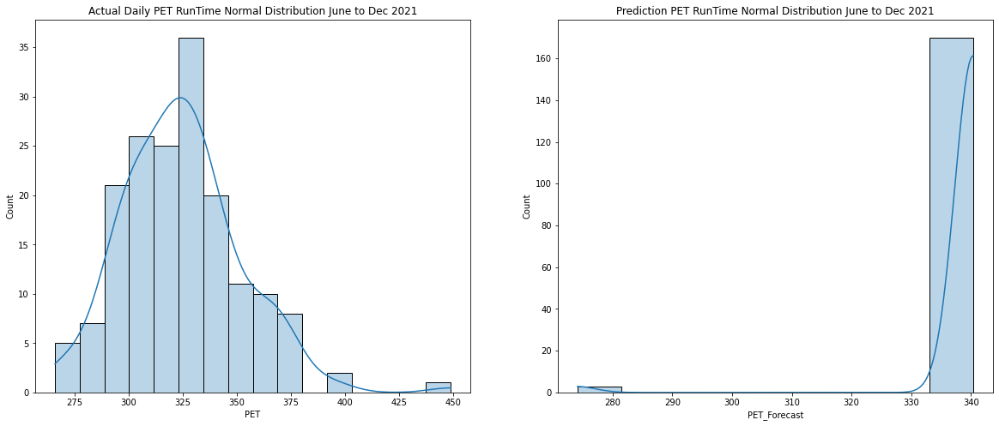

In [231]:
# plotting Speed normal dist per material

f, axarr = plt.subplots(nrows=1,ncols=2,figsize=(20, 8))
# plot actual data
sns.histplot(dfapp_out['PET'], ax = axarr[0],kde=True,alpha=0.3)
axarr[0].set_title('Actual Daily PET RunTime Normal Distribution June to Dec 2021')


# plot forecasted data
sns.histplot(dfapp_out['PET_Forecast'], ax = axarr[1],kde=True,alpha=0.3)
axarr[1].set_title('Prediction PET RunTime Normal Distribution June to Dec 2021')


plt.show()

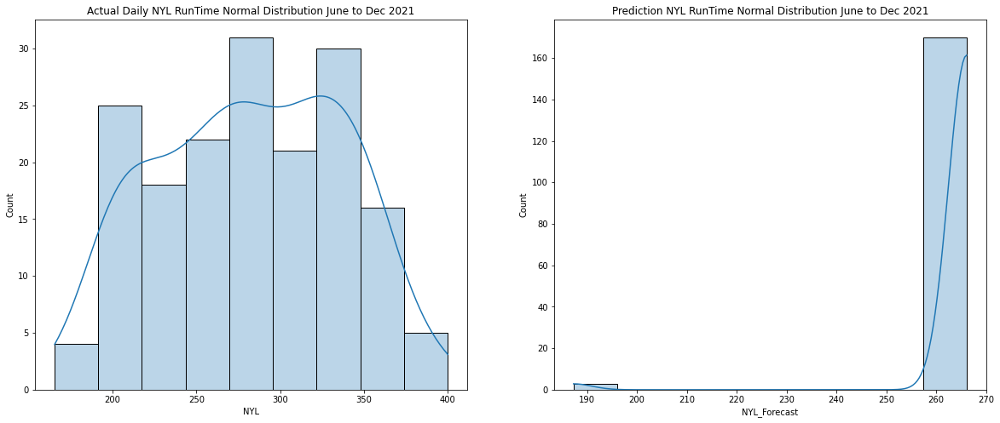

In [232]:
# plotting Speed normal dist per material

f, axarr = plt.subplots(nrows=1,ncols=2,figsize=(20, 8))
# plot actual data
sns.histplot(dfapp_out['NYL'], ax = axarr[0],kde=True,alpha=0.3)
axarr[0].set_title('Actual Daily NYL RunTime Normal Distribution June to Dec 2021')


# plot forecasted data
sns.histplot(dfapp_out['NYL_Forecast'], ax = axarr[1],kde=True,alpha=0.3)
axarr[1].set_title('Prediction NYL RunTime Normal Distribution June to Dec 2021')


plt.show()

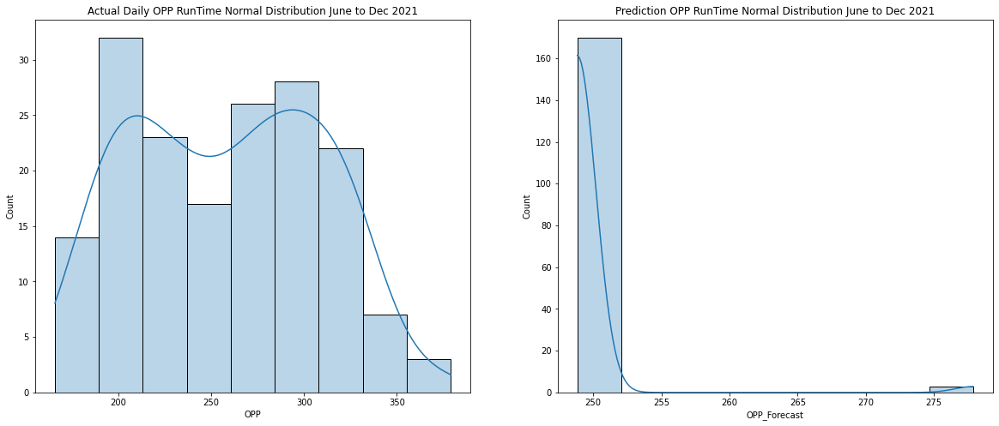

In [233]:
# plotting Speed normal dist per material

f, axarr = plt.subplots(nrows=1,ncols=2,figsize=(20, 8))
# plot actual data
sns.histplot(dfapp_out['OPP'], ax = axarr[0],kde=True,alpha=0.3)
axarr[0].set_title('Actual Daily OPP RunTime Normal Distribution June to Dec 2021')

# plot forecasted data
sns.histplot(dfapp_out['OPP_Forecast'], ax = axarr[1],kde=True,alpha=0.3)
axarr[1].set_title('Prediction OPP RunTime Normal Distribution June to Dec 2021')
plt.show()

# **teks tebal**

In [115]:
idx = pd.date_range('2021-01-01', '2021-12-31')
pet = run[run['FILM']=='PET'].pivot_table(values='RunTime', index='Date', fill_value=0, aggfunc=np.sum)
pet = pet.reindex(idx, fill_value=0).reset_index()
nyl = run[run['FILM']=='NYL'].pivot_table(values='RunTime', index='Date', fill_value=0, aggfunc=np.sum)
nyl = nyl.reindex(idx, fill_value=0).reset_index()
opp = run[run['FILM']=='OPP'].pivot_table(values='RunTime', index='Date', fill_value=0, aggfunc=np.sum)
opp = opp.reindex(idx, fill_value=0).reset_index()

In [118]:
from darts import TimeSeries

pet_series = TimeSeries.from_dataframe(pet, 'index','RunTime')
nyl_series = TimeSeries.from_dataframe(nyl, 'index','RunTime')
opp_series = TimeSeries.from_dataframe(opp, 'index','RunTime')

In [177]:
from darts.dataprocessing.transformers import Scaler
scaler= Scaler()
series_pet_scaled = scaler.fit_transform(pet_series)
series_nyl_scaled = scaler.fit_transform(nyl_series)
series_opp_scaled = scaler.fit_transform(opp_series)

In [178]:
train_pet, val_pet = series_pet_scaled[:-73], series_pet_scaled[-73:]
train_nyl, val_nyl = series_nyl_scaled[:-73], series_nyl_scaled[-73:]
train_opp, val_opp = series_opp_scaled[:-73], series_opp_scaled[-73:]

In [179]:
from darts.models import NBEATSModel
model= NBEATSModel(input_chunk_length=60, output_chunk_length=30, n_epochs=100, random_state=0)
model.fit([train_pet,train_nyl,train_opp])

[2022-02-22 07:19:27,433] INFO | darts.models.forecasting.torch_forecasting_model | Train dataset contains 609 samples.
[2022-02-22 07:19:27,433] INFO | darts.models.forecasting.torch_forecasting_model | Train dataset contains 609 samples.
[2022-02-22 07:19:27,540] INFO | darts.models.forecasting.torch_forecasting_model | Time series values are 64-bits; casting model to float64.
[2022-02-22 07:19:27,540] INFO | darts.models.forecasting.torch_forecasting_model | Time series values are 64-bits; casting model to float64.
GPU available: False, used: False
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs

  | Name      | Type       | Params
-----------------------------------------
0 | criterion | MSELoss    | 0     
1 | stacks    | ModuleList | 6.5 M 
-----------------------------------------
6.5 M     Trainable params
1.6 K     Non-trainable params
6.5 M     Total params
51.864    Total estimated model params size (MB)


Training: 0it [00:00, ?it/s]

Predicting: 20it [00:00, ?it/s]

RMSE = 0.198
MAE = 0.155
MSE = 0.039
SMAPE = 30.397
OPE = 3.549%


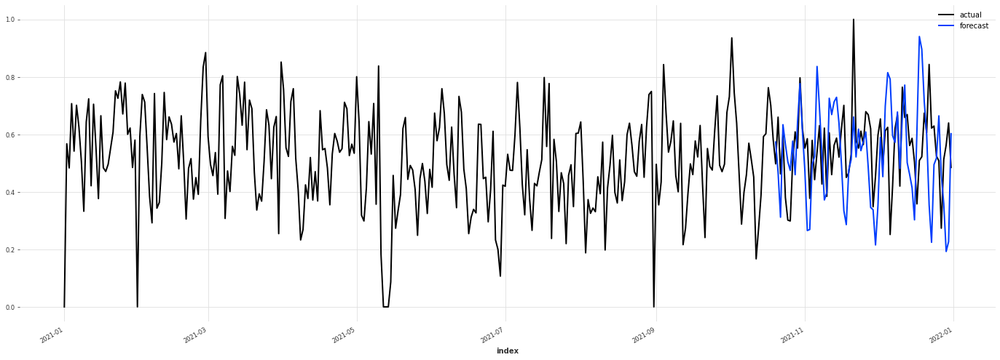

In [211]:
from darts.metrics import rmse,mae,mse,smape,ope
pred = model.predict(n=73, series=train_pet)

pred_scaled = scaler.inverse_transform(pred)
pred_scaled.to_csv('/content/pred_pet.csv')

plt.figure(figsize=(24,8))
series_pet_scaled.plot(label="actual")
pred.plot(label="forecast")
plt.legend()

print("RMSE = {:.3f}".format(rmse(series_pet_scaled, pred)))
print("MAE = {:.3f}".format(mae(series_pet_scaled, pred)))
print("MSE = {:.3f}".format(mse(series_pet_scaled, pred)))
print("SMAPE = {:.3f}".format(smape(series_pet_scaled, pred)))
print("OPE = {:.3f}%".format(ope(series_pet_scaled, pred)))

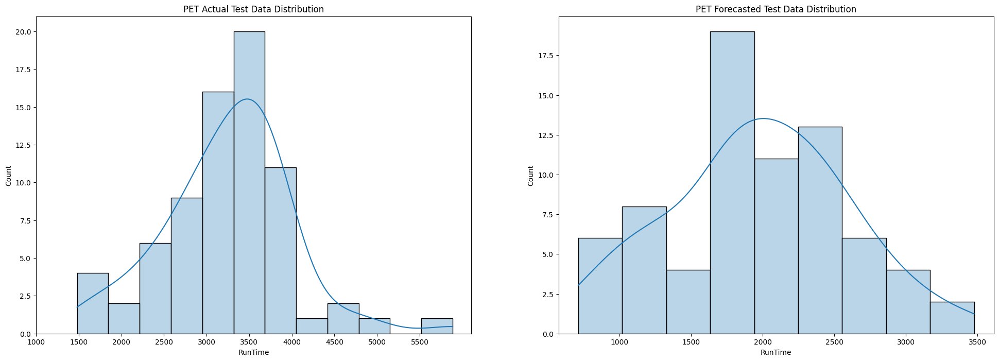

In [213]:
import matplotlib.style
import matplotlib as mpl
mpl.style.use('default')

pred_pet = pd.read_csv('/content/pred_pet.csv')

f, axarr = plt.subplots(nrows=1,ncols=2,figsize=(24, 8))
# plot actual test data
sns.histplot(pet.iloc[-73:,1], ax = axarr[0],kde=True,alpha=0.3)
axarr[0].set_title('PET Actual Test Data Distribution')
axarr[0].set_xticks(np.arange(start=1000,stop=6000,step=500))

# plot forecasted test data
sns.histplot(pred_pet['RunTime'], ax = axarr[1],kde=True,alpha=0.3)
axarr[1].set_title('PET Forecasted Test Data Distribution')
axarr[1].set_xticks(np.arange(start=1000,stop=4000,step=500))

plt.show()

Predicting: 20it [00:00, ?it/s]

RMSE = 0.231
MAE = 0.186
MSE = 0.053
SMAPE = 87.69%
OPE = 24.920%


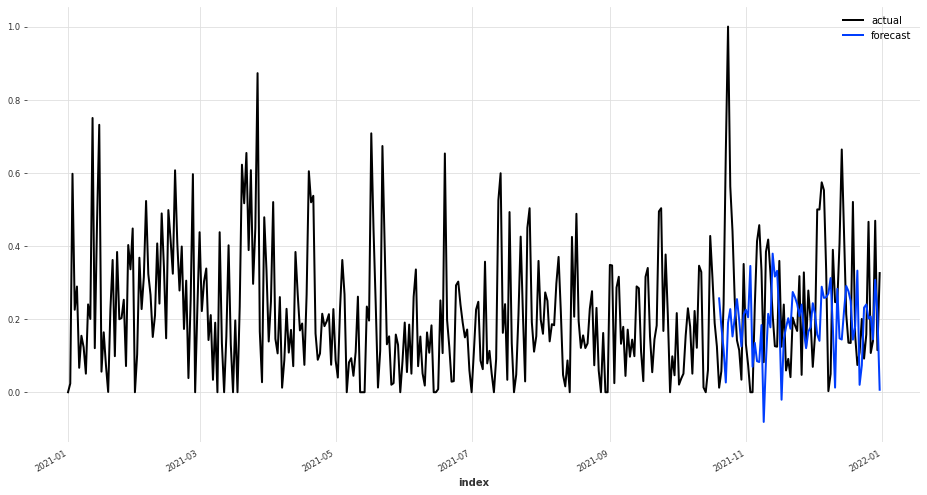

In [194]:
pred = model.predict(n=73, series=train_nyl)

plt.figure(figsize=(16,8))
series_nyl_scaled.plot(label="actual")
pred.plot(label="forecast")
plt.legend()

print("RMSE = {:.3f}".format(rmse(series_nyl_scaled, pred)))
print("MAE = {:.3f}".format(mae(series_nyl_scaled, pred)))
print("MSE = {:.3f}".format(mse(series_nyl_scaled, pred)))
print("SMAPE = {:.2f}".format(smape(series_nyl_scaled, pred)))
print("OPE = {:.3f}%".format(ope(series_nyl_scaled, pred)))

Predicting: 20it [00:00, ?it/s]

RMSE = 0.272
MAE = 0.234
MSE = 0.074
SMAPE = 83.19%
OPE = 66.267%


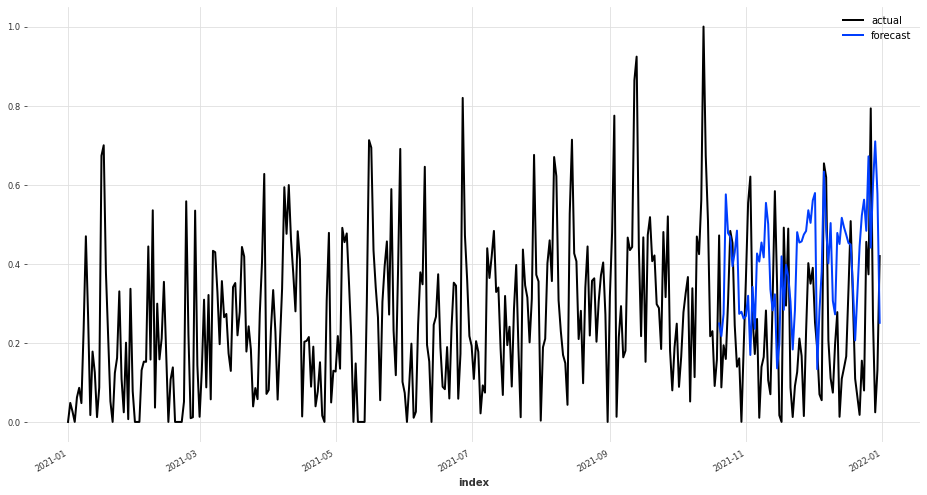

In [196]:
pred = model.predict(n=73, series=train_opp)

plt.figure(figsize=(16,8))
series_opp_scaled.plot(label="actual")
pred.plot(label="forecast")
plt.legend()

print("RMSE = {:.3f}".format(rmse(series_opp_scaled, pred)))
print("MAE = {:.3f}".format(mae(series_opp_scaled, pred)))
print("MSE = {:.3f}".format(mse(series_opp_scaled, pred)))
print("SMAPE = {:.2f}".format(smape(series_opp_scaled, pred)))
print("OPE = {:.3f}%".format(ope(series_opp_scaled, pred)))

In [ ]:
import matplotlib.style
import matplotlib as mpl
mpl.style.use('default')

pred_pet = pd.read_csv('/content/pred_pet.csv')

f, axarr = plt.subplots(nrows=1,ncols=2,figsize=(24, 8))
# plot material PET
sns.histplot(pet.iloc[-73:,1], ax = axarr[0],kde=True,alpha=0.3)
axarr[0].set_title('PET Actual Test Data Distribution')
axarr[0].set_xticks(np.arange(start=1000,stop=6000,step=500))

# plot material NYL
sns.histplot(pred_pet['RunTime'], ax = axarr[1],kde=True,alpha=0.3)
axarr[1].set_title('PET Forecasted Test Data Distribution')
axarr[1].set_xticks(np.arange(start=1000,stop=4000,step=500))

plt.show()